MathCont

Сергей Кузнецов "Хаос"

In [135]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [137]:
from wavelets import *
from draws import *
from chaos_searh import *
from BP_dynamics import *
import pywt
import scipy as sp
import scipy.ndimage
from tqdm import tqdm

In [11]:
plt.rcParams.update({'font.size': 25})

### Определим параметры системы


In [12]:
Iext = 0.5 # возбуждающий импульс на пирамидальную клетку (P)
G = 0.5 # проводимость мембран -- определяют относительный вклад клетки в динамику ансамбля
Eex = 0 # напряжение на выходной клетке (P) -- для активаторной, возбуждающей клетки
Ein = -5 # напряжение на входной клетке (B) -- для ингибиторной, тормозящей клетки
eps = 0.3 # временной масштаб осцилляций (отношение быстрой переменной к медленной)
a = 0.5 # параметры кинетики суммарного ионного тока u
b = 0.8 # параметры кинетики суммарного ионного тока u
A = 1 # синаптический параметрб ответственный за приток (B -- за отток)
vsl = 0.1 # синаптический параметр (открытие синапсов быстрее чем закрытие)

### Будем исследовать динамику при $Bbp = 0.02...0.12$

In [160]:
def dist(x, x0, n):
    return abs(n / np.linalg.norm(n) @ (x - x0))

Bbp:  0.06


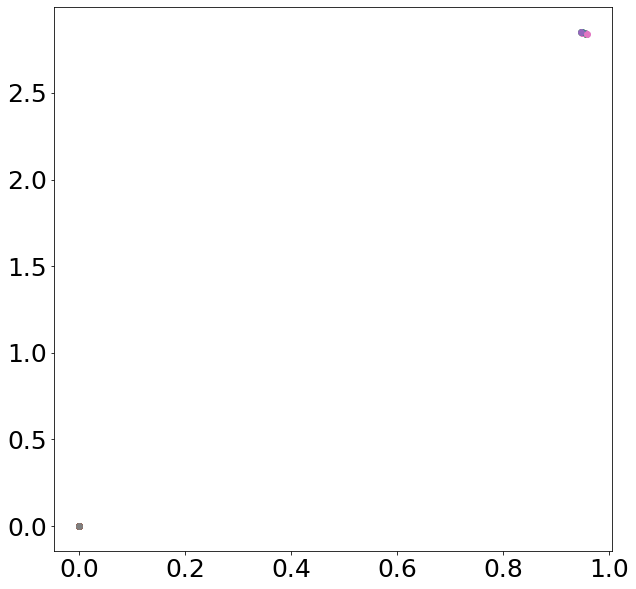

Bbp:  0.061


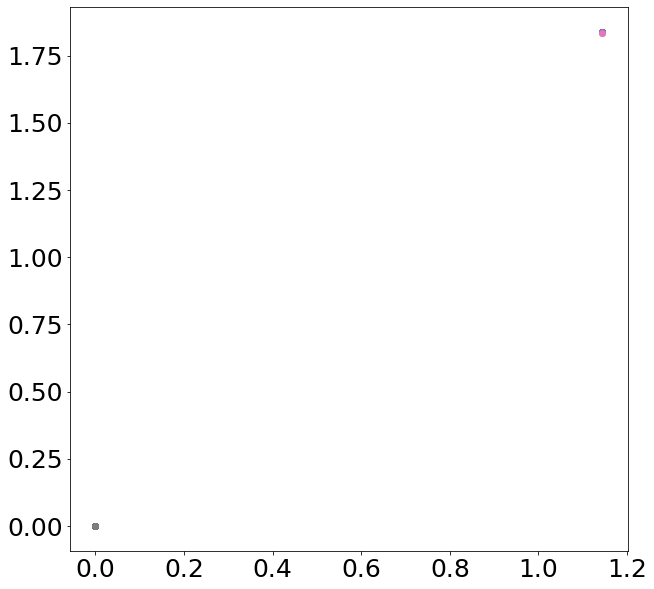

Bbp:  0.062


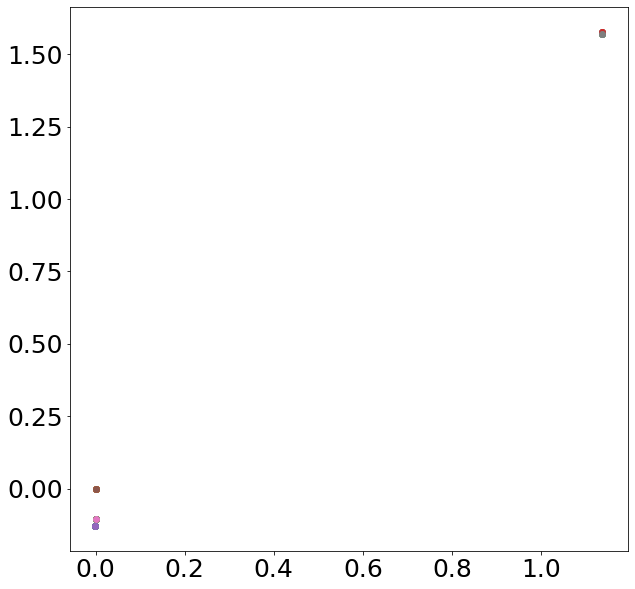

Bbp:  0.063


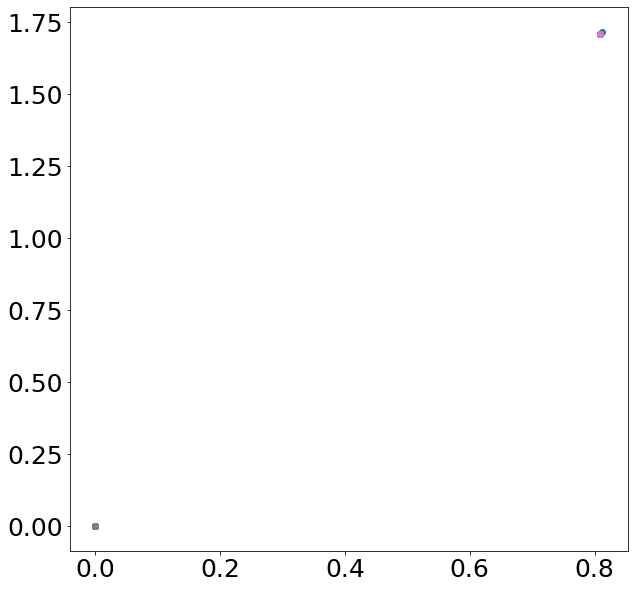

Bbp:  0.064


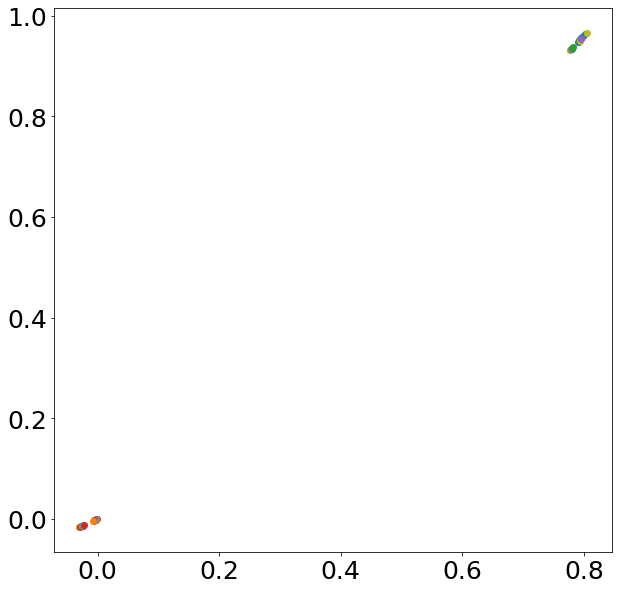

Bbp:  0.065


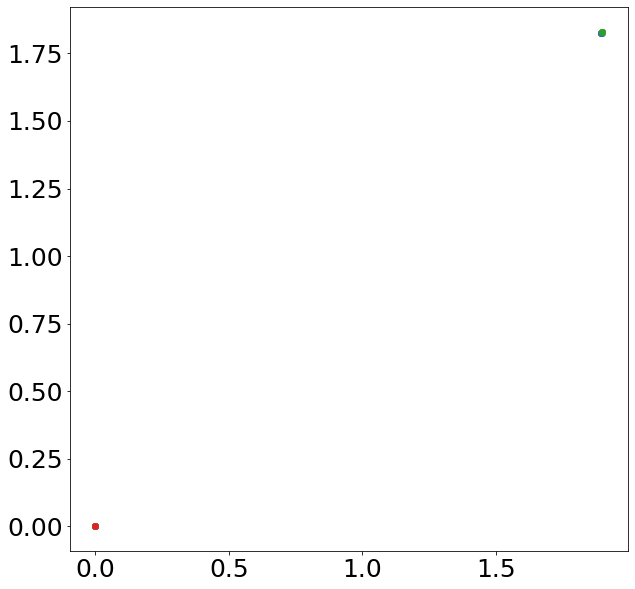

Bbp:  0.066


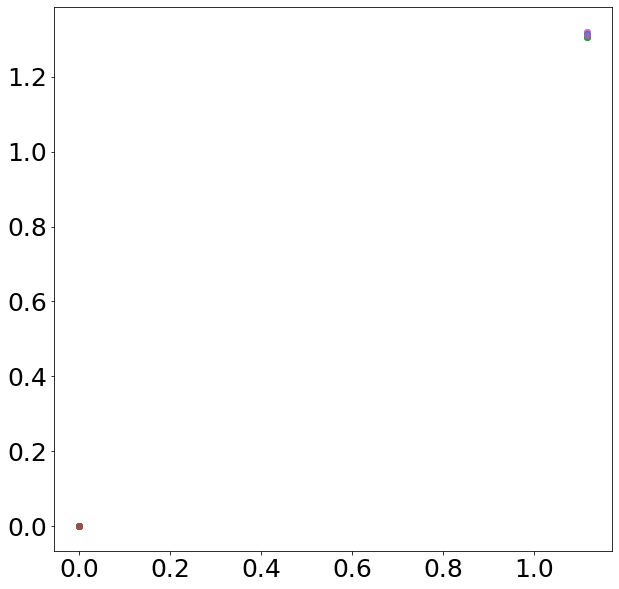

Bbp:  0.067


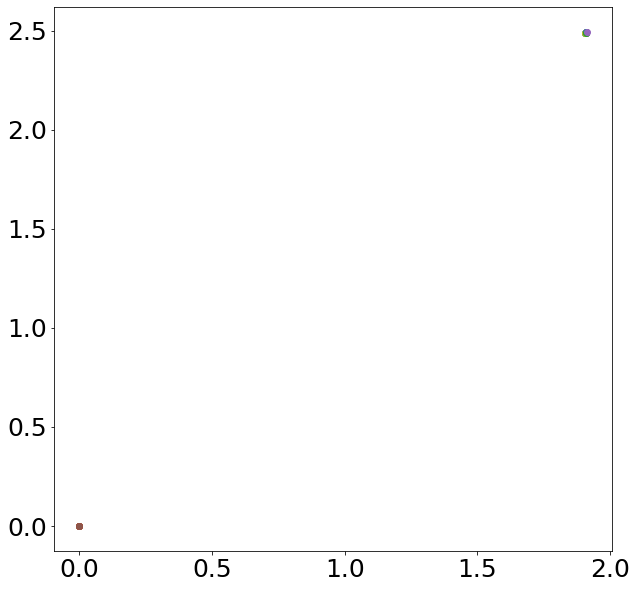

Bbp:  0.068


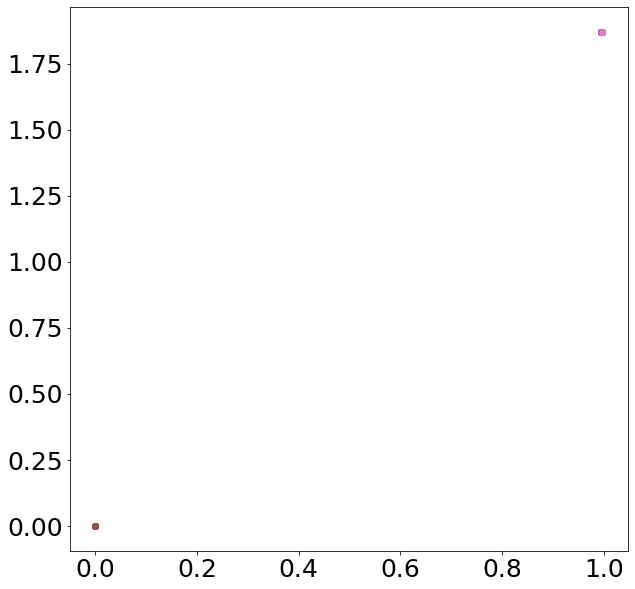

Bbp:  0.069


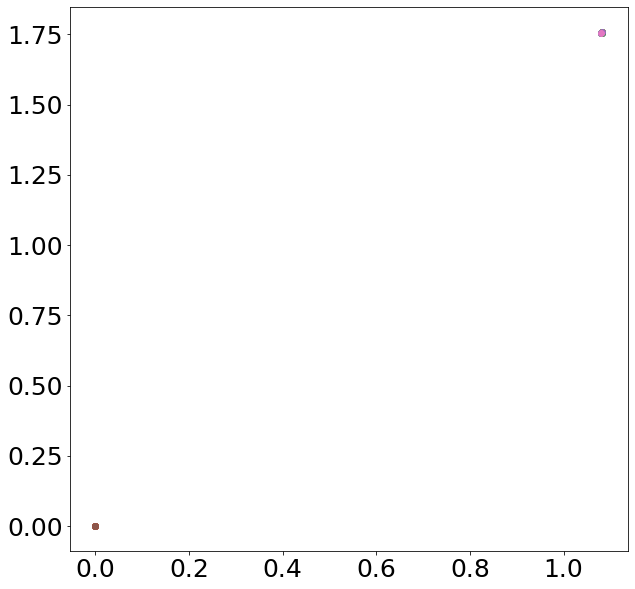

Bbp:  0.07


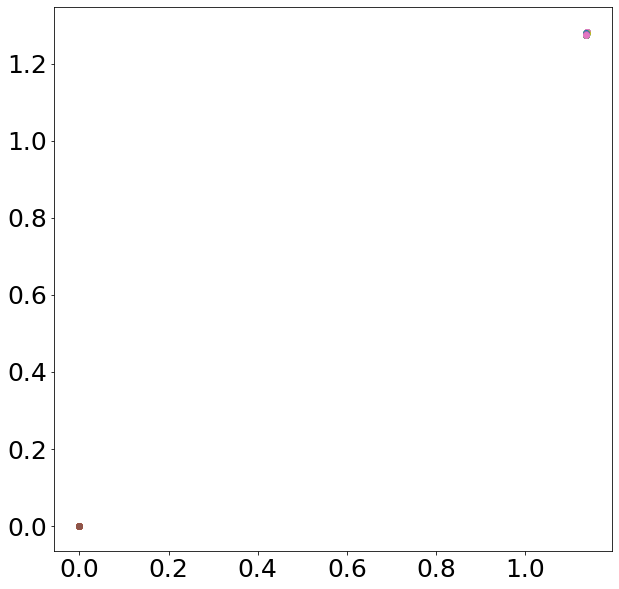

Bbp:  0.07100000000000001


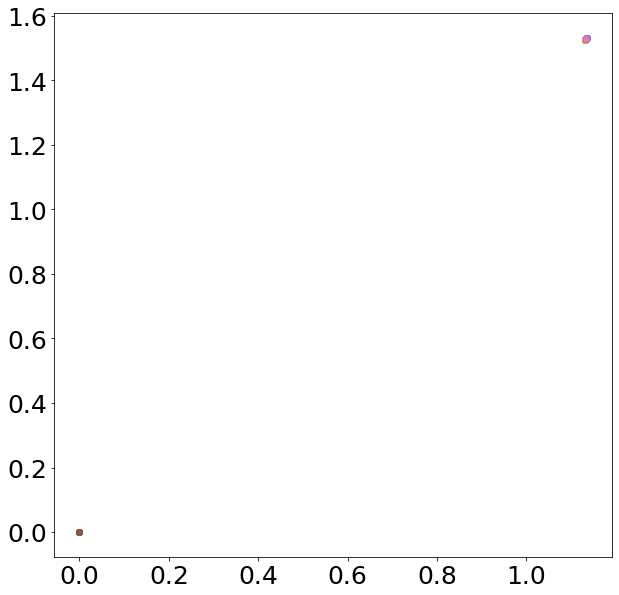

Bbp:  0.07200000000000001


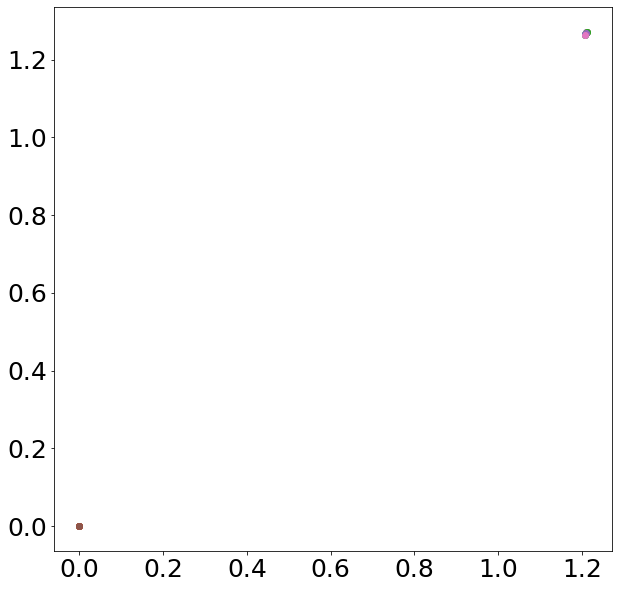

Bbp:  0.07300000000000001


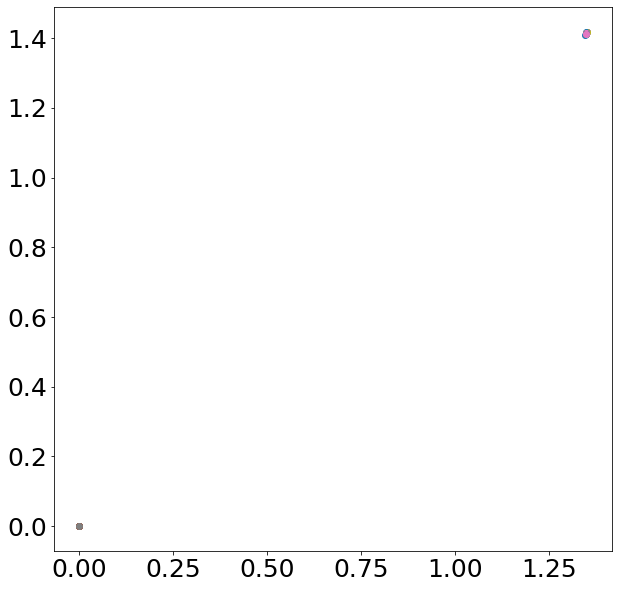

Bbp:  0.07400000000000001


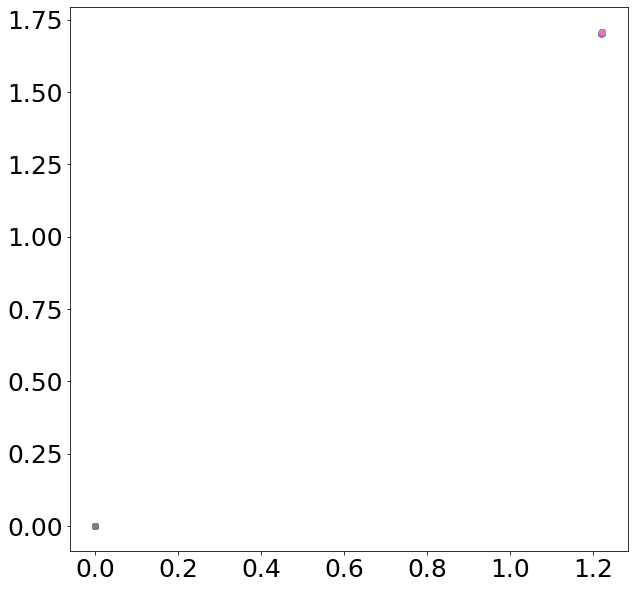

Bbp:  0.07500000000000001


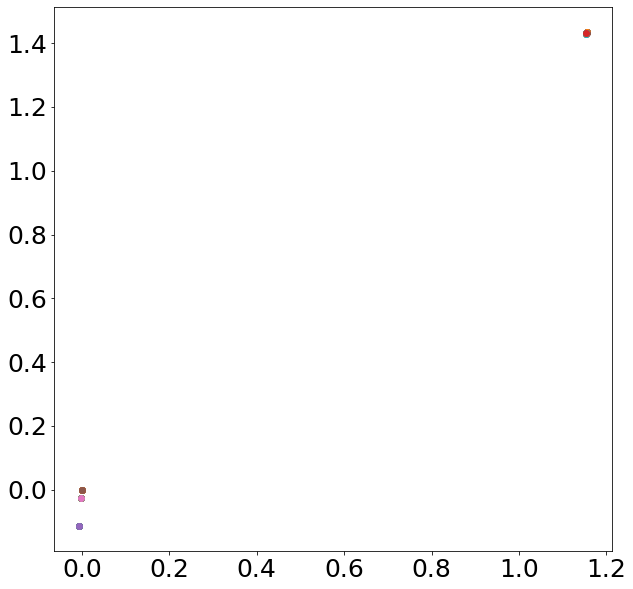

Bbp:  0.07600000000000001


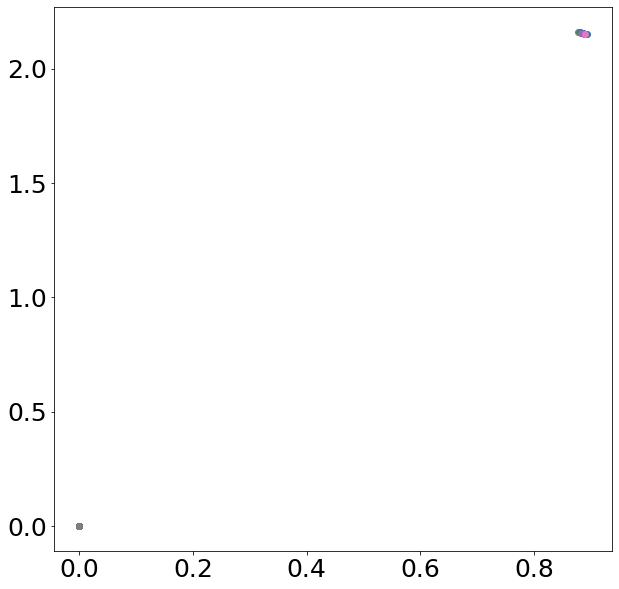

Bbp:  0.07700000000000001


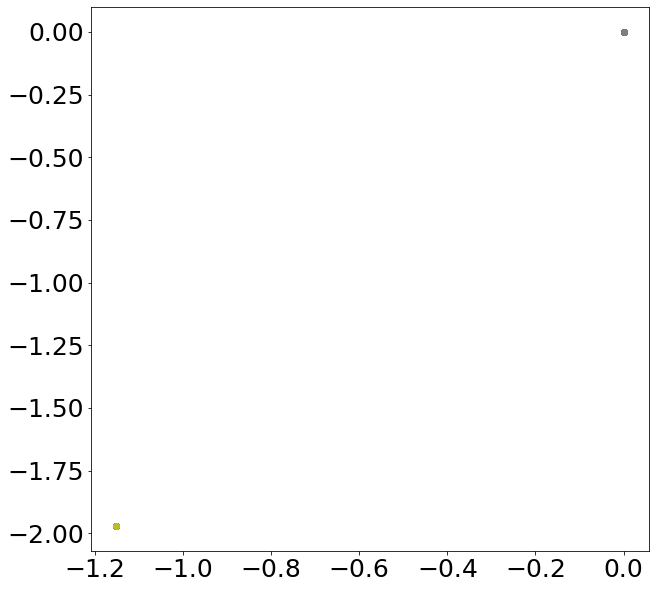

Bbp:  0.07800000000000001


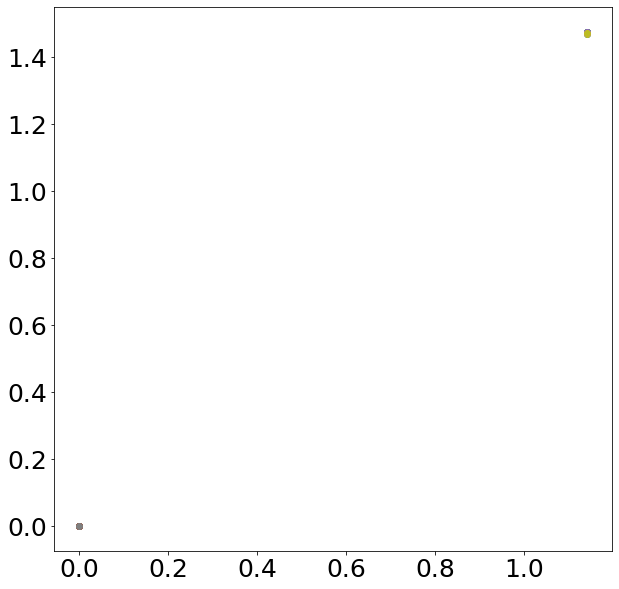

Bbp:  0.07900000000000001


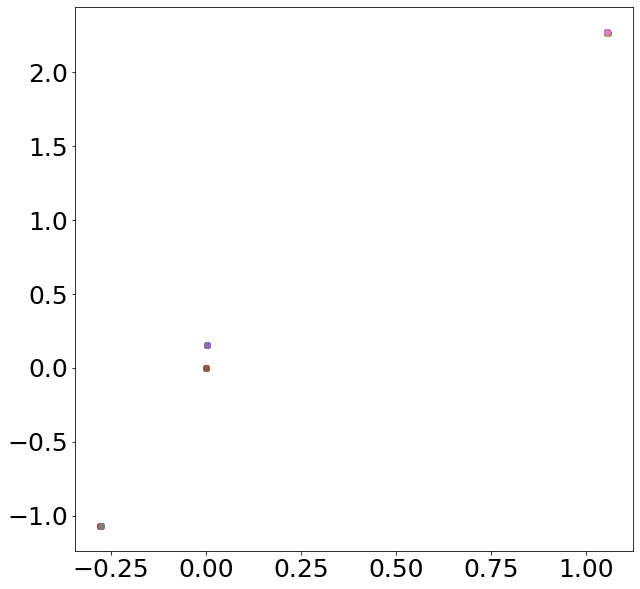

Bbp:  0.08000000000000002


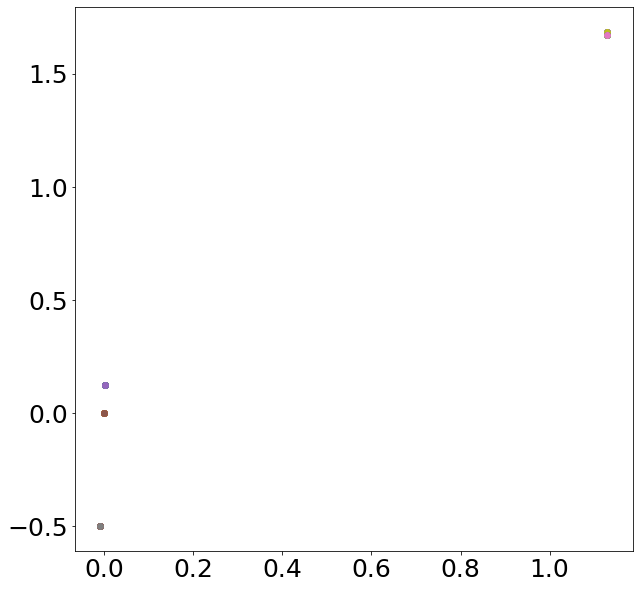

Bbp:  0.08100000000000002


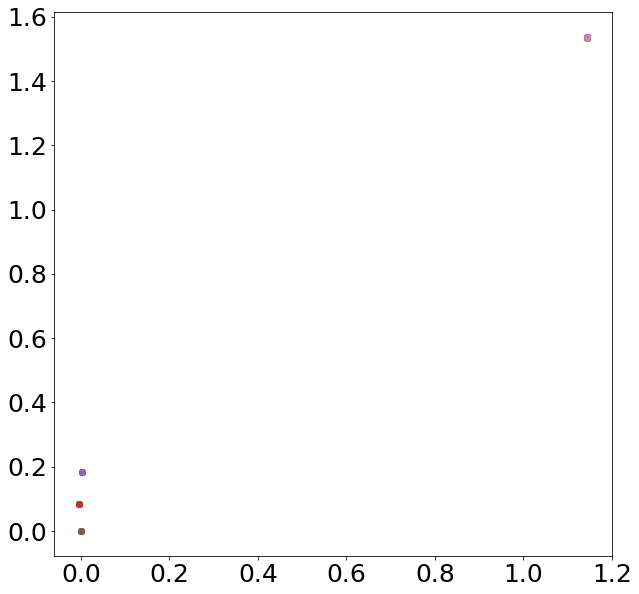

Bbp:  0.08200000000000002


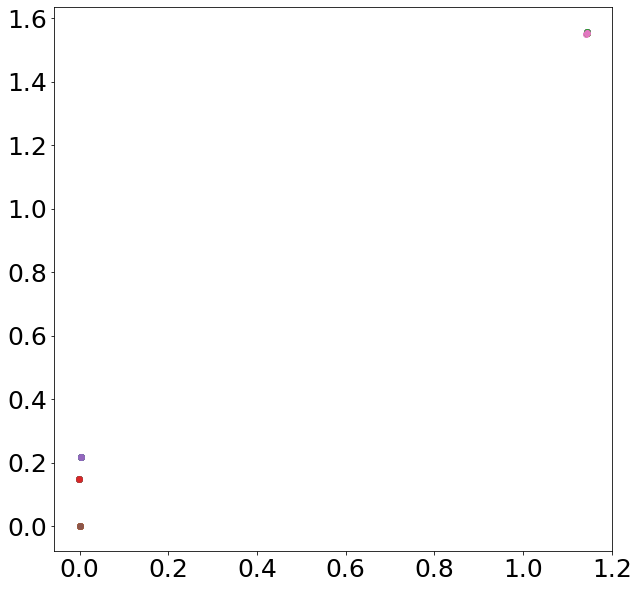

Bbp:  0.08300000000000002


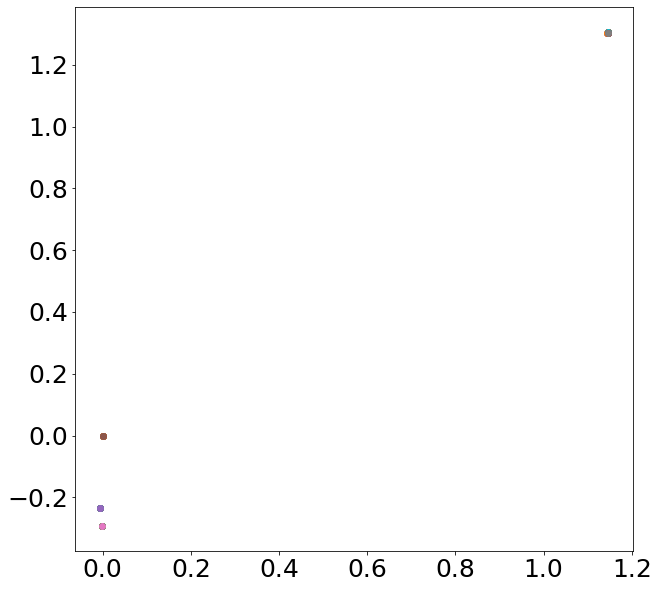

Bbp:  0.08400000000000002


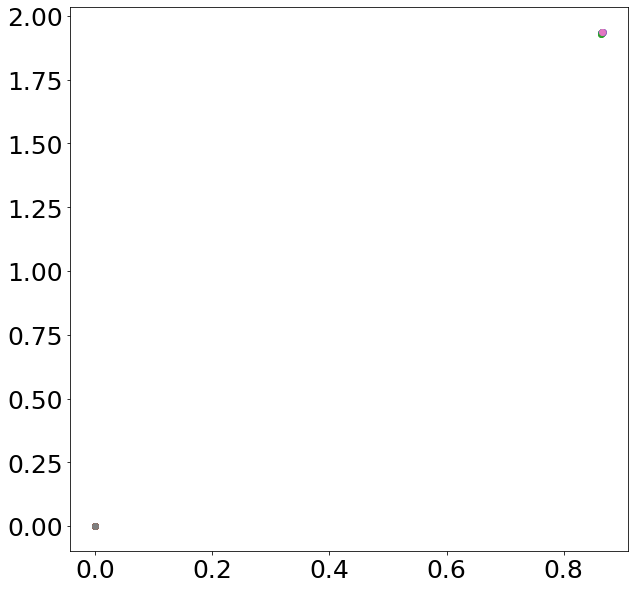

Bbp:  0.08500000000000002


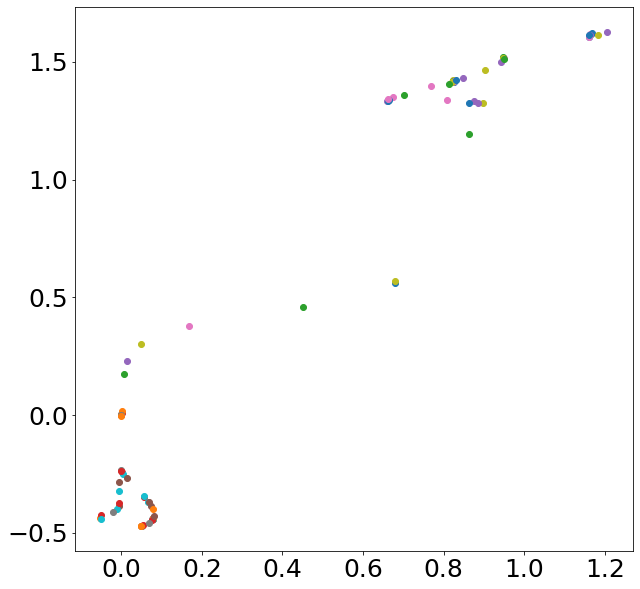

Bbp:  0.08600000000000002


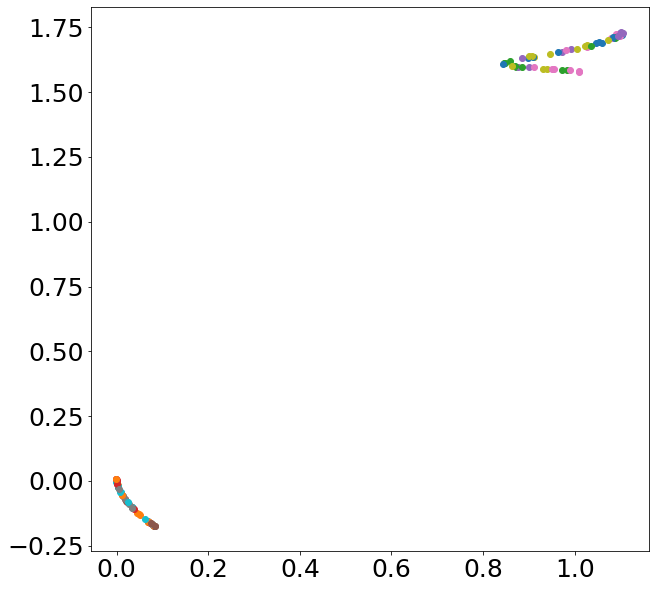

Bbp:  0.08700000000000002


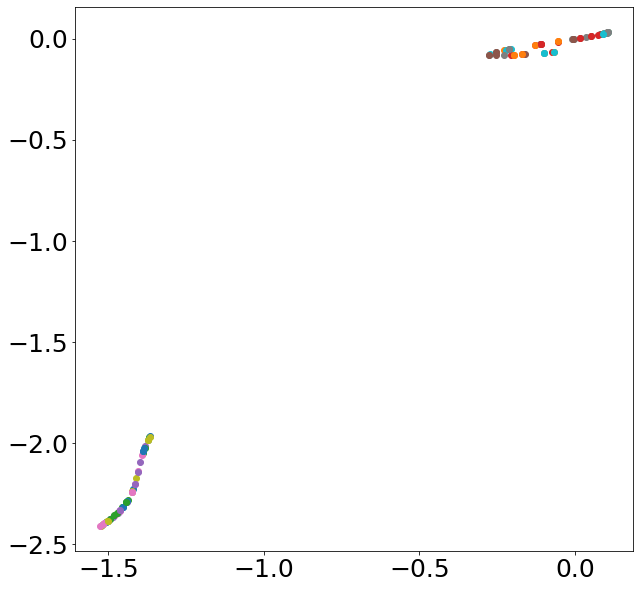

Bbp:  0.08800000000000002


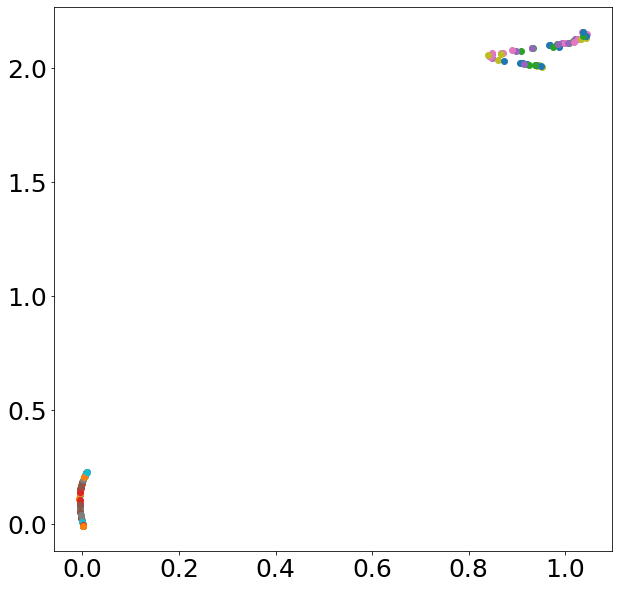

Bbp:  0.08900000000000002


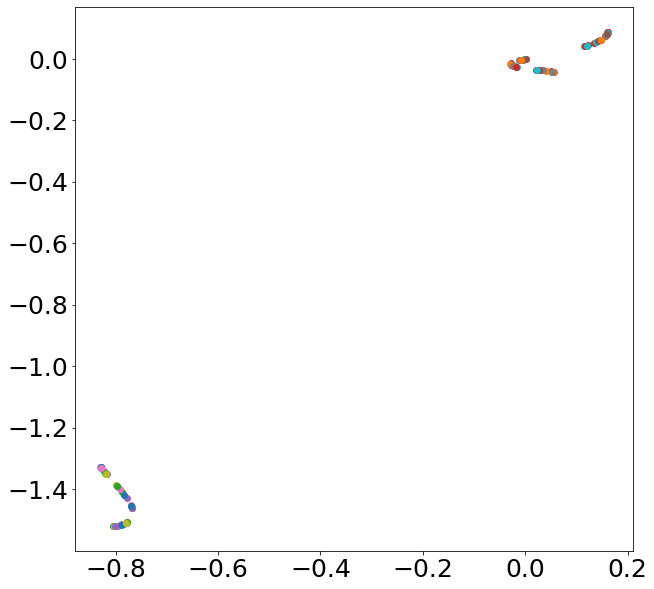

Bbp:  0.09000000000000002


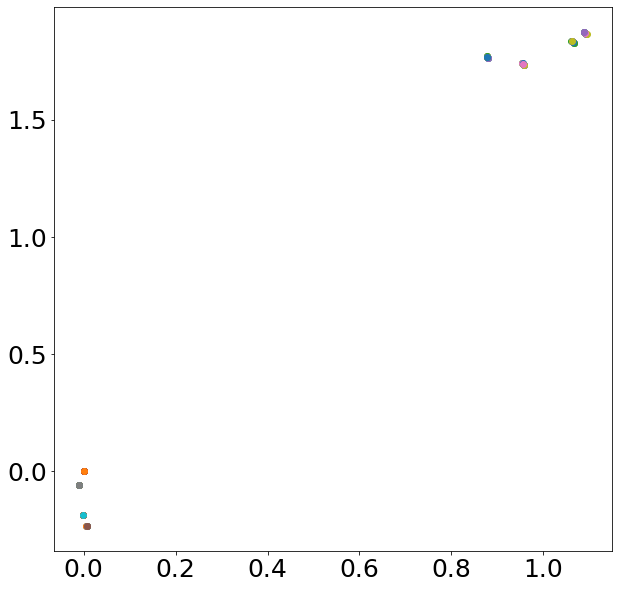

Bbp:  0.09100000000000003


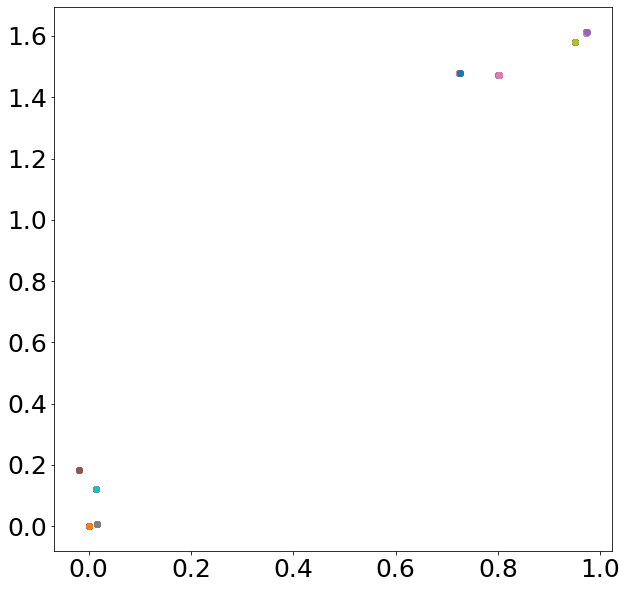

Bbp:  0.09200000000000003


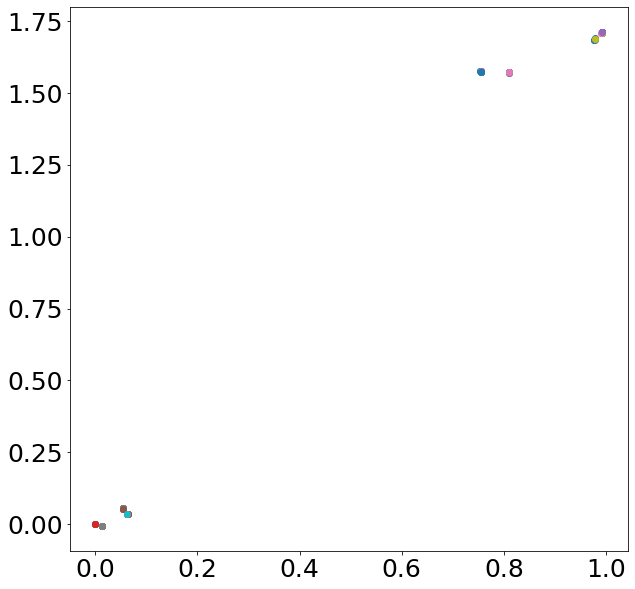

Bbp:  0.09300000000000003


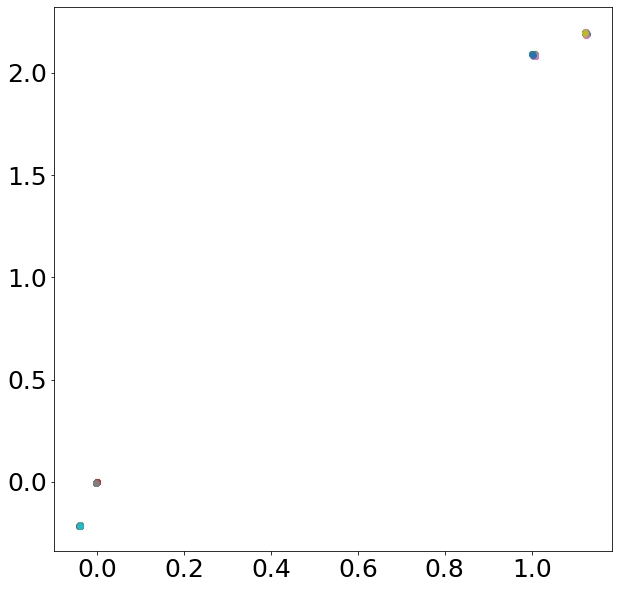

Bbp:  0.09400000000000003


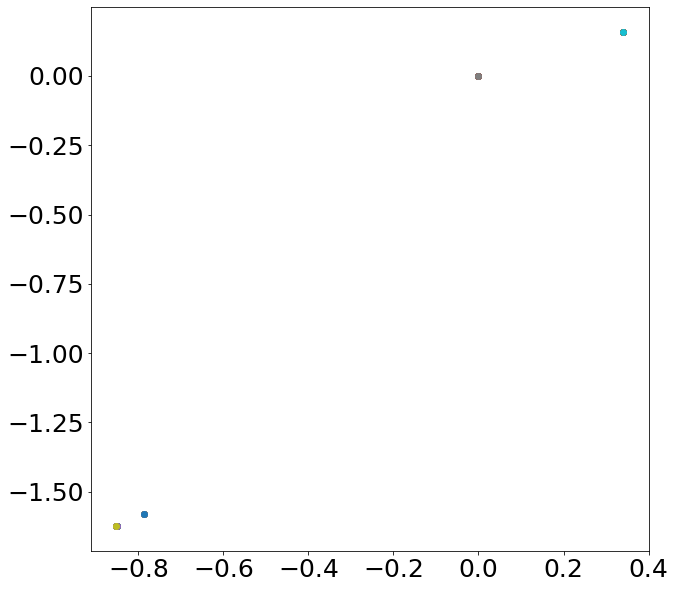

Bbp:  0.09500000000000003


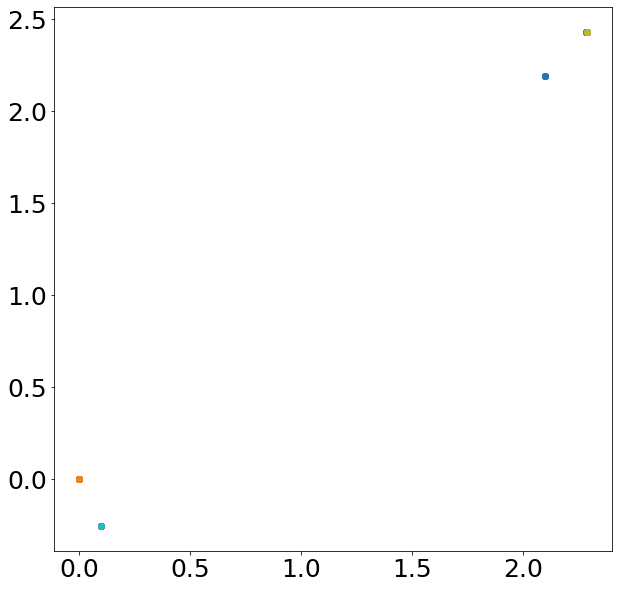

Bbp:  0.09600000000000003


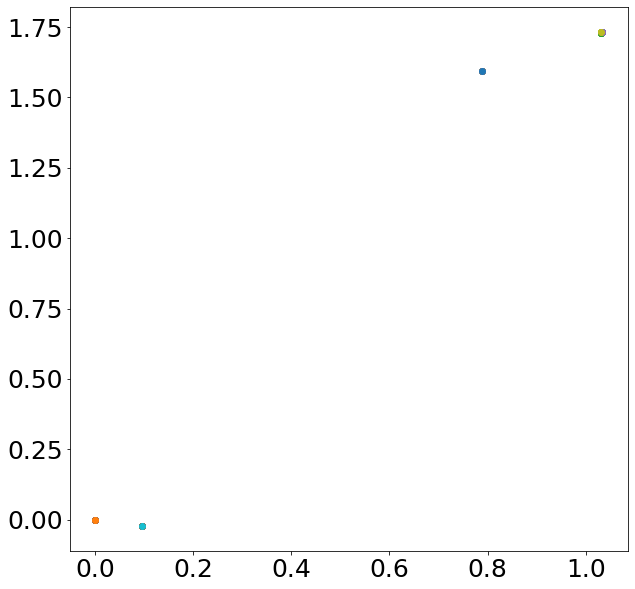

Bbp:  0.09700000000000003


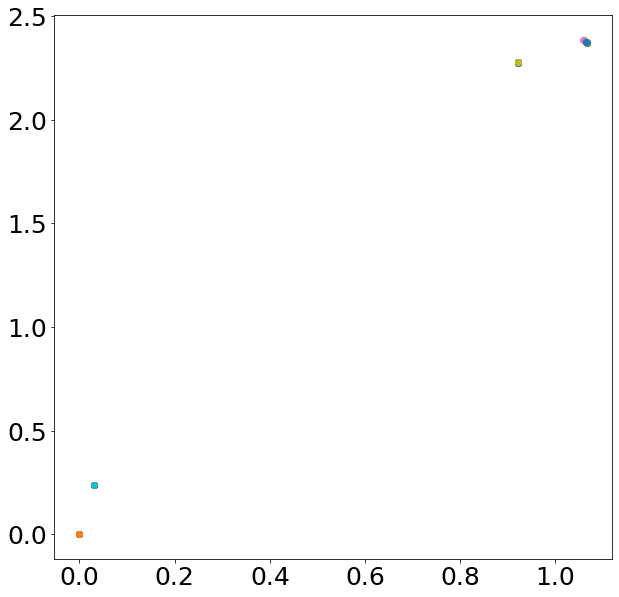

Bbp:  0.09800000000000003


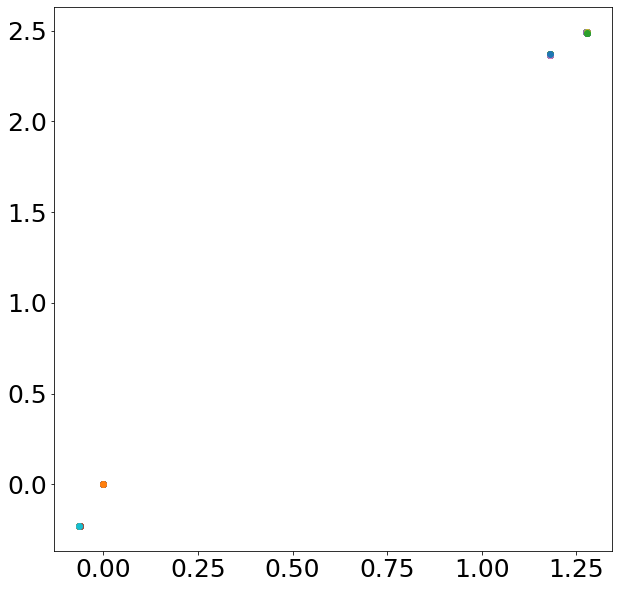

Bbp:  0.09900000000000003


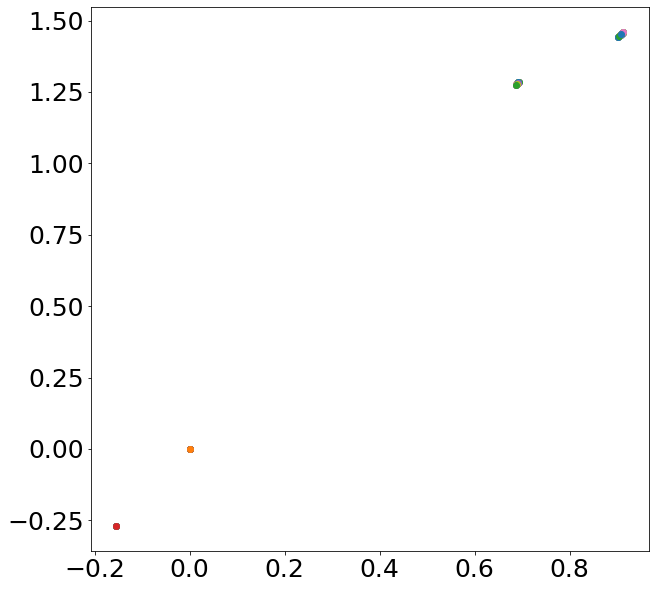

Bbp:  0.10000000000000003


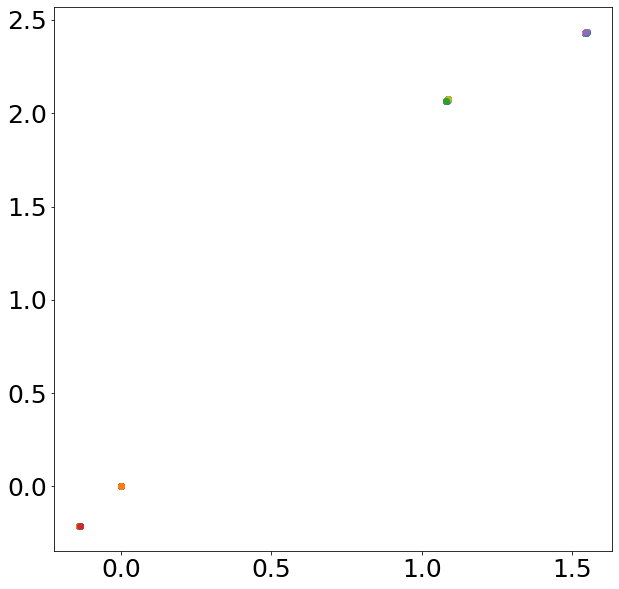

In [192]:
Bpb = 0.19
Bbp =0.06
ts = 2000
nt = 2 ** 18
xs = []
periods = []

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
sol, t = calcODE(args,0,0,0,0,0,0, ts=ts, nt=nt)

Bbp_list = np.arange(0.06, 0.1, 0.001)
for Bbp in Bbp_list:
    print('Bbp: ', Bbp)
    fig = plt.figure(figsize=(10, 10))
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    
    sol, t = calcODE(args, *sol[-1,:], ts=ts, nt=nt)
    sol = sol[-len(sol) // 2:, :]

    x0 = sol[0, :]
    t = t[-len(t)//2:]
    n = np.array(ode(x0, t[0], *args))
    q, _ = np.linalg.qr(n[:, None], mode='complete')

    period = None
    for i in range(len(sol) - 1):
        x1 = sol[i]
        x2 = sol[i + 1]
        if np.copysign((n @ (x1 - x0)), (n @ (x2-x0))) != (n @ (x1-x0)):
            c1 = dist(x1, x0, n)
            c2 = dist(x2, x0, n)
            alpha = c2 / (c1 + c2)
            x_new = x1 + alpha * (x2 - x1)
            x = (x_new - x0).dot(q)
            xs.append((Bbp, x[0], x[1], x[2], x[3], x[4], x[5]))
            plt.scatter(x[1], x[2])
            if np.linalg.norm(x_new - x0) < 1e-3 and period is None:
                period = t[i] - t[0]
                periods.append((Bbp, period, np.linalg.norm(x_new - x0)))
#             else:
#                 print(np.linalg.norm(x_new - x0))


    plt.show()

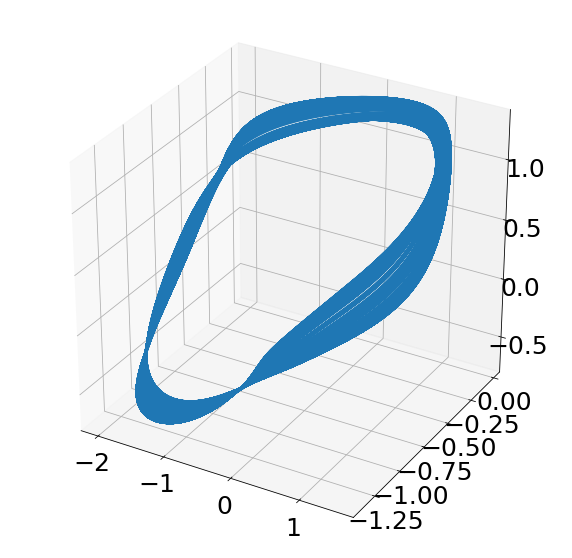

In [191]:
Bbp = 0.085
Bpb = 0.19

ts = 8000
nt = 2 ** 20

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
# sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=ts, nt=nt)


fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')

# sol, t = calcODE(args, *sol[-1,:], ts=ts, nt=nt)
# sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=ts, nt=nt)
sol, t = calcODE(args, 0, 0, 0, 0, 0, 0, ts=ts, nt=nt)

sol = sol[-len(sol) // 2:, :]
ax.plot(xs = sol[:, 0], ys = sol[:, 1], zs = sol[:, 2])

x0 = sol[0, :]
t = t[-len(sol)//2:]
n = ode(x0, t, *args)

for i in range(len(sol) - 1):
    x1 = sol[i]
    x2 = sol[i + 1]
    if np.copysign((n @ (x1 - x0)), (n @ (x2 - x0))) != (n @ (x1 - x0)):
        c1 = dist(x1, x0, n)
        c2 = dist(x2, x0, n)
        alpha = c2 / (c1 + c2)
        x = x1 + alpha * (x2 - x1)
#         ax.scatter(x[0], x[1], x[2])

plt.show()

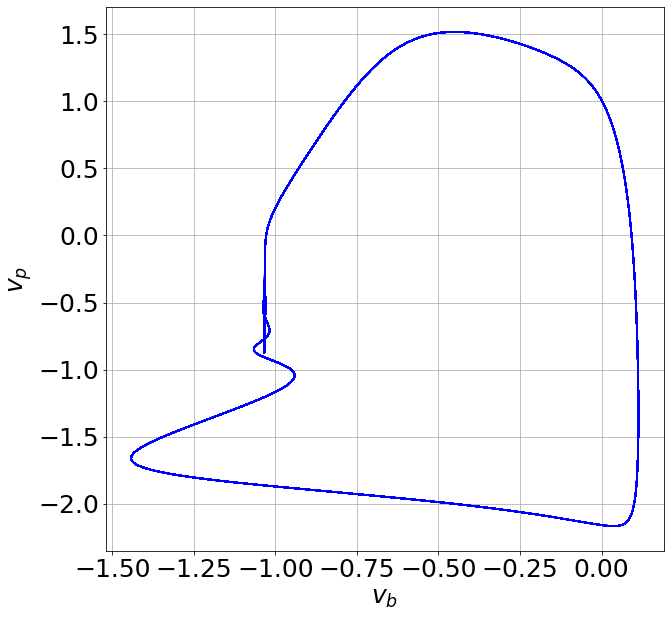

In [181]:
Bpb = 0.19
Bbpmin = 0.082
Bbpmax = 0.082

scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)


# signal_draw1(args1, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=1000, nt=2**15)

# wavelet_draw(args1, scale, ts=2000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)

# args1_inv = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
# wavelet_draw(args1_inv, scale, ts=2000, nt=2**15)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)

phase_portrait(args, args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=8000, nt=2**20)

[  101 32768]


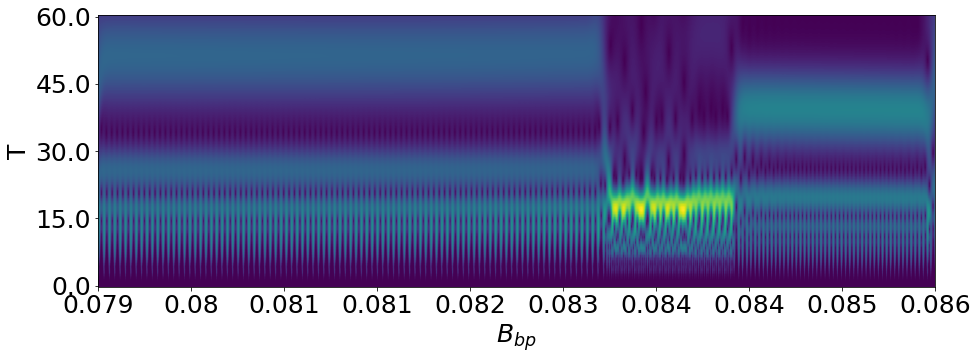

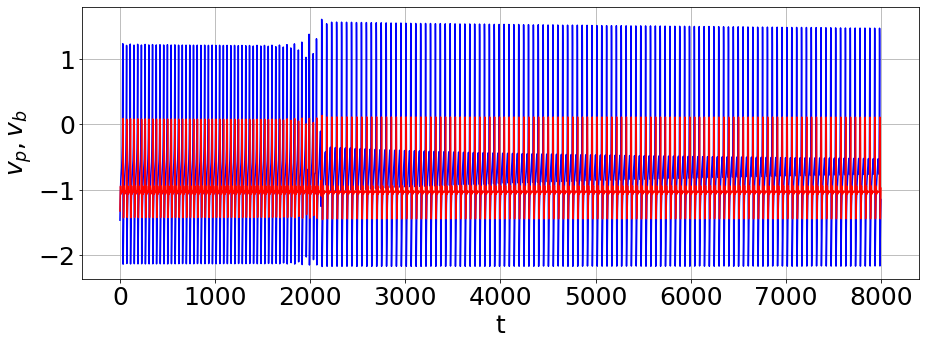

In [189]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.079 # синаптический параметр
Bbpmax = 0.086 # синаптический параметр

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

# wavelet_draw(args1, scale, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)
# sol, t = calcODE1(args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)
sol, t = calcODE1(args1, 0,0,0,0,0,0, 2000, 2 ** 18)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax,  Bbpmin, vsl)
wavelet_draw_inv(args1, scale, *sol[-1], ts=8000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)
signal_draw1(args1, *sol[-1], ts=8000, nt=2**15)

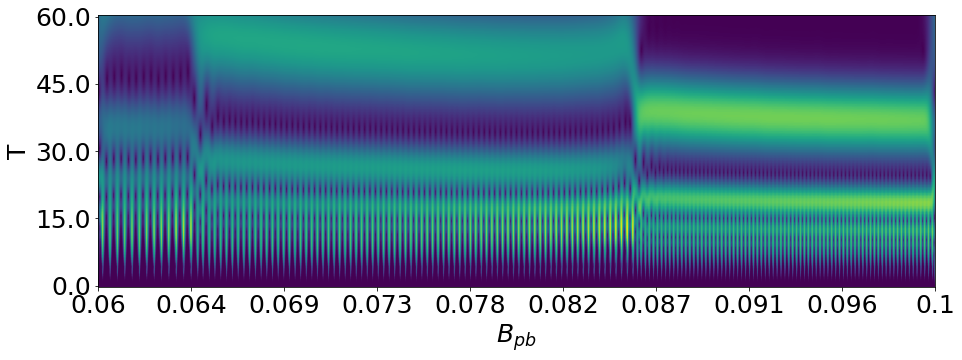

[  101 32768]


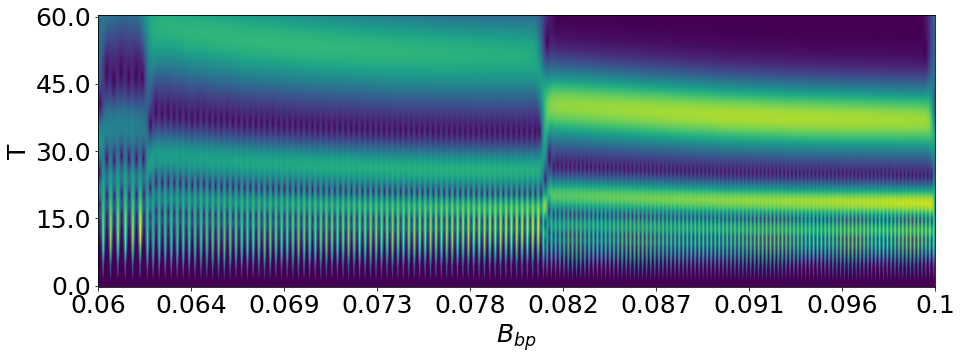

In [178]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.06 # синаптический параметр
Bbpmax = 0.1 # синаптический параметр

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)


wavelet_draw(args1, scale, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**18, Bmin=Bbpmin, Bmax=Bbpmax)
sol, t = calcODE1(args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)

# wavelet_draw(args1, scale, 0,0,0,0,0,0, ts=8000, nt=2**18, Bmin=Bbpmin, Bmax=Bbpmax)
# sol, t = calcODE1(args1, 0,0,0,0,0,0, 8000, 2 ** 18)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax,  Bbpmin, vsl)
# wavelet_draw_inv(args1, scale, *sol[-1], ts=8000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)
wavelet_draw_inv(args1, scale,  -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=8000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)


In [ ]:
Bpb = 0.19
Bbpmin = 0.065
Bbpmax

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
sol, t = calcODE1(args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)


0.06 0.1
0.06 0.1
0 32768


Text(0.5, 0, '$B_{bp}$')

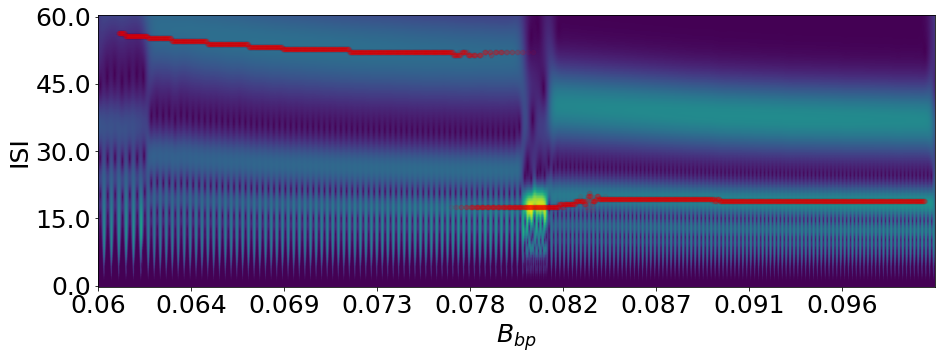

In [176]:
def my_func(
    args, scale, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=8000, nt=2 ** 13, Bmin=0.065, Bmax=0.1,
    picture_Bmin=0.065, picture_Bmax=0.1,
):
    # sol, t = calcODE2(args, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)

    args0 = (args[0], args[1], args[2], args[3], args[4], args[5], args[6], args[7], args[8], args[10], args[11])
    sol, t = calcODE(args0, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)

    sol, t = calcODE1(args, *sol[-1], ts, nt)

    vp = sol[:, 0]
    vp = sAnalytics(vp)

    res = 2 * fftMorlet(t, vp, scale, 2 * np.pi)
    
    res = res[:, ::-1]
    Bmin, Bmax = Bmax, Bmin

    print(Bmin, Bmax)
    print(picture_Bmin, picture_Bmax)
    print(int((picture_Bmin - Bmin) / (Bmax - Bmin) * res.shape[1]), int((picture_Bmax - Bmin) / (Bmax - Bmin) * res.shape[1]))
    
    res = res[:, int((picture_Bmin - Bmin) / (Bmax - Bmin) * res.shape[1]) : int((picture_Bmax - Bmin) / (Bmax - Bmin) * res.shape[1])]
    Bmin = picture_Bmin
    Bmax = picture_Bmax
    
#     fig, ax = plt.subplots(figsize=(15, 5))
    plt.ylabel('T')

    ticks = np.array([0, len(res) // 4, len(res) // 2, 3 * len(res) // 4, len(res) - 1])
    plt.yticks(ticks, scale[ticks])
    
    plt.imshow(np.abs(res), aspect='auto', origin='lower')
    xticks = np.linspace(0, res.shape[1], 10)
    xlabels = np.array([round(i, 3) for i in np.linspace(Bmin, Bmax, 10)])
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabels)
    ax.set_xlabel('$B_{bp}$')
    
    x_min = Bmin
    x_max = Bmax
    return x_min, x_max, res.shape[1]

    
    # print(len(directly))
# print(ws.shape)

fig, ax = plt.subplots(figsize=(15, 5))

Bpb = 0.19 # синаптический параметр
Bbpmin = 0.06 # синаптический параметр
Bbpmax = 0.1 # синаптический параметр

gist_bbpmin = 0.06
gist_bbpmax = 0.1
# gist_bbpmin = 0.079
# gist_bbpmax = 0.086

nt = 2 ** 15
scale = np.linspace(0, 60, 101)

# args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

sol, t = calcODE1(args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax,  Bbpmin, vsl)
x_min, x_max, x_len = my_func(
    args1, scale, *sol[-1], ts=8000, nt=2**15, Bmin=Bbpmax, Bmax=Bbpmin,
    picture_Bmin=gist_bbpmin, picture_Bmax=gist_bbpmax,
#     picture_Bmin=Bbpmin, picture_Bmax=Bbpmax,
    
)

plt.ylabel('ISI')

gist_xs = np.linspace(
    (gist_bbpmin - x_min) / (x_max - x_min) * x_len, 
    (gist_bbpmax - x_min) / (x_max - x_min) * x_len,
    len(directly)
)
plt.scatter(gist_xs[100:-50], directly[100:-50] / scale.max() * len(scale), s=20, c='r', alpha=0.05,)
# plt.scatter(gist_xs[100:-50], inverse[::-1][100:-50] / scale.max() * len(scale), s=20, c='b', alpha=0.05)
# plt.imshow(np.abs(np.max(ws, axis = 2)), aspect='auto', origin='lower', alpha=1)
ax.set_xlabel('$B_{bp}$')
# plt.show()



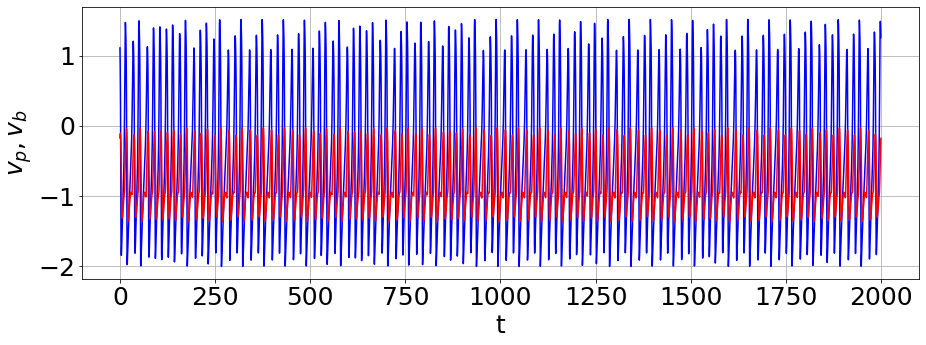

[  101 32768]


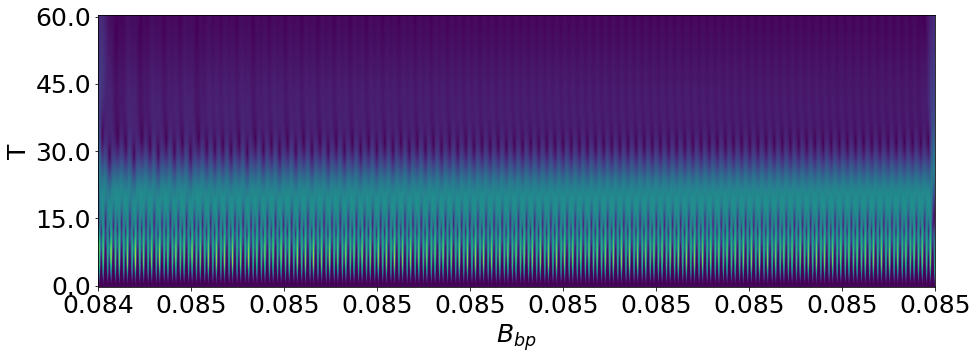

0.0845


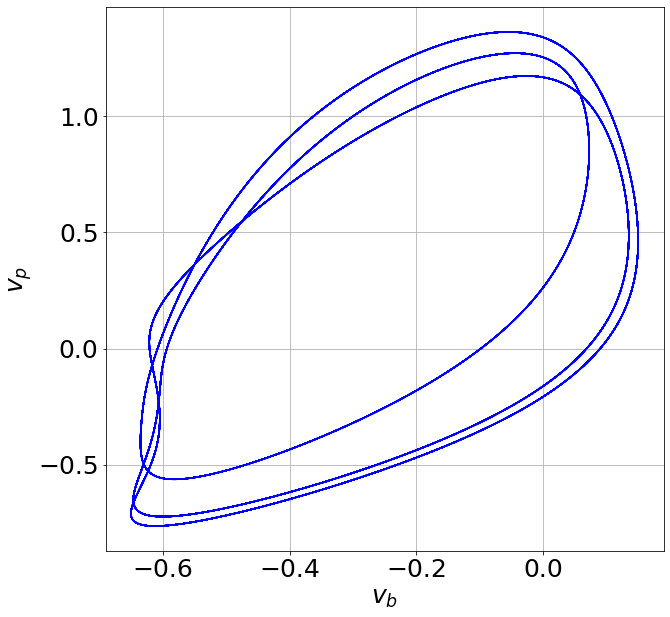

0.08451


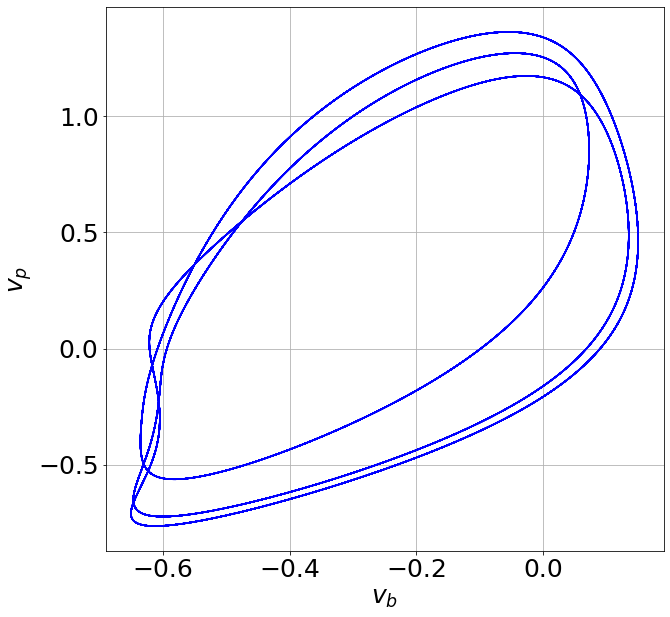

0.08452


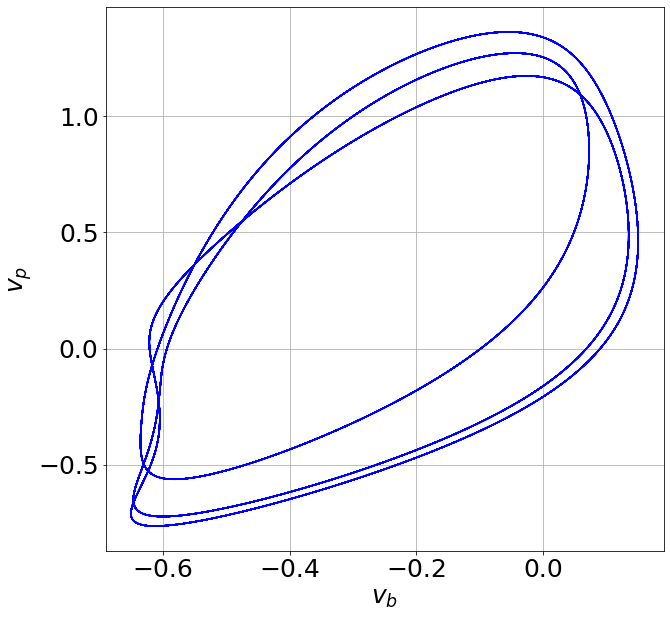

0.08453


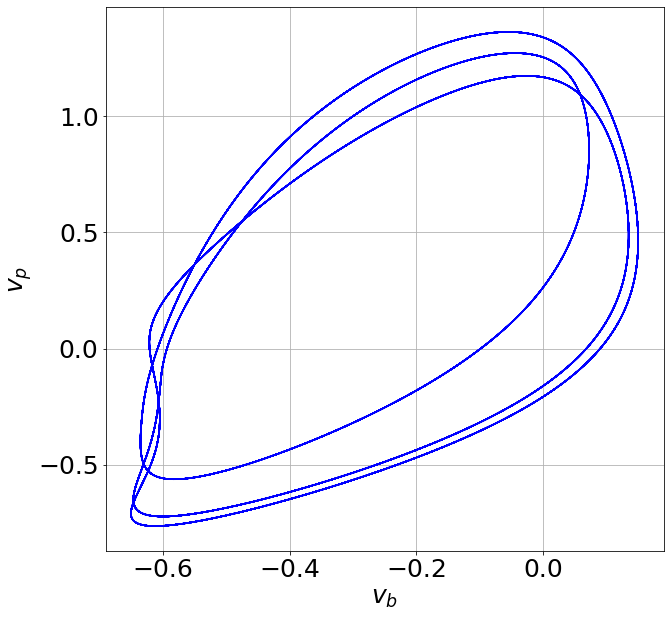

0.08453999999999999


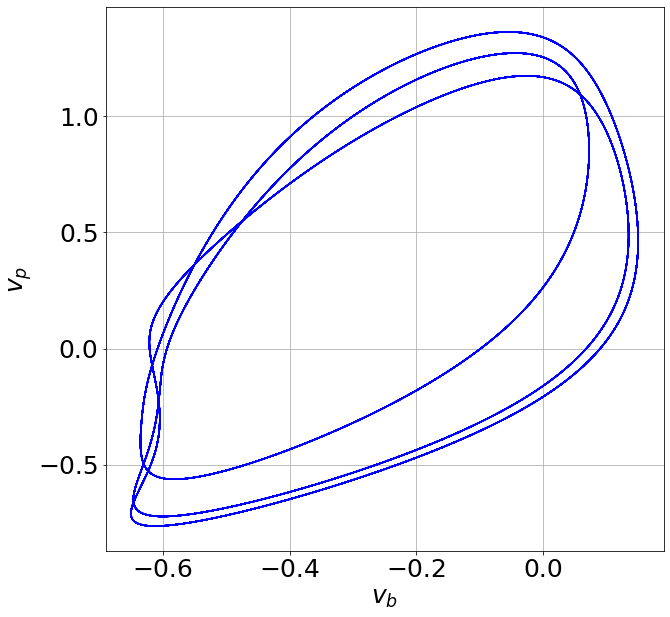

0.08454999999999999


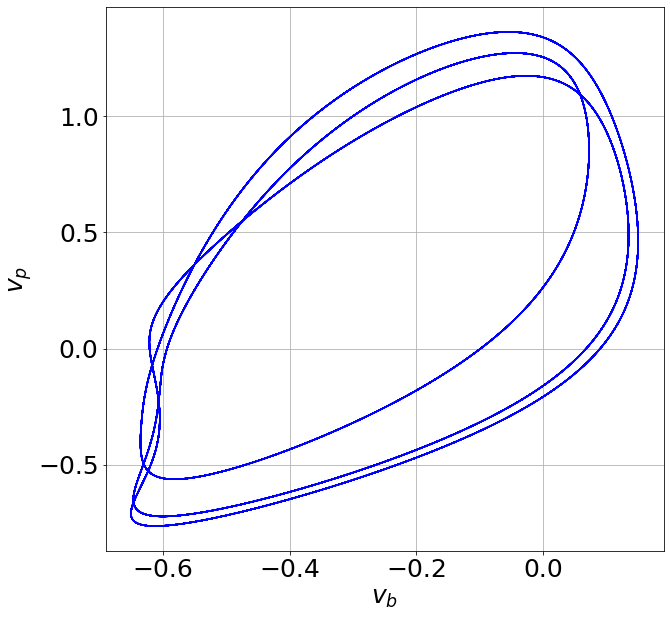

0.08455999999999998


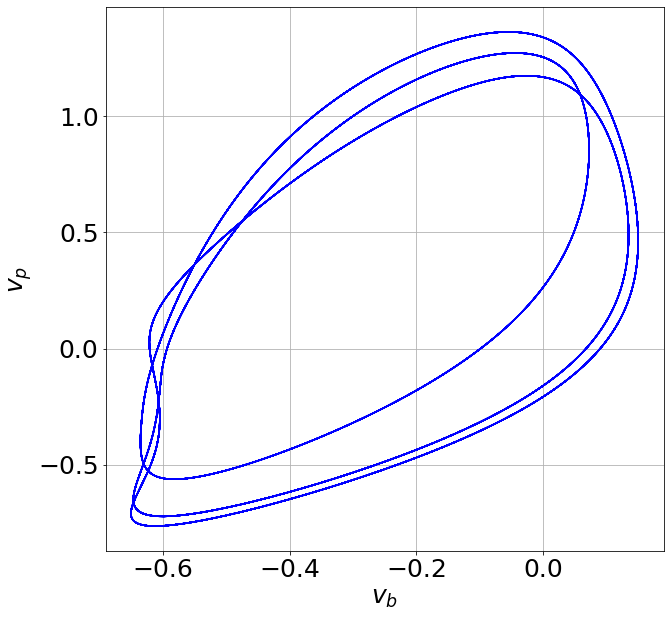

0.08456999999999998


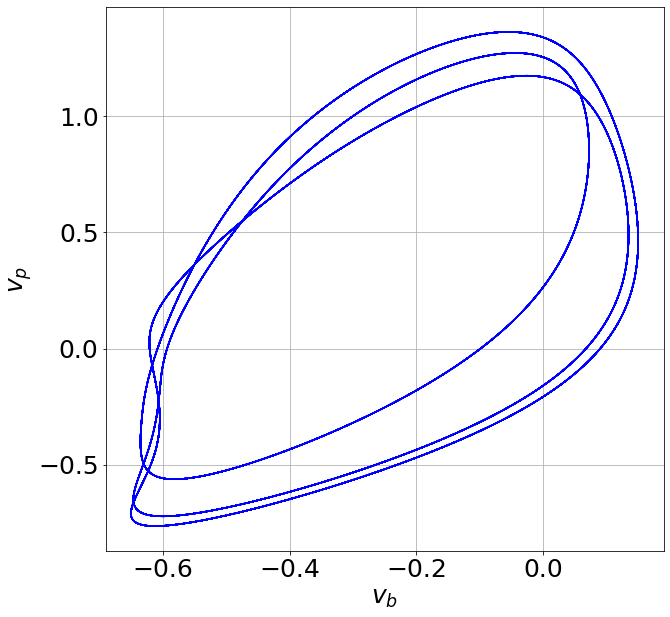

0.08457999999999997


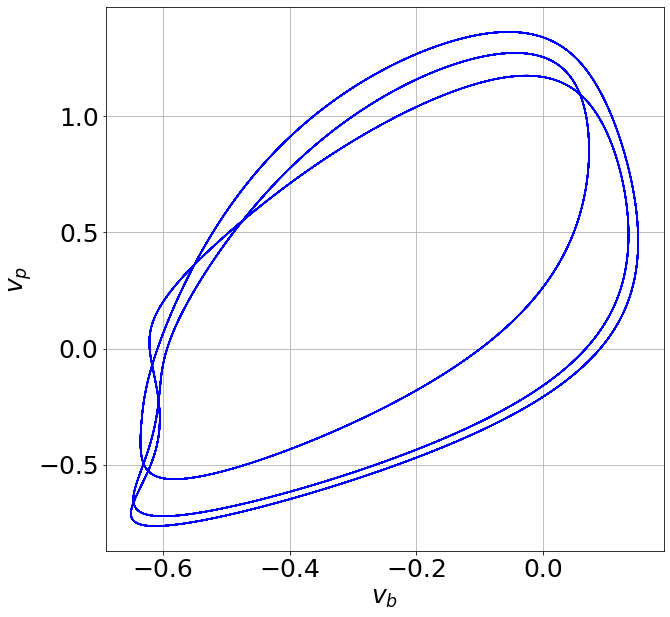

0.08458999999999997


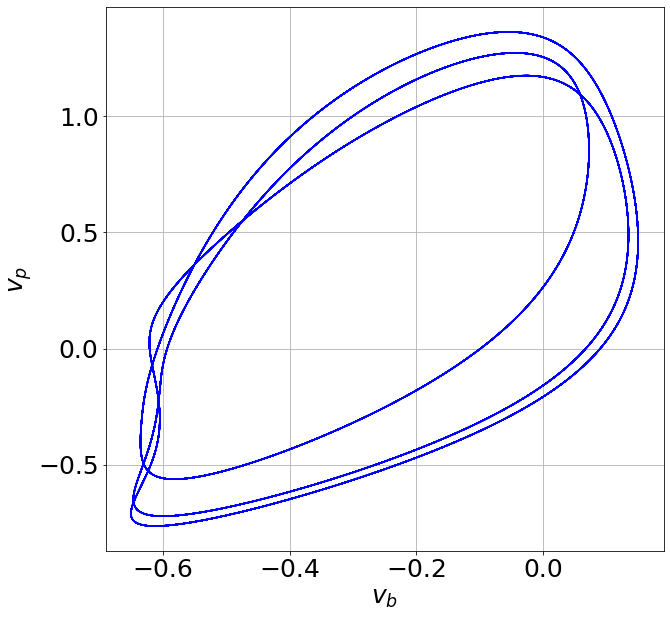

0.08459999999999997


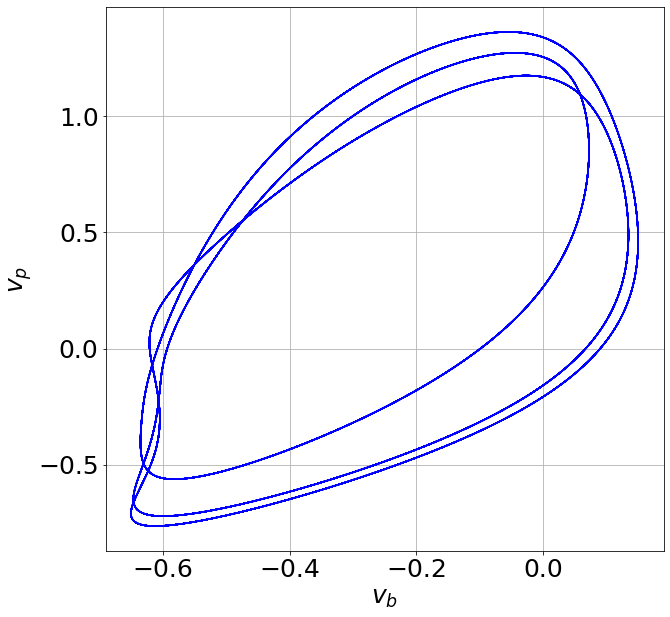

0.08460999999999996


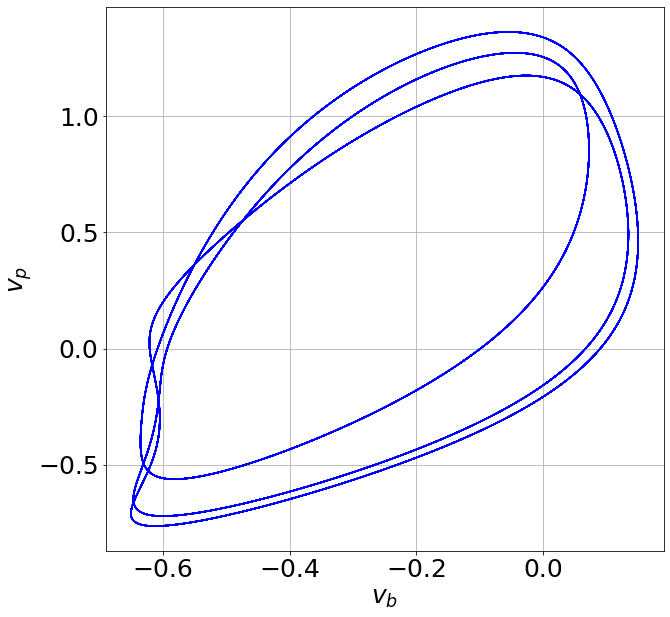

0.08461999999999996


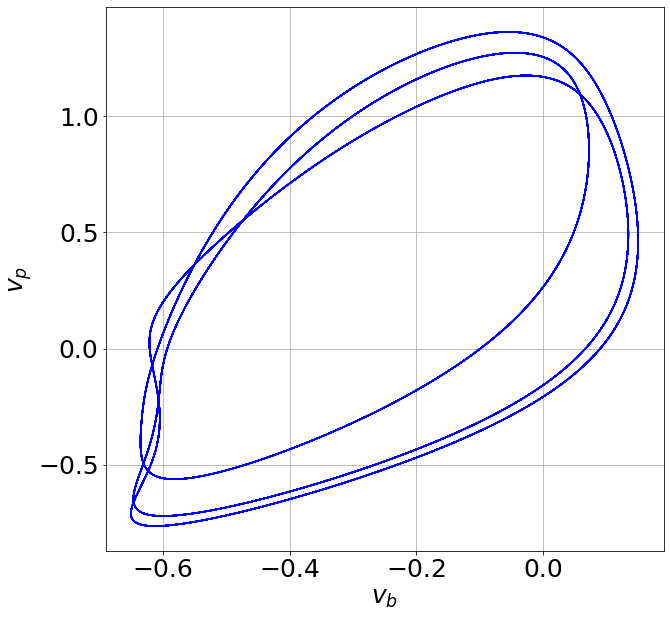

0.08462999999999996


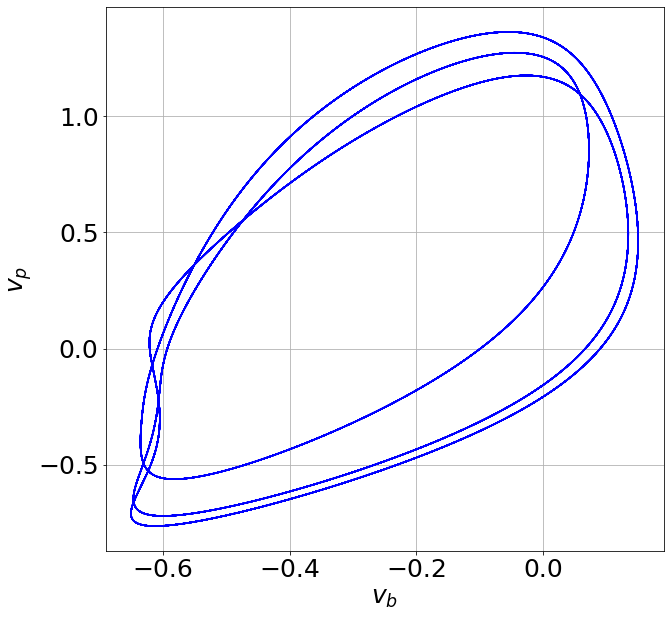

0.08463999999999995


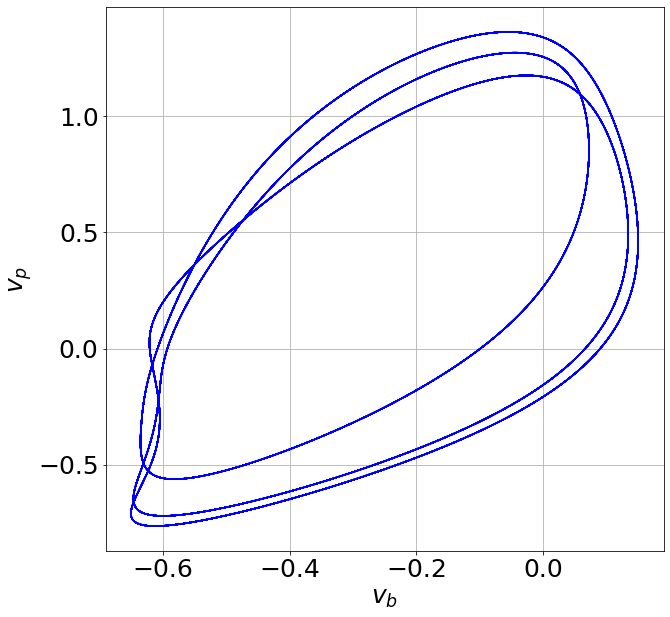

0.08464999999999995


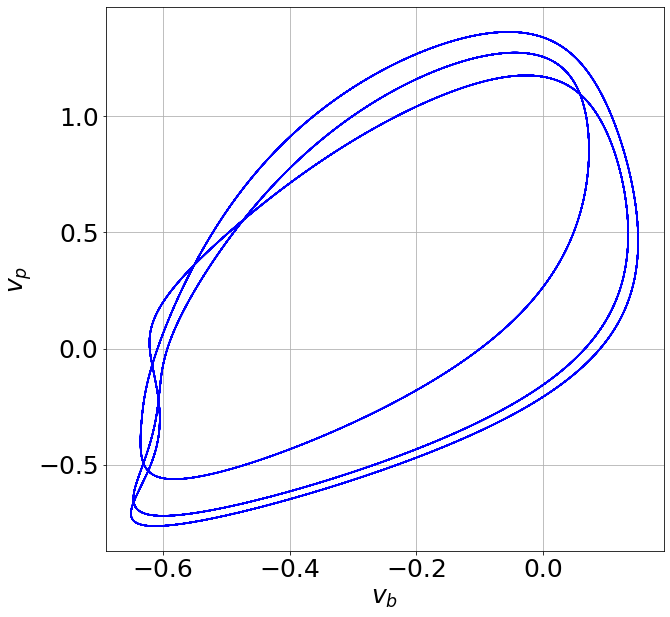

0.08465999999999994


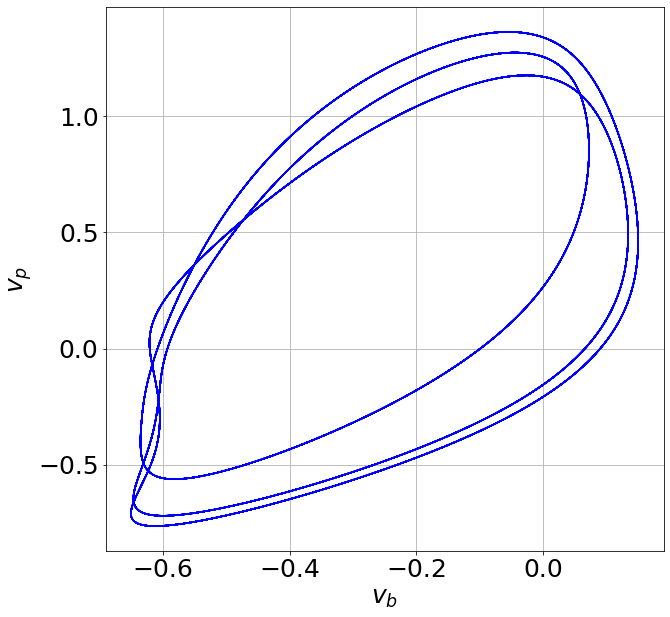

0.08466999999999994


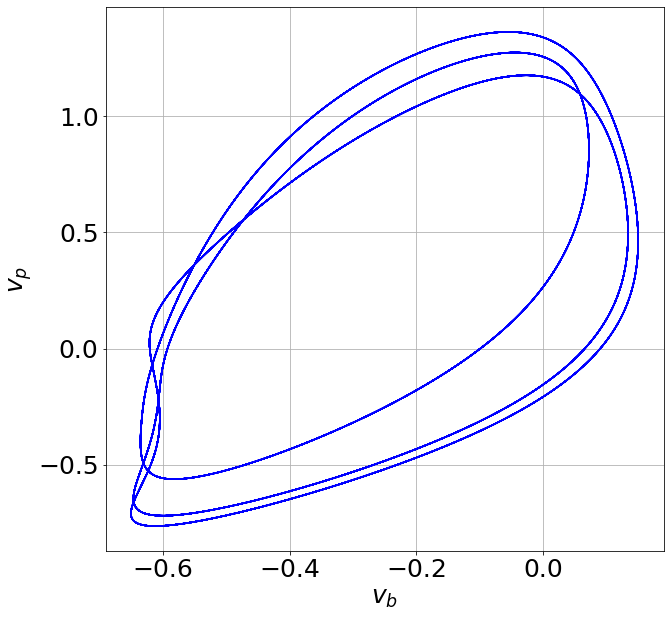

0.08467999999999994


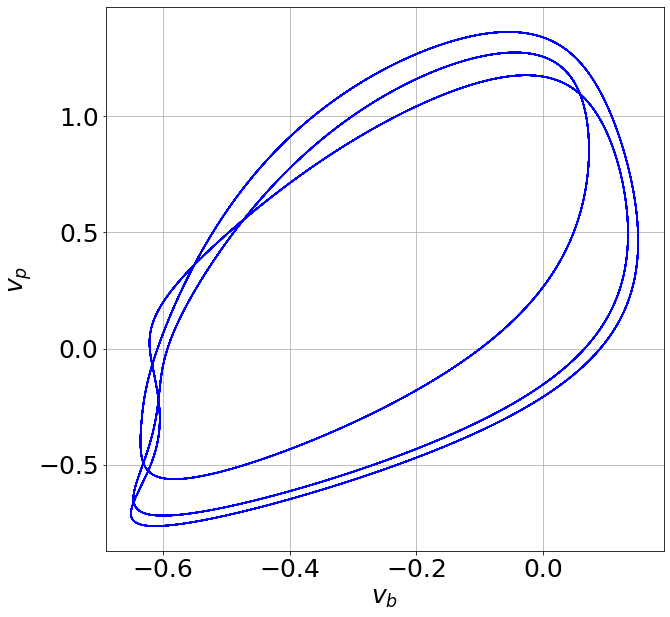

0.08468999999999993


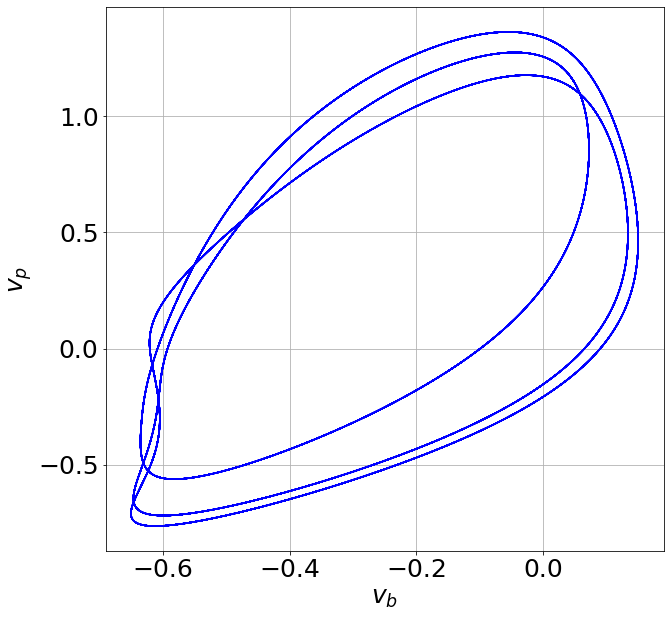

0.08469999999999993


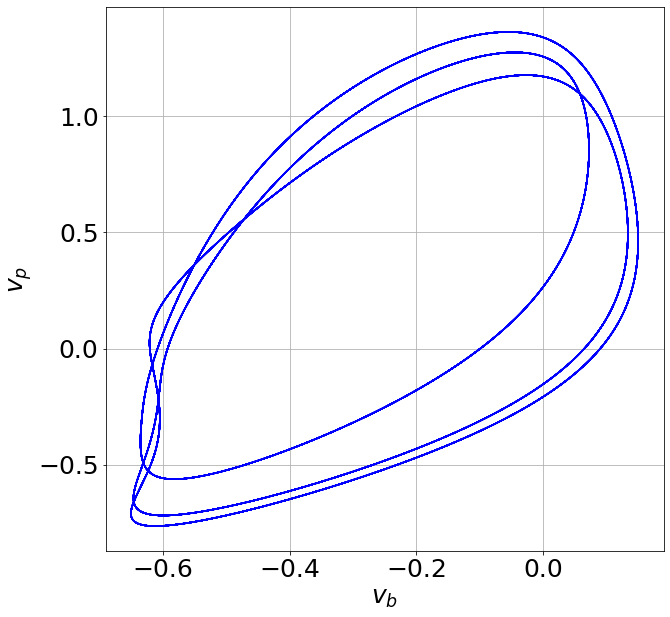

0.08470999999999992


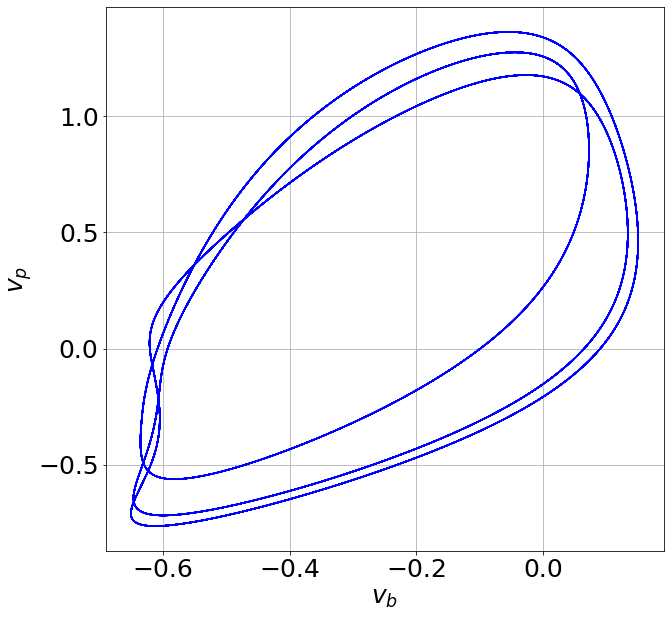

0.08471999999999992


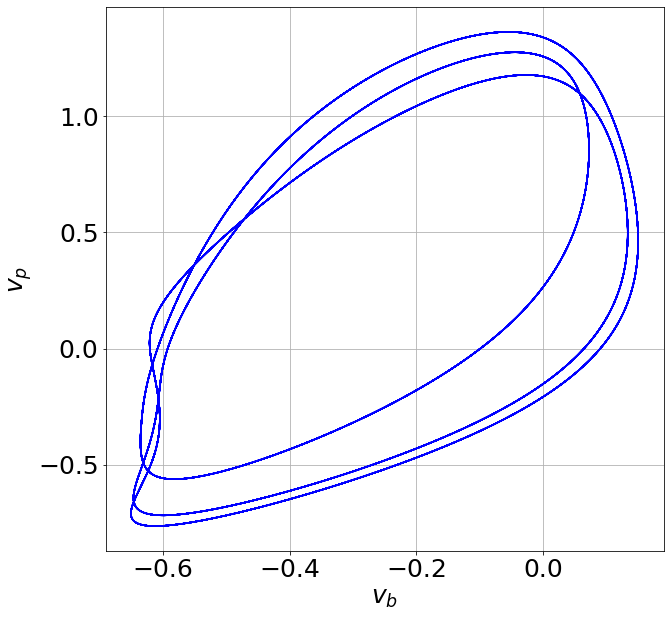

0.08472999999999992


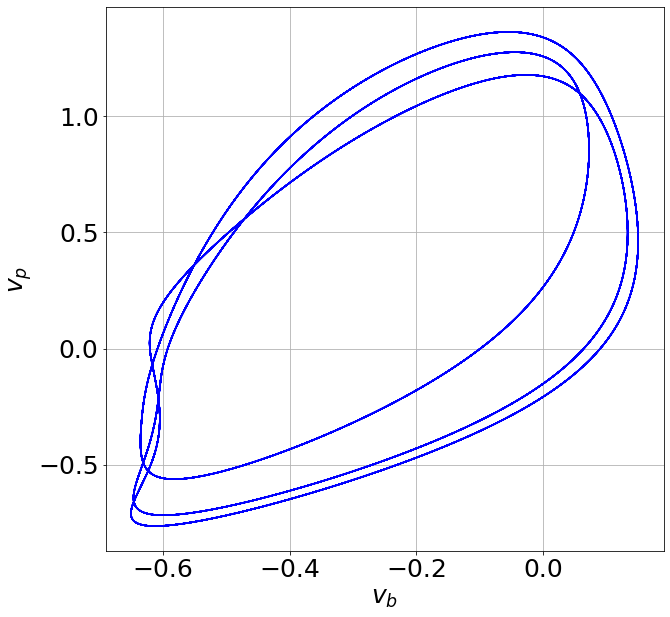

0.08473999999999991


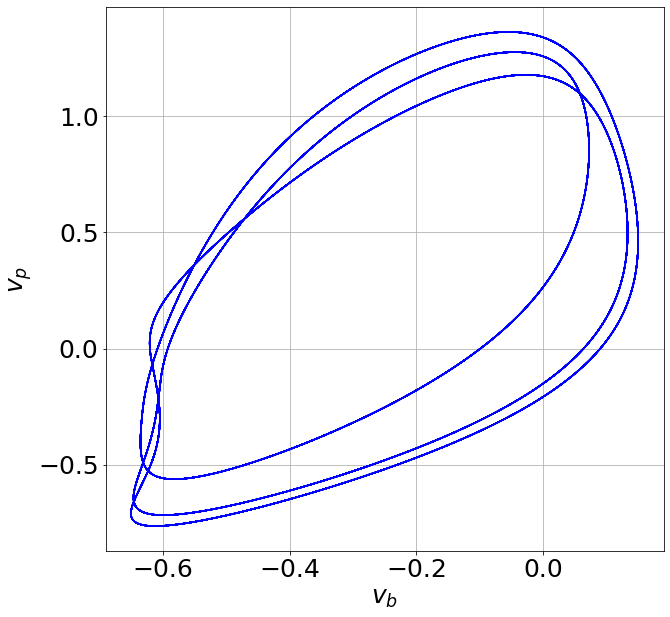

0.08474999999999991


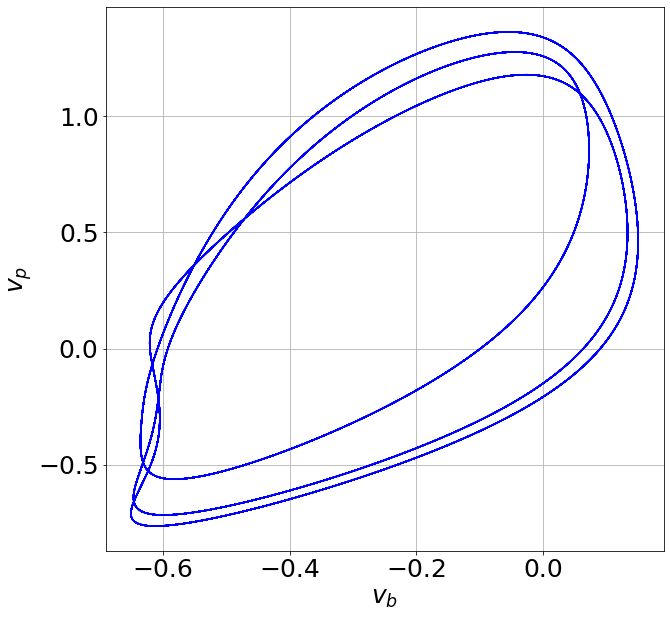

0.0847599999999999


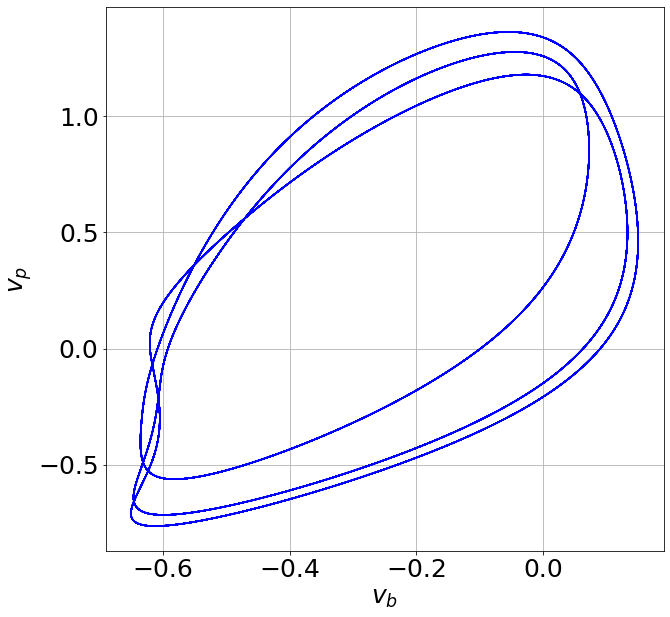

0.0847699999999999


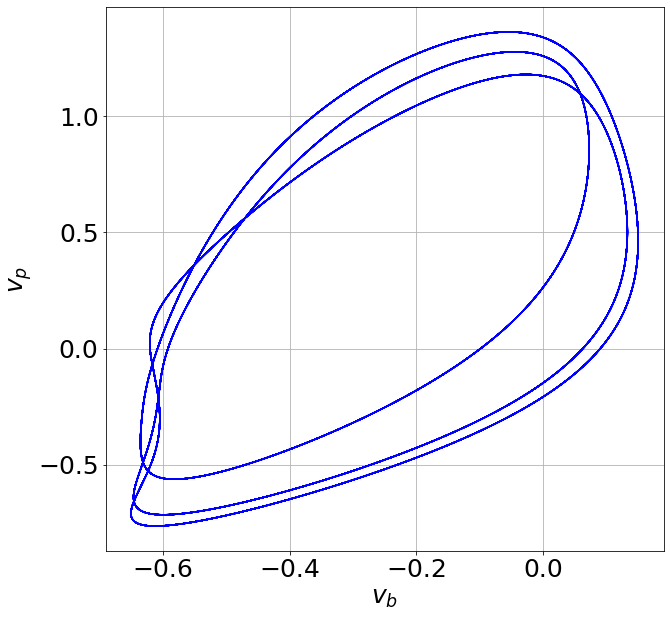

0.0847799999999999


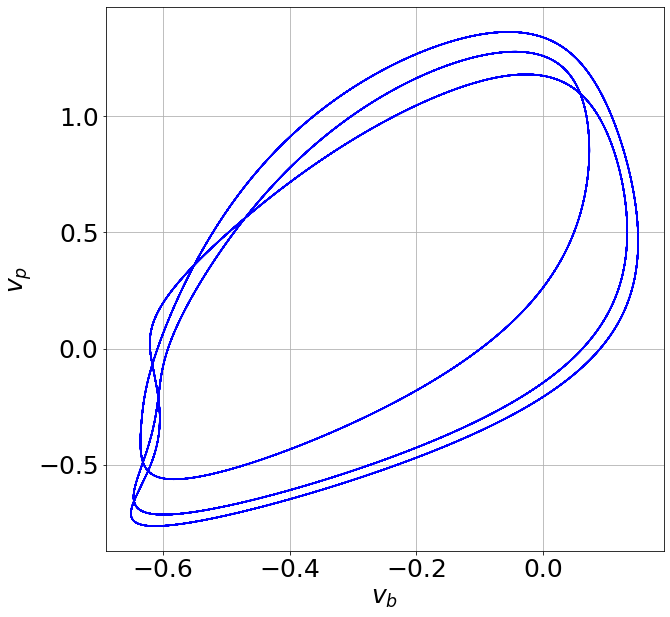

0.0847899999999999


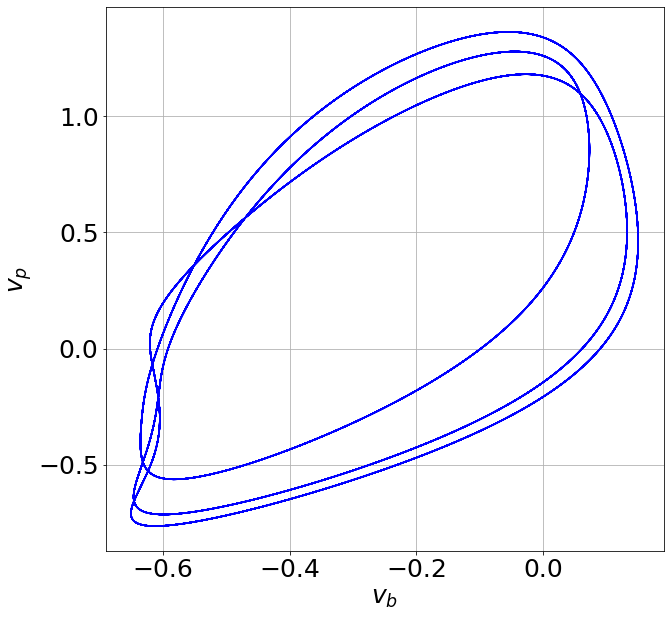

0.08479999999999989


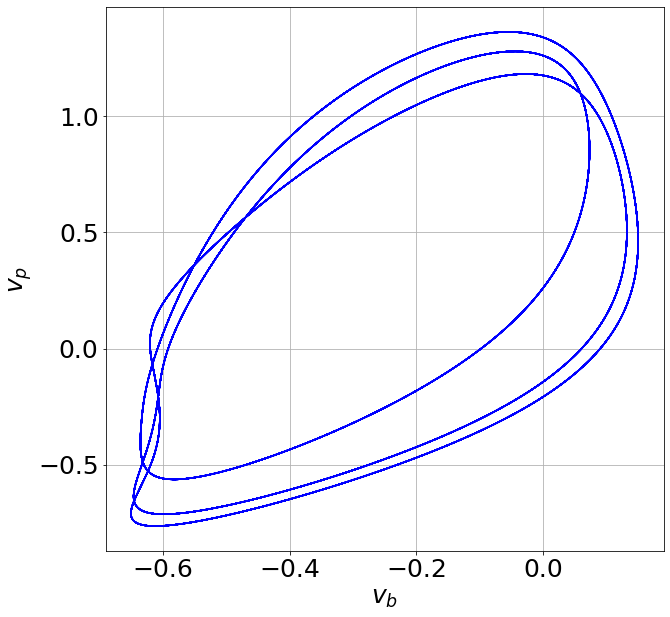

0.08480999999999989


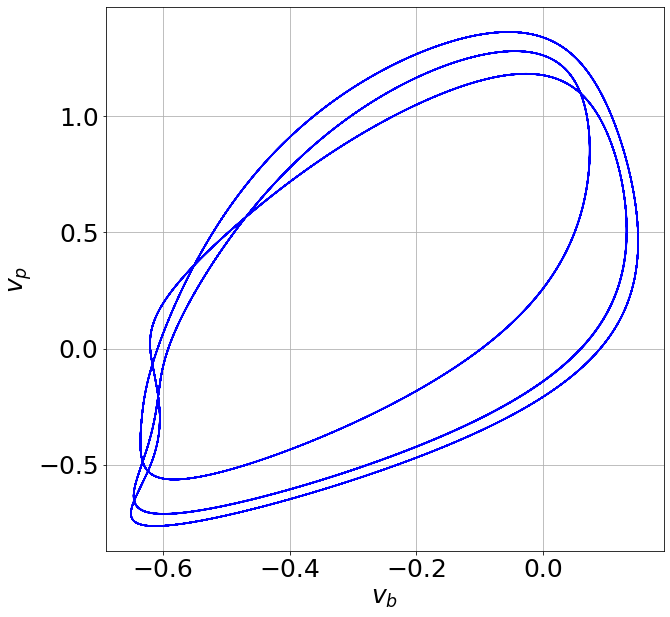

0.08481999999999988


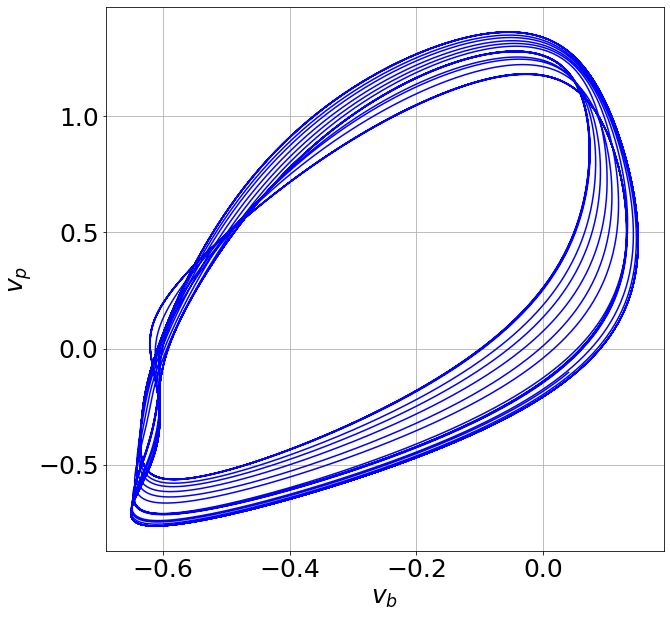

0.08482999999999988


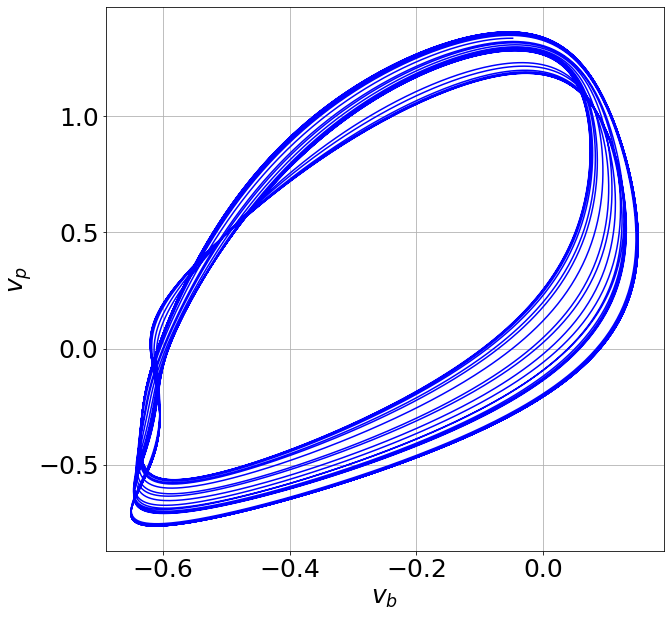

0.08483999999999987


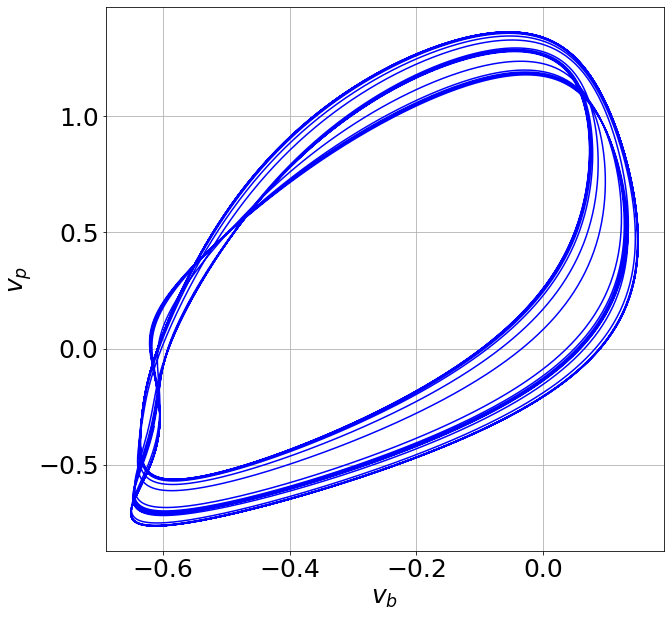

0.08484999999999987


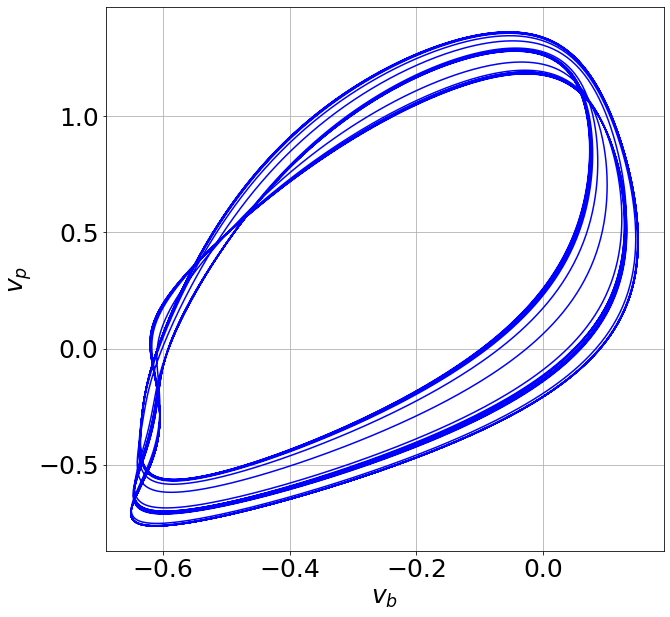

0.08485999999999987


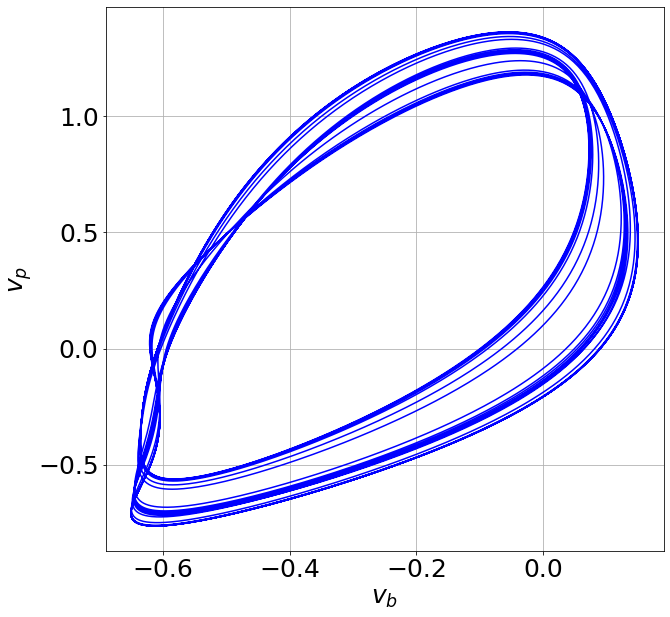

0.08486999999999986


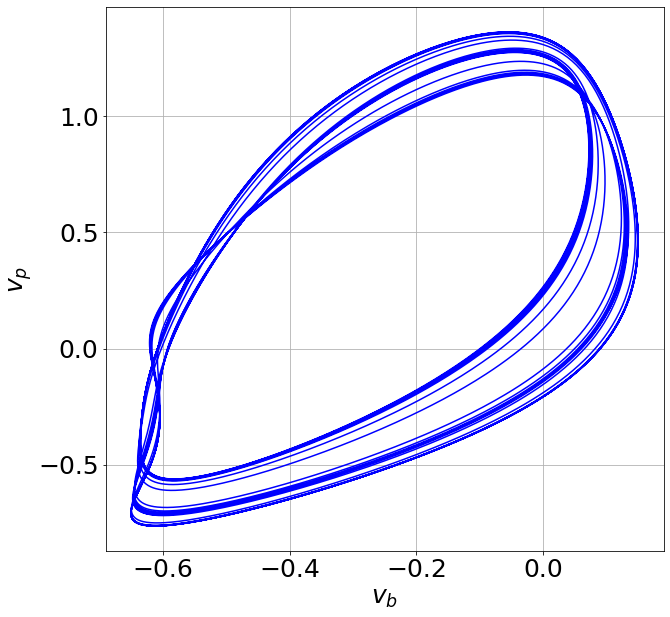

0.08487999999999986


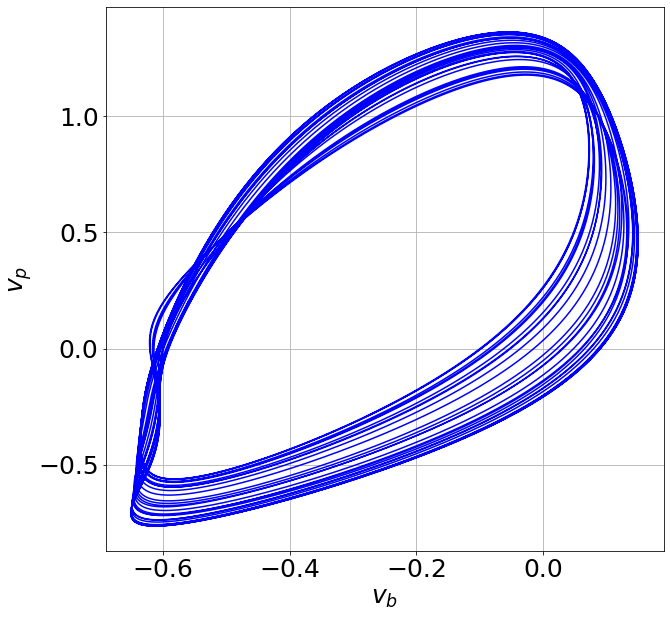

0.08488999999999985


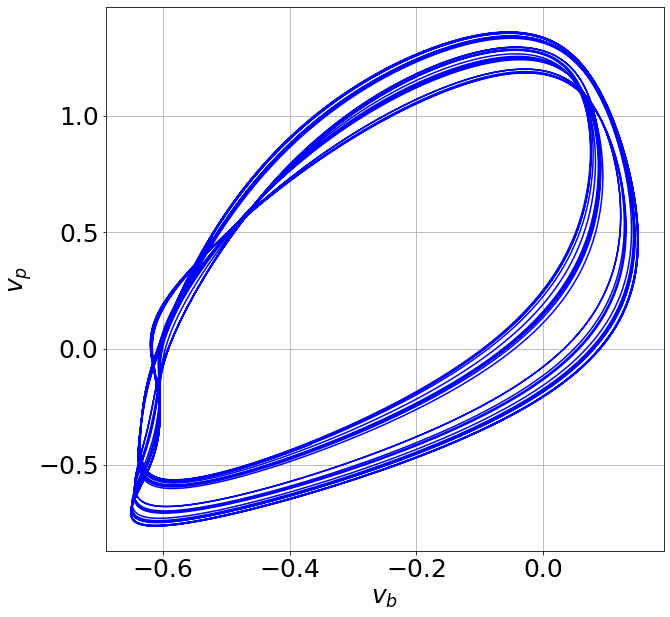

0.08489999999999985


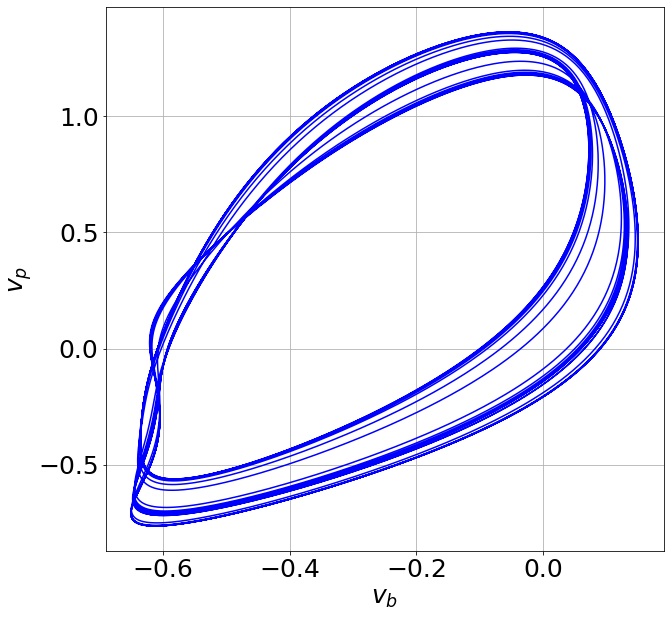

0.08490999999999985


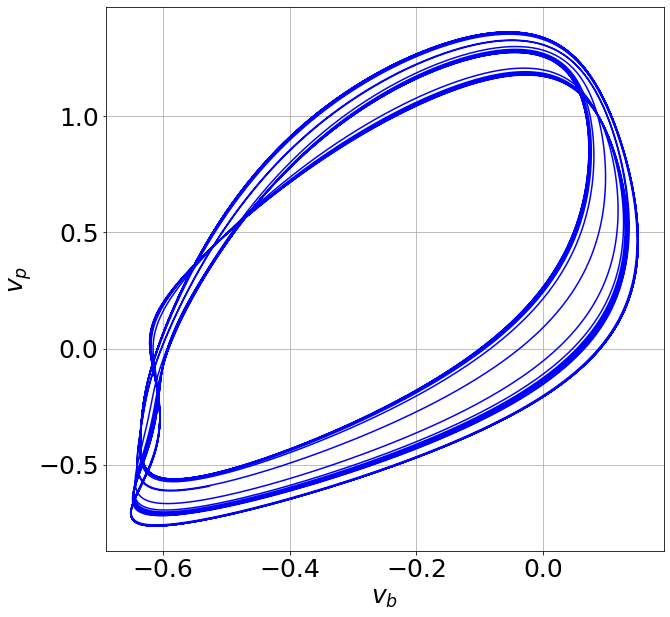

0.08491999999999984


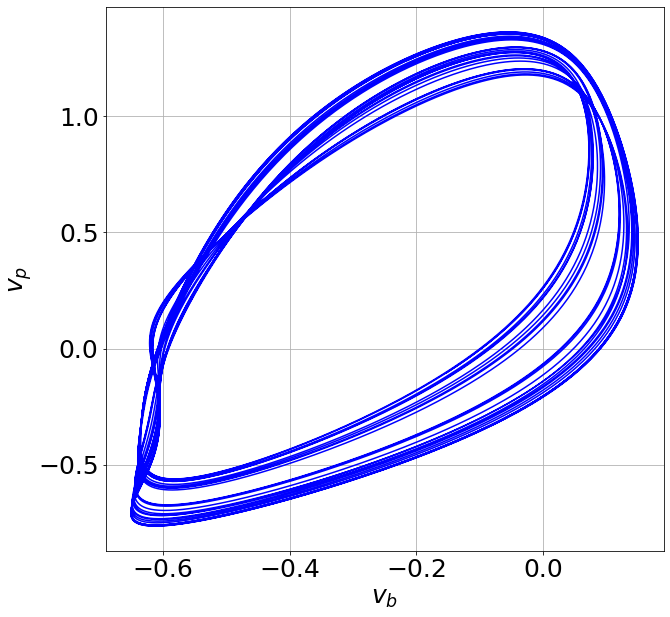

0.08492999999999984


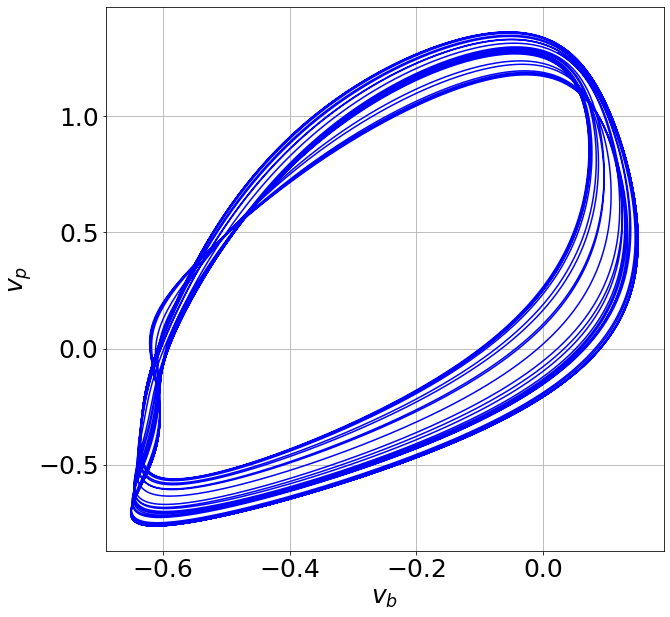

0.08493999999999984


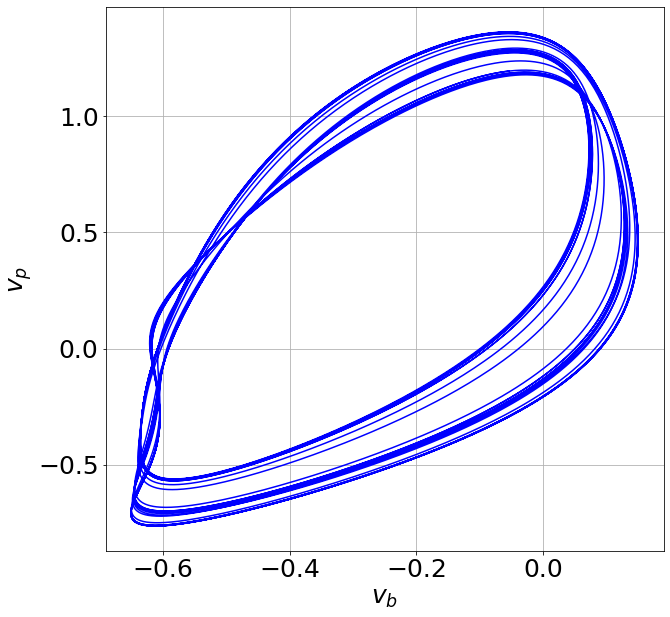

0.08494999999999983


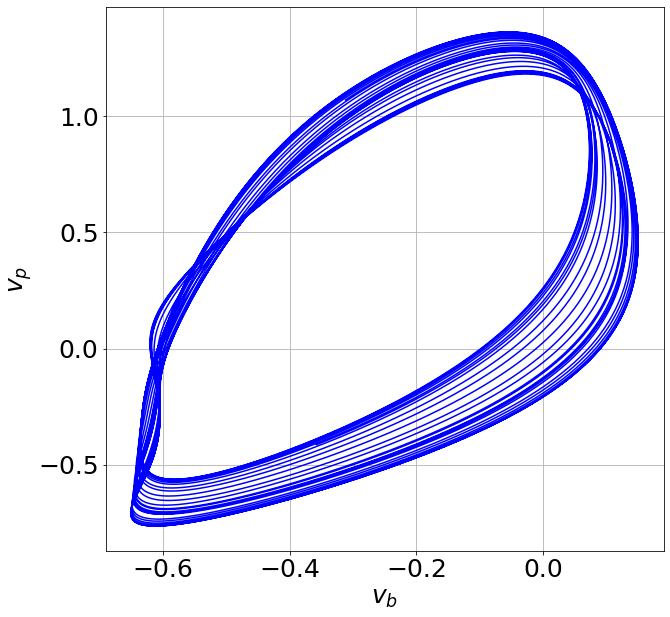

0.08495999999999983


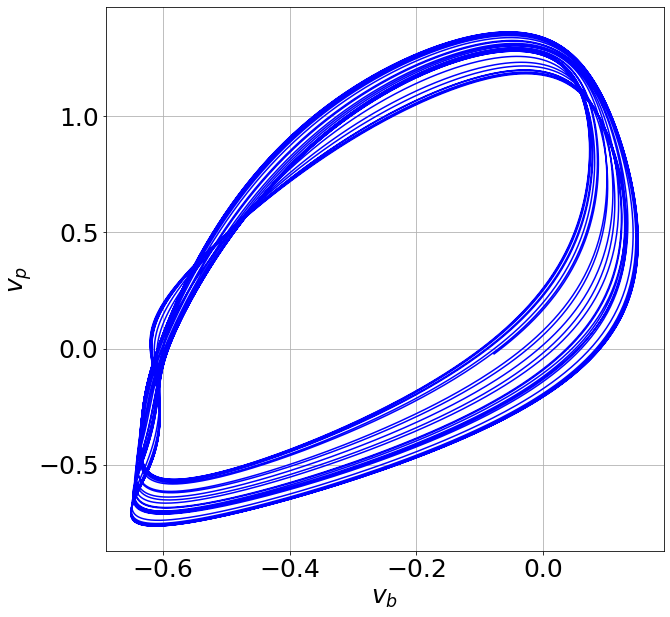

0.08496999999999982


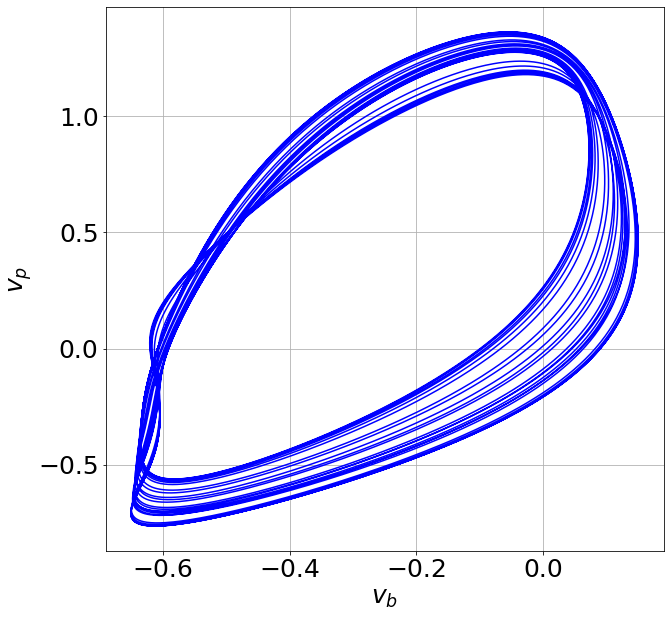

0.08497999999999982


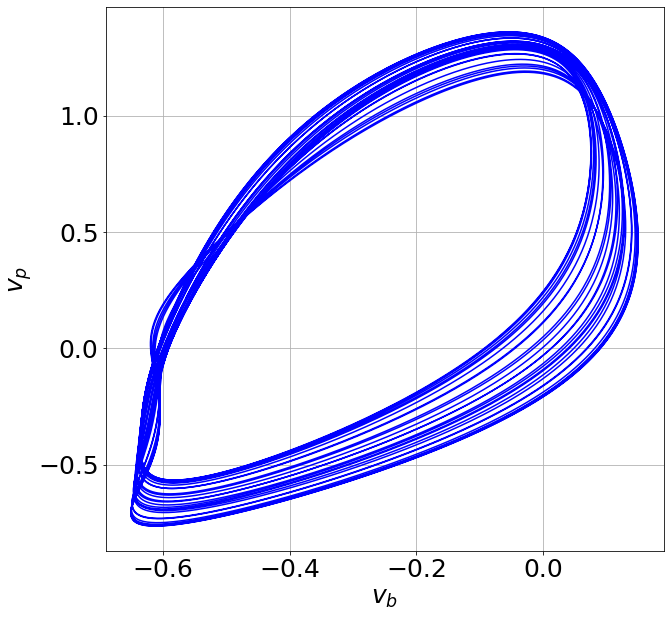

0.08498999999999982


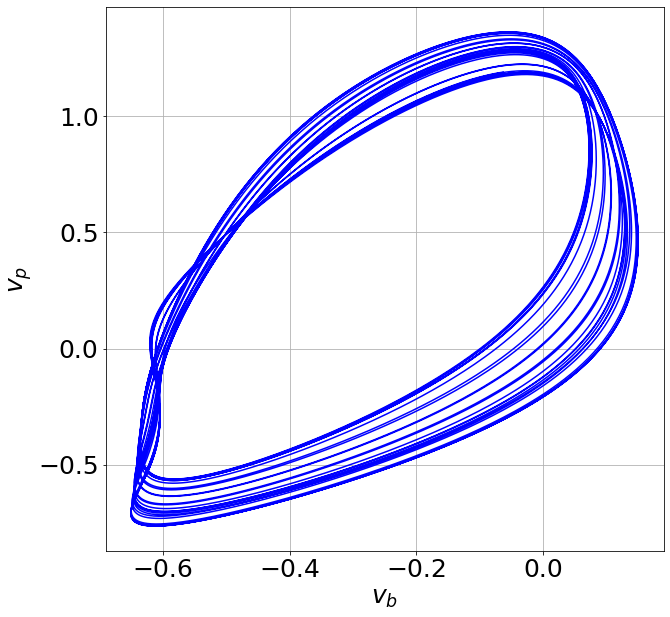

0.08499999999999981


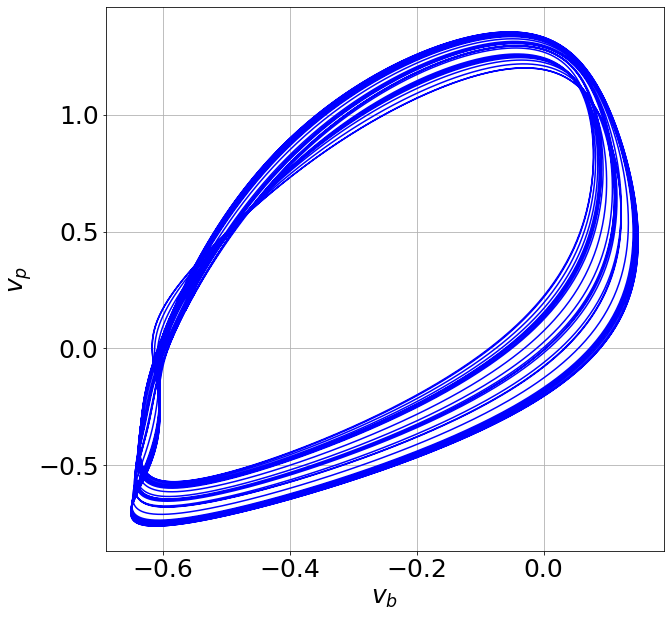

In [82]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.0845 # синаптический параметр
Bbpmax = 0.085 # синаптический параметр

scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)


signal_draw1(args1, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**15)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
# sol, t = calcODE(args, *(4 * np.random.random(6) - 2), 2000, 2**15)
                 
wavelet_draw(args1, scale, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=8000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)

sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)

for Bbp in np.arange(Bbpmin, Bbpmax, 0.00001):
    print(Bbp)
    
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    sol, t = calcODE(args, *sol[-1], 8000, 2 ** 18)

    vp = sol[-nt//2:, 2]
    vb = sol[-nt//2:, 3]


    plt.figure(figsize=(10, 10))
    plt.plot(vb, vp, 'b')
    plt.xlabel('$v_b$')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()


In [186]:
Bpb = 0.19 
Bbpmin = 0.065 
Bbpmax = 0.1 

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
directly_50, ws_direct_50 = max_wavelet_bootstrap(args, args1, scale)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse_50, ws_inverse_50 = max_wavelet_bootstrap(args, args1, scale)

KeyboardInterrupt: 

In [15]:
Bpb = 0.19 
Bbpmin = 0.065 
Bbpmax = 0.1 

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
directly, ws_direct = max_wavelet_bootstrap(args, args1, scale)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse, ws_inverse = max_wavelet_bootstrap(args, args1, scale)

(101, 4096, 100)
(101, 4096, 100)


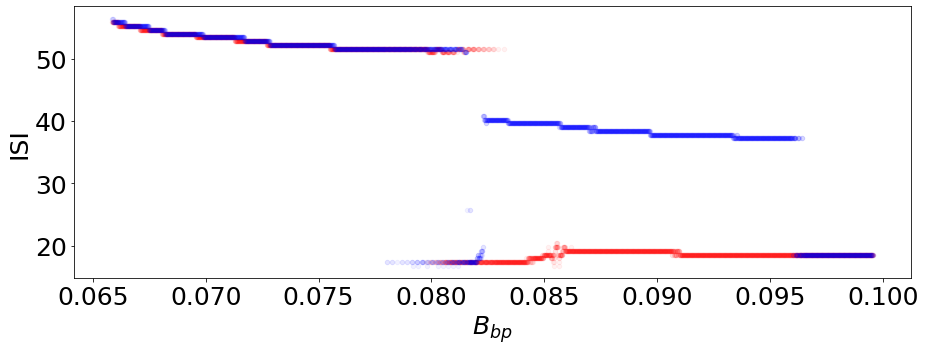

In [16]:
# print(len(directly))
# print(ws.shape)
nt = 2 ** 15
fig, ax = plt.subplots(figsize=(15, 5))
plt.ylabel('ISI')
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(directly))[100:-50], directly[100:-50], s=20, c='r', alpha=0.05)
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(inverse))[100:-50], inverse[100:-50][::-1], s=20, c='b', alpha=0.05)
# plt.imshow(np.abs(np.max(ws, axis = 2)), aspect='auto', origin='lower', alpha=1)
ax.set_xlabel('$B_{bp}$')
plt.show()

Text(0.5, 0, '$B_{bp}$')

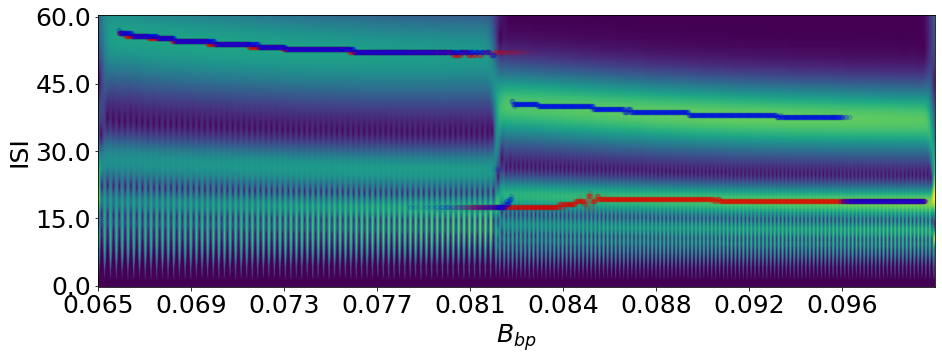

In [48]:
def my_func(args, scale, vp0=0, vb0=0, up0=0, ub0=0, sbp0=0, spb0=0, ts=8000, nt=2 ** 13, Bmin=0.065, Bmax=0.1):
    # sol, t = calcODE2(args, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)

    args0 = (args[0], args[1], args[2], args[3], args[4], args[5], args[6], args[7], args[8], args[10], args[11])
    sol, t = calcODE(args0, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)
    sol, t = calcODE1(args, *sol[-1], ts, nt)

    vp = sol[:, 0]
    vp = sAnalytics(vp)
    res = 2 * fftMorlet(t, vp, scale, 2 * np.pi)
    
#     fig, ax = plt.subplots(figsize=(15, 5))
    plt.ylabel('T')

    ticks = np.array([0, len(res) // 4, len(res) // 2, 3 * len(res) // 4, len(res) - 1])
    plt.yticks(ticks, scale[ticks])
    plt.imshow(np.abs(res)[:, ::-1], aspect='auto', origin='lower')
    xticks = np.linspace(0, nt, 10)
    xlabels = np.array([round(i, 3) for i in np.linspace(Bmin, Bmax, 10)])
    ax.set_xticks(xticks)
    ax.set_xticklabels(xlabels)
    ax.set_xlabel('$B_{bp}$')

    
    # print(len(directly))
# print(ws.shape)
nt = 2 ** 15
scale = np.linspace(0, 60, 101)

fig, ax = plt.subplots(figsize=(15, 5))

my_func(args1, scale)

plt.ylabel('ISI')
plt.scatter(np.linspace(0, 2**13, len(directly))[100:-50], directly[100:-50] / scale.max() * len(scale), s=20, c='r', alpha=0.05,)
plt.scatter(np.linspace(0, 2**13, len(inverse))[100:-50], inverse[100:-50][::-1] / scale.max() * len(scale), s=20, c='b', alpha=0.05)
# plt.imshow(np.abs(np.max(ws, axis = 2)), aspect='auto', origin='lower', alpha=1)
ax.set_xlabel('$B_{bp}$')
# plt.show()



# Построить карту начальных условий для B_bp = 0.097, когда попадаем на цикл с ISI = 17

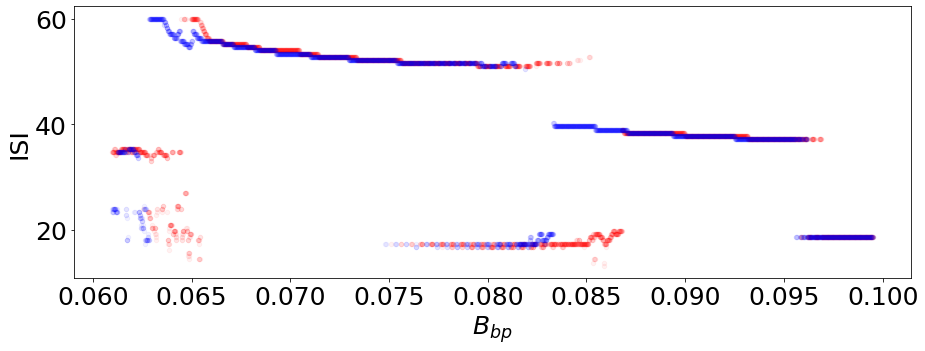

In [22]:
# print(len(directly))
# print(ws.shape)
nt = 2 ** 15
fig, ax = plt.subplots(figsize=(15, 5))
plt.ylabel('ISI')
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(directly))[100:-50], directly[100:-50], s=20, c='r', alpha=0.05)
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(inverse))[100:-50], inverse[100:-50][::-1], s=20, c='b', alpha=0.05)
# plt.imshow(np.abs(np.max(ws, axis = 2)), aspect='auto', origin='lower', alpha=1)
ax.set_xlabel('$B_{bp}$')
plt.show()

In [98]:
Bpb = 0.19 
Bbpmin = 0.079
Bbpmax = 0.086

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
scale = np.linspace(0, 60, 101)

# args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
# directly, ws_direct = max_wavelet_bootstrap(args, args1, scale)
sol_init, _ = calcODE1(args1, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, ts=4000, nt=2 ** 12)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse, ws_inverse = max_wavelet_bootstrap(args, args1, scale, sol_init=sol_init[-1])

(101, 4096, 100)


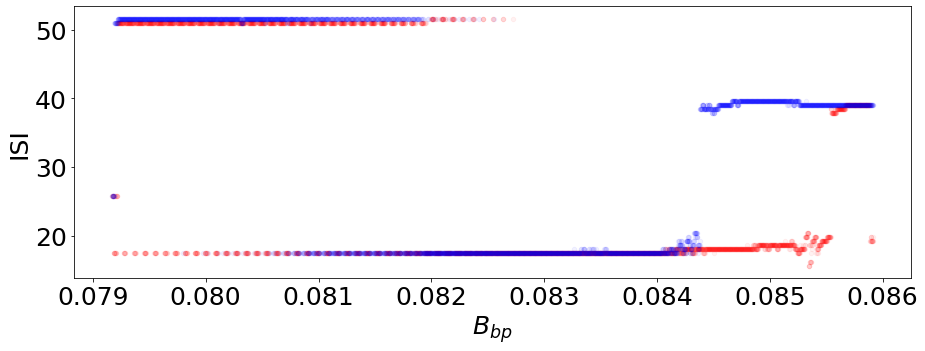

In [99]:
nt = 2 ** 15
fig, ax = plt.subplots(figsize=(15, 5))
plt.ylabel('ISI')
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(directly))[100:-50], directly[100:-50], s=20, c='r', alpha=0.05)
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(inverse))[100:-50], inverse[100:-50][::-1], s=20, c='b', alpha=0.05)
ax.set_xlabel('$B_{bp}$')
plt.show()

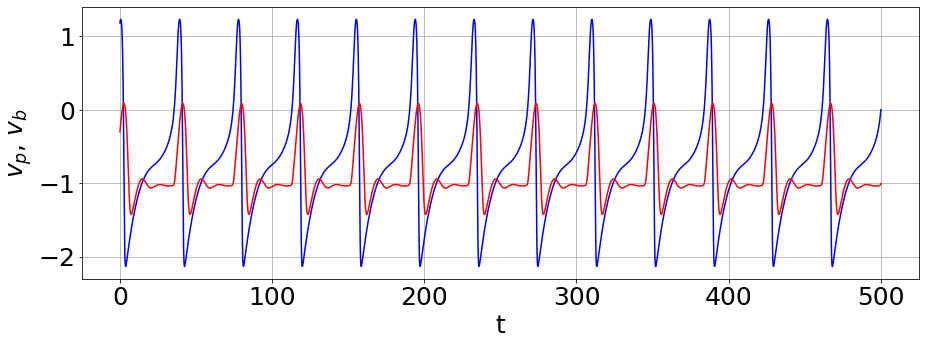

[  101 32768]


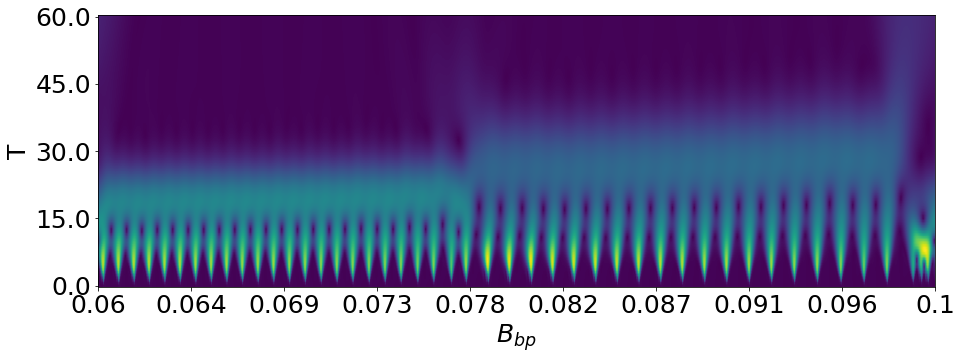

In [25]:
Bbp = 0.087
args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
sol, t = calcODE(args, *(4 * np.random.random(6) - 2), 2000, 2**15)
    
signal_draw(args)
wavelet_draw(args1, scale, *sol[-1], ts=2000, nt=2**15)

# ПОСЧИТАТЬ ДЛЯ СТАТЬИ

In [17]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.0845 # синаптический параметр
Bbpmax = 0.085 # синаптический параметр

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
                 
sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)

Bbp = 0.0849


args = (Iext, G, Ein, Eex, eps, a, b, A, 0.19, 0.0849, vsl)

epsilon = 0.0001
M = 10000000
T = .001
x1 = sol[-1]
x2 = x1 + np.array([epsilon, 0, 0, 0, 0, 0])
perturbations = []
for i in tqdm(range(M)):
    sol1, t = calcODE(args, *x1, ts=T, nt=10)
    sol2, t = calcODE(args, *x2, ts=T, nt=10)
    perturbations.append(np.log(np.linalg.norm(sol2[-1] - sol1[-1]) / epsilon))
    x1 = sol1[-1]
    x2 = x1 + (sol2[-1] - sol1[-1]) / np.linalg.norm(sol2[-1] - sol1[-1]) * epsilon
np.mean(perturbations) / T


100%|██████████| 10000000/10000000 [1:11:13<00:00, 2339.83it/s]


SyntaxError: 'return' outside function (<ipython-input-17-ffebc4fac857>, line 28)

In [18]:
np.mean(perturbations) 

1.6675714792123955e-06

In [19]:
np.mean(perturbations) / T

0.0016675714792123955

In [ ]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.0845 # синаптический параметр
Bbpmax = 0.085 # синаптический параметр

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
                 
sol, t = calcODE(args, -1.5, -1.5, 0.5, 0.5, 0.5, 0.5, 8000, 2 ** 18)

Bbp = 0.0849


args = (Iext, G, Ein, Eex, eps, a, b, A, 0.19, 0.0849, vsl)

epsilon = 0.0001
M = 10000000
T = .001
x1 = sol[-1]
x2 = x1 + np.array([epsilon, 0, 0, 0, 0, 0])
perturbations = []
for i in tqdm(range(M)):
    sol1, t = calcODE(args, *x1, ts=T, nt=10)
    sol2, t = calcODE(args, *x2, ts=T, nt=10)
    perturbations.append(np.log(np.linalg.norm(sol2[-1] - sol1[-1]) / epsilon))
    x1 = sol1[-1]
    x2 = x1 + (sol2[-1] - sol1[-1]) / np.linalg.norm(sol2[-1] - sol1[-1]) * epsilon
np.mean(perturbations) / T


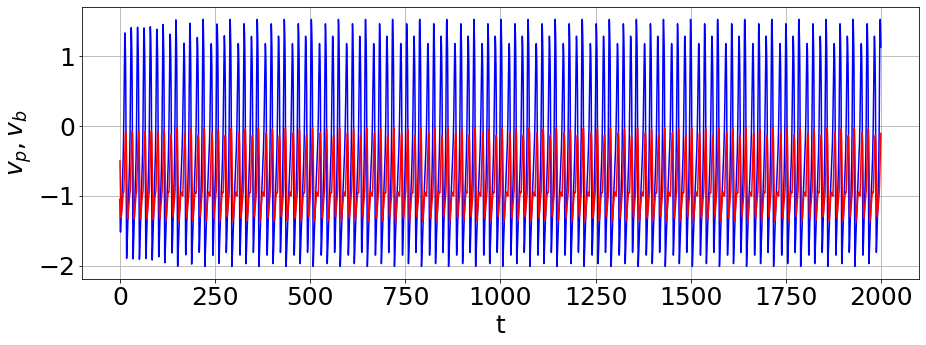

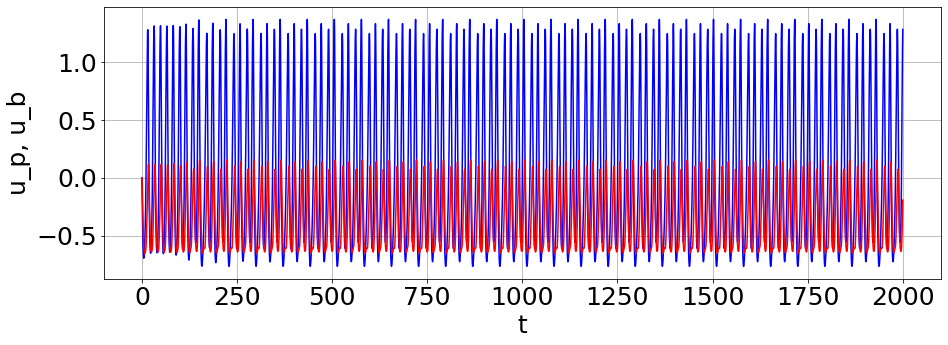

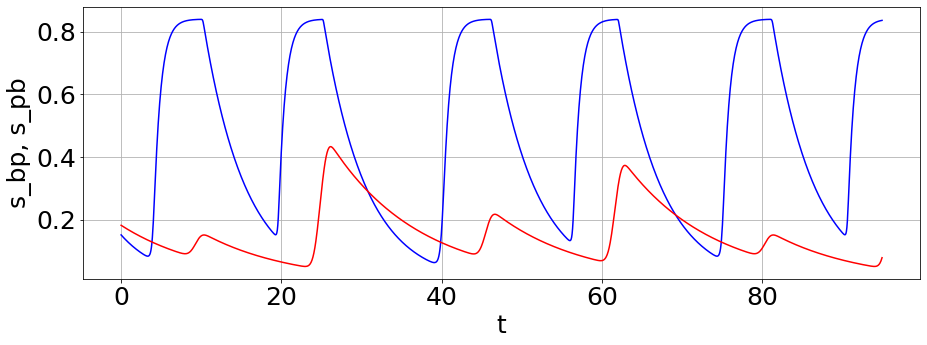

In [162]:
Bpb = 0.19 
Bbpmin = 0.09 
Bbpmax = 0.09

scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
signal_draw1(args1, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=2000, nt=2**15)


In [ ]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.06 # синаптический параметр
Bbpmax = 0.1 # синаптический параметр

a_gr_curr = None


args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
sol_init, t = calcODE(args, *(4 * np.random.random(6) - 2), 2000, 2**13)
sol_init = sol_init[len(sol_init) // 2 :]

from scipy.signal import argrelextrema

ws = None
while True:
    args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
    sol, t = calcODE1(args1, *sol_init[np.random.randint(0, len(sol_init))], 2000, 2**12)

    scale = np.linspace(0, 60, 101)
    w = fftMorlet(t, sol[:, 0], scale, np.pi)
    w = np.abs(w)
#     w = sp.ndimage.gaussian_filter1d(np.abs(w)**0.1, 200, axis=-1)**10
#     w =argrelextrema(np.abs(w), np.less, axis=-1, )
#     plt.imshow(np.abs(w), aspect='auto', origin='lower')
#     plt.show()
#     break
    
    if ws is None:
        ws = w[..., np.newaxis]
    else:
        ws = np.concatenate([ws, w[..., np.newaxis]], axis=-1)
        
    
    plt.figure(figsize=(20, 10))
    plt.plot(scale[np.argmax(np.quantile(ws, 0.25, axis=-1), axis=0)])
    plt.show()

Cначала гоним динамику 2000 шагов с фиксированным Bbp = Bbpmin, ждем когда решение выйдет на аттрактор.

Отсекаем первую половину решений (т.к. "скорее всего" за 1000 шагов мы пришли к аттрактору)

Вторая половина шагов будет использваться в качестве начальных условий (мы все еще стартуем с одной области аттрактора (по периоду), но используя разные фазы)

Считаем вейвлеты для всех начальных условий и кладем в тензор, который состоит из модулей вейвлетов, рассчитанных при различных начальных условиях

Берем 25% квантиль по размерности начальных условий из тензора вейвлетов, описанного выше (25% т.к. внизу графика вейвлета грубо говоря у нас яркие пики с сильными затемнениями -- они нас не интересуют, а наверху менее яркие, но зато более размазанные сигналы, поэтому при отбрасывании 75% по яркости мы надеемся заглушить нижние пики)

Строим графики максимумов по параметру масштабирования

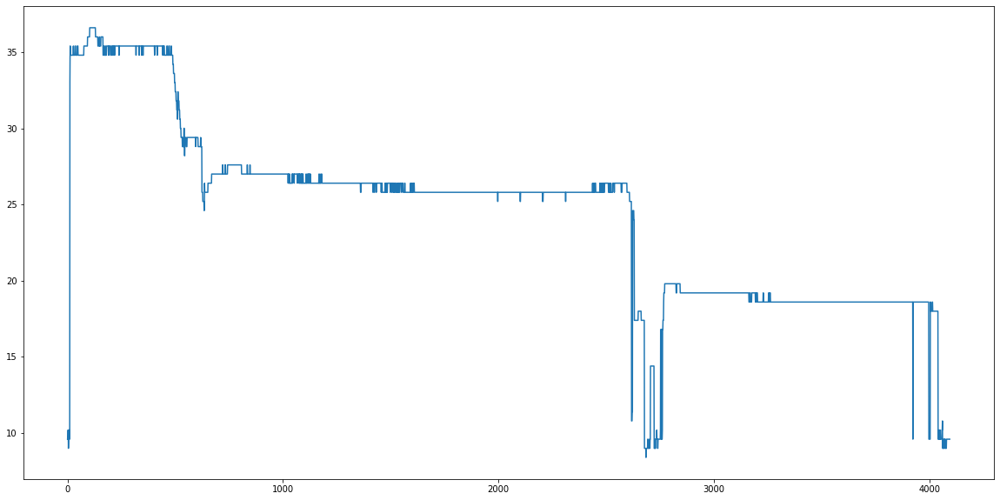

In [8]:
Bpb = 0.19 
Bbpmin = 0.06 
Bbpmax = 0.1 

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
sol_init, t = calcODE(args, 0, 0, 0, 0, 0, 0, ts=2000, nt=2**13)
sol_init = sol_init[len(sol_init) // 2 :]

ws = None

for _ in range(100):
    args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
    sol, t = calcODE1(args1, *sol_init[np.random.randint(0, len(sol_init))], 2000, 2**12)

    scale = np.linspace(0, 60, 101)
    w = fftMorlet(t, sol[:, 0], scale, np.pi)
    w = np.abs(w)
    
    if ws is None:
        ws = w[..., np.newaxis]
    else:
        ws = np.concatenate([ws, w[..., np.newaxis]], axis=-1)
        
    
plt.figure(figsize=(20, 10))
plt.plot(scale[np.argmax(np.quantile(ws, 0.25, axis=-1), axis=0)])
plt.show()

In [383]:
Bpb = 0.19 
Bbpmin = 0.06 
Bbpmax = 0.1 

scale = np.linspace(0, 60, 100)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
directly, initB_d = max_wavelet_bootstrap(args, scale)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse, init_B_inv = max_wavelet_bootstrap(args, scale)

Text(0, 0.5, 'T')

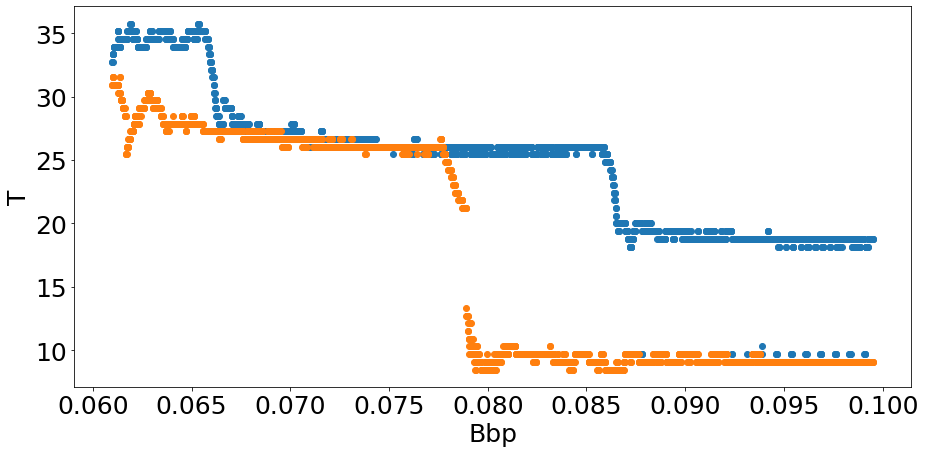

In [40]:
plt.figure(figsize=(15, 7))
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(directly))[100:-50], directly[100:-50])
plt.scatter(np.linspace(Bbpmin, Bbpmax, len(directly))[100:-50], inverse[::-1][100:-50])
plt.xlabel('Bbp')
plt.ylabel('T')
# plt.title('Петля гистерезиса')

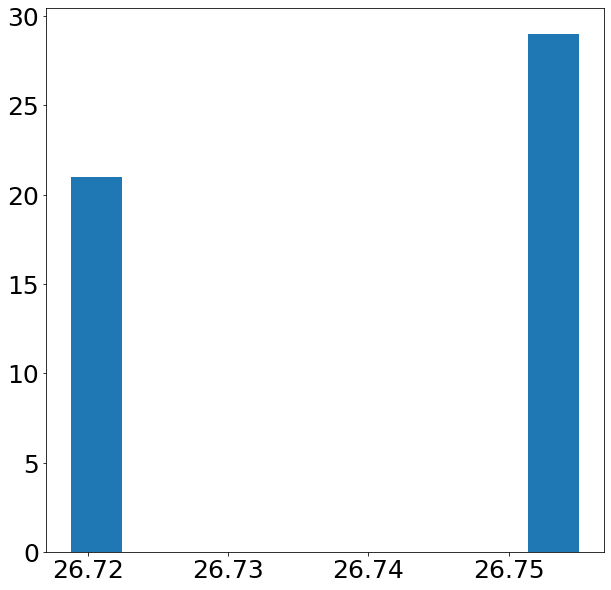

In [46]:
Bpb = 0.19 
Bbpmin = 0.07
Bbpmax = 0.07
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

T_of_attractors(args1, 50)

T = 25.802649306804575
Bbp = 0.083


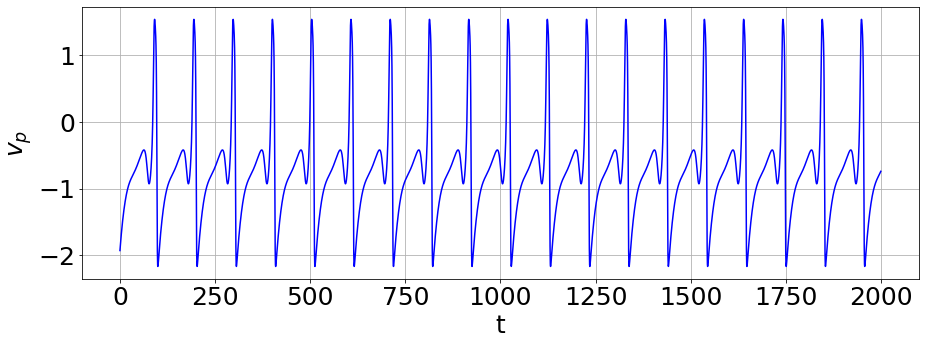

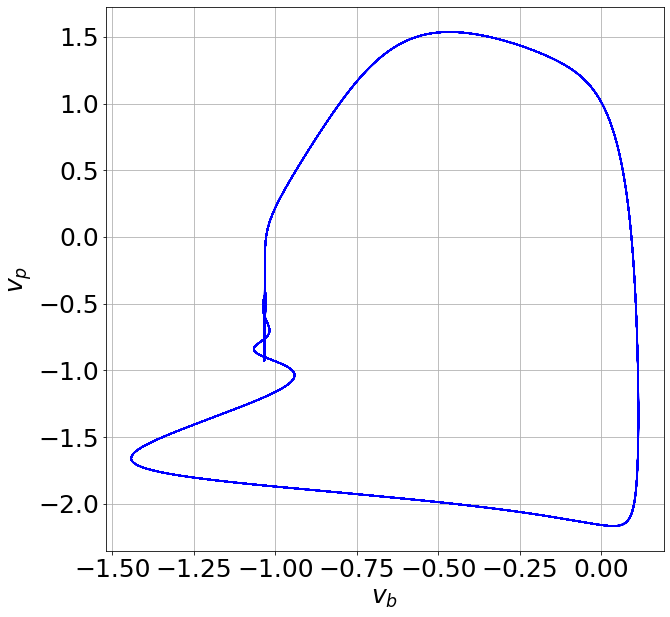

T = 25.846676008999463
Bbp = 0.08320000000000001


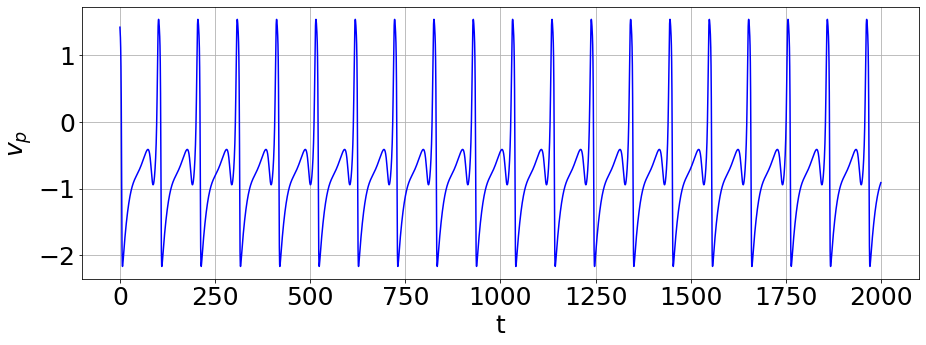

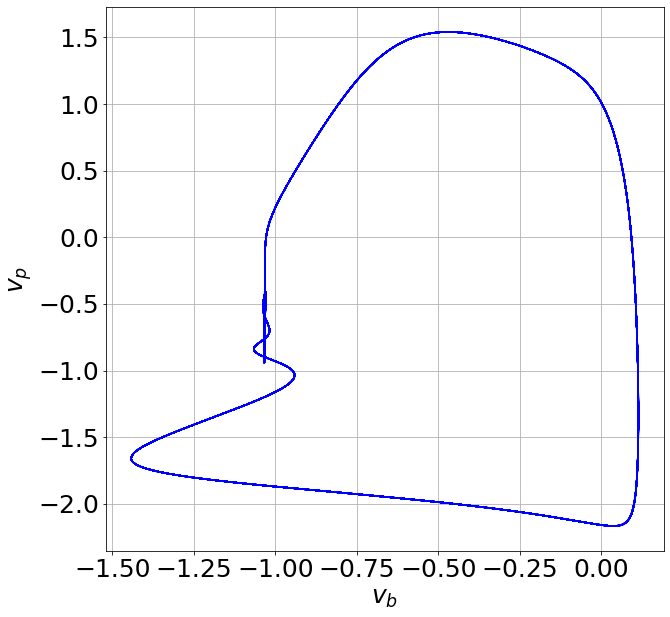

T = 25.900708779874993
Bbp = 0.08340000000000002


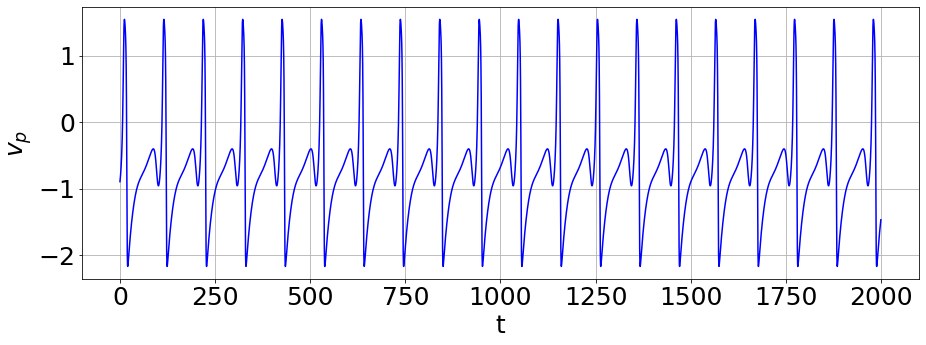

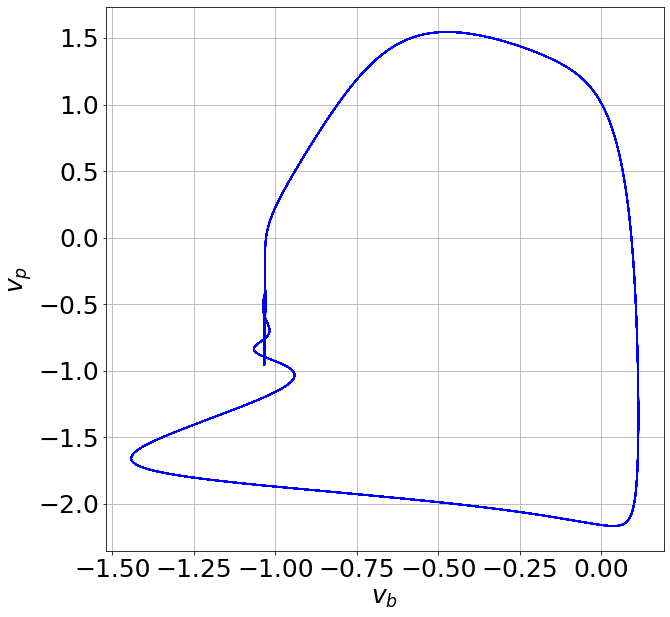

T = 25.96374701256312
Bbp = 0.08360000000000002


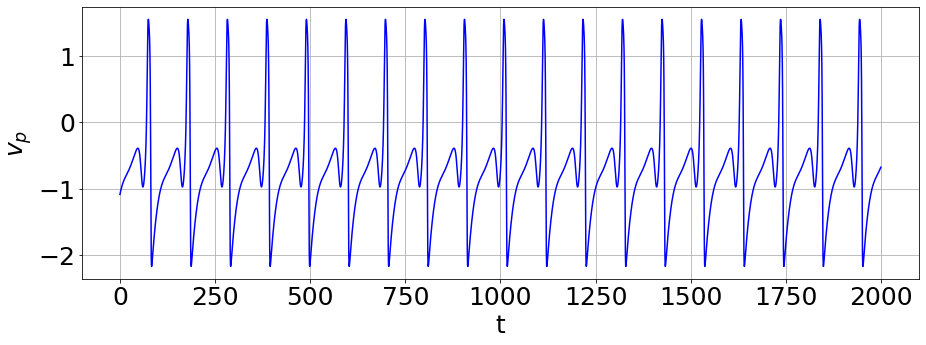

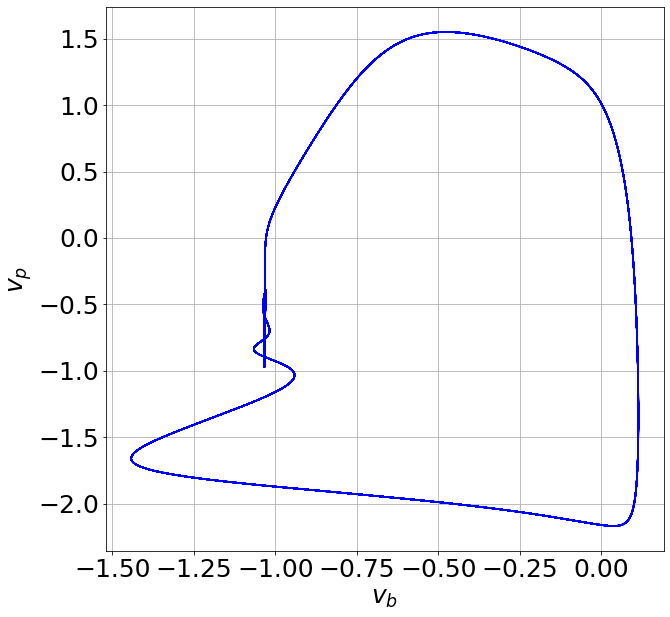

T = 26.041794348272227
Bbp = 0.08380000000000003


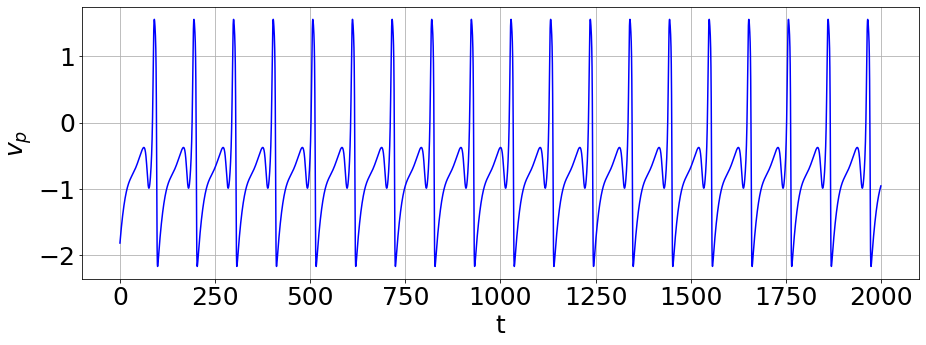

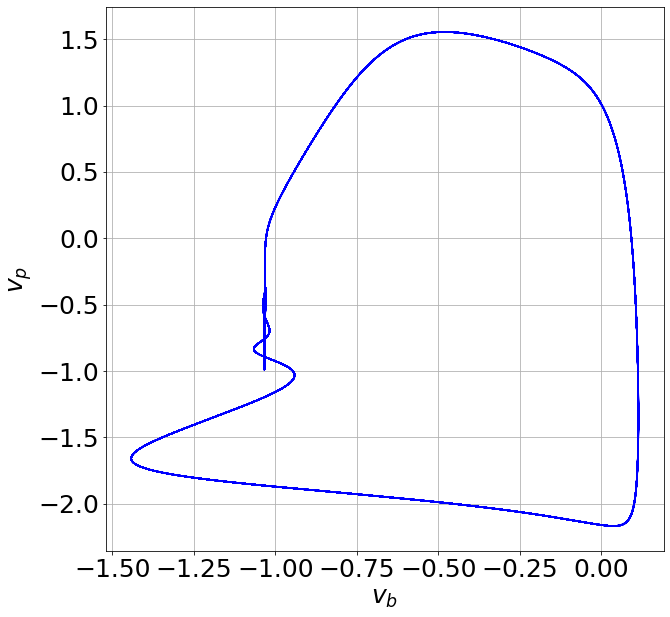

T = 26.137852607606515
Bbp = 0.08400000000000003


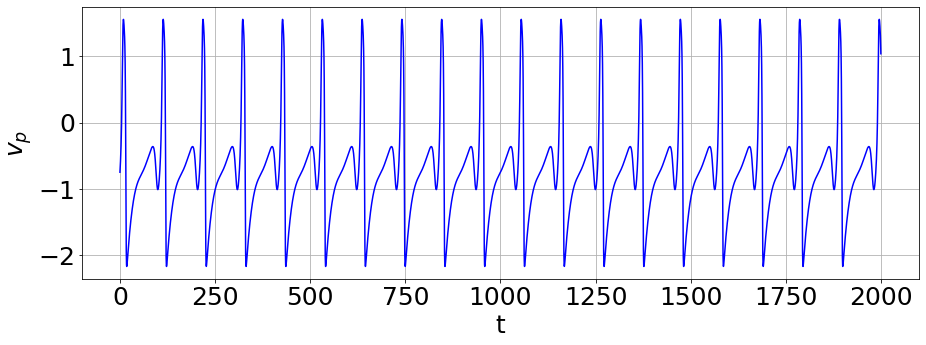

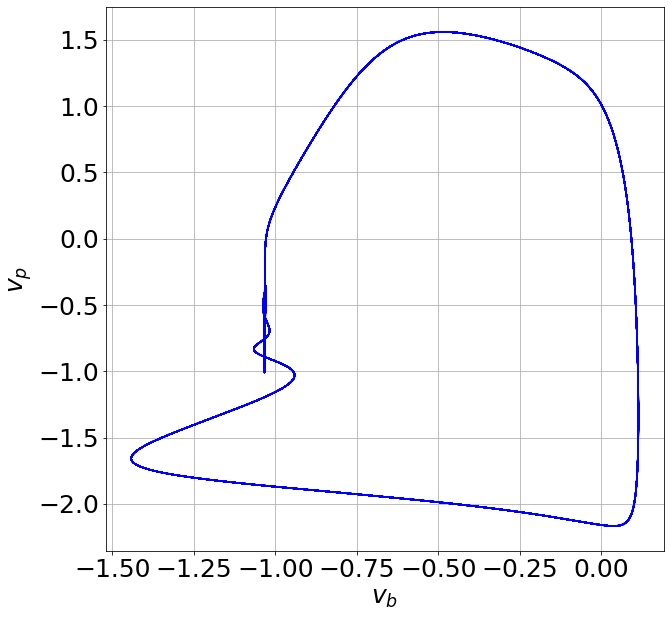

T = 26.262194687744785
Bbp = 0.08420000000000004


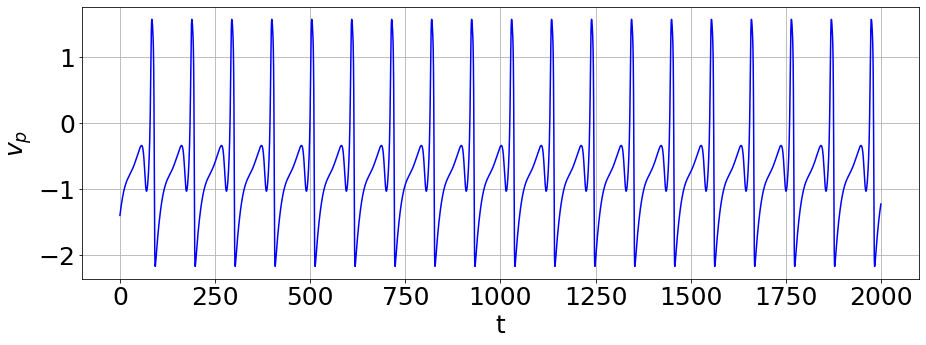

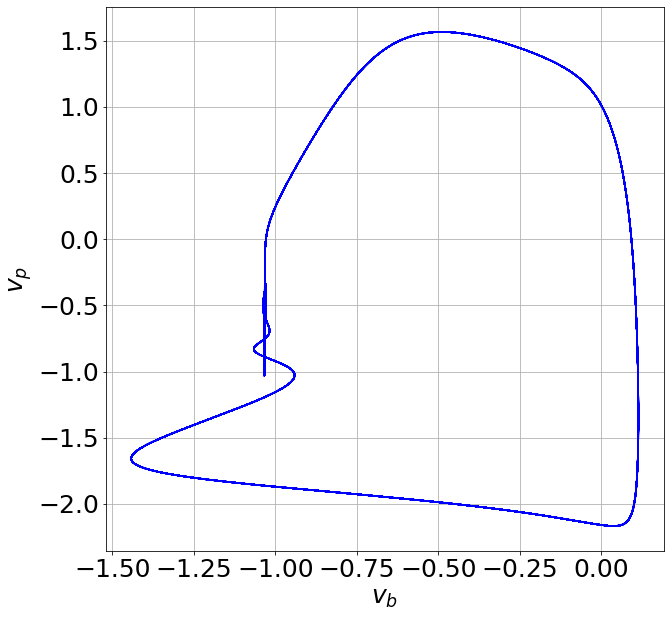

T = 9.290119837798585
Bbp = 0.08440000000000004


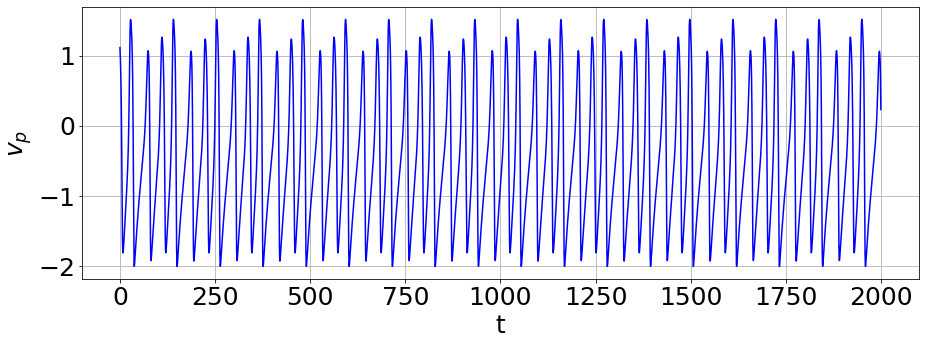

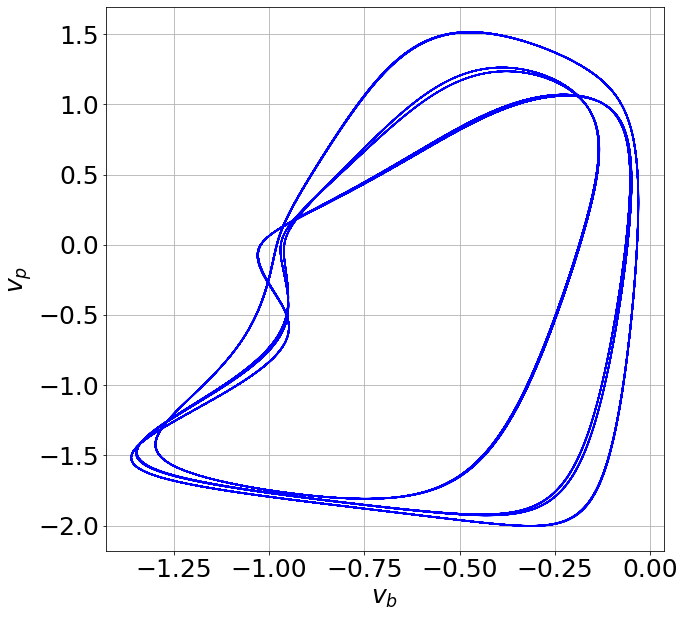

T = 19.33459228387871
Bbp = 0.08460000000000005


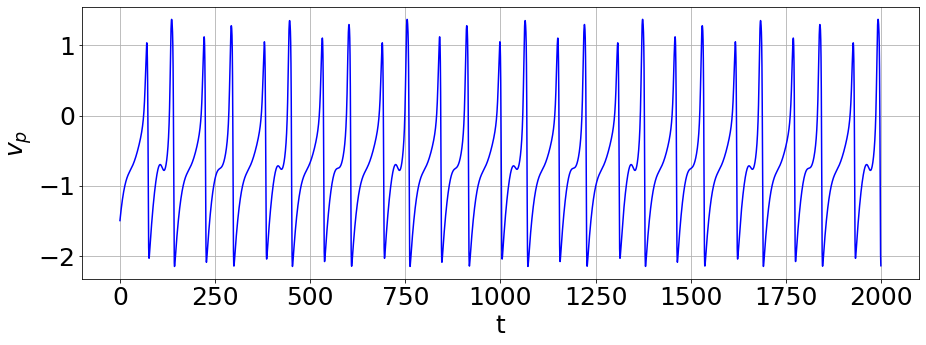

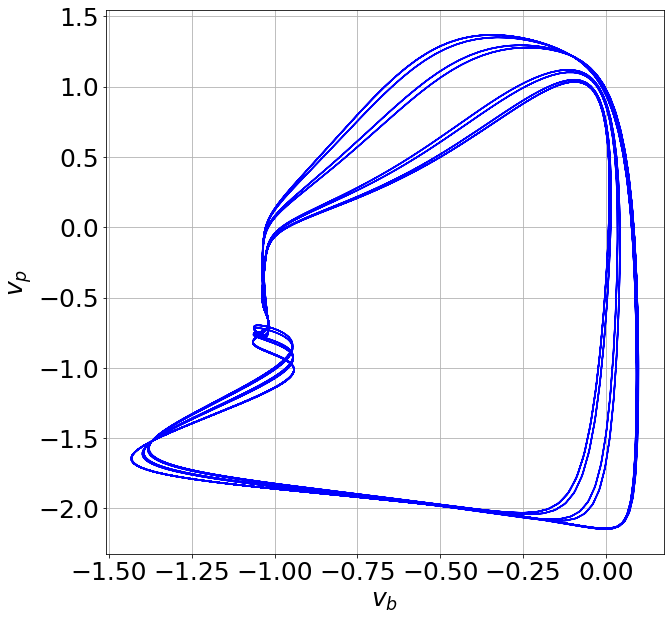

T = 19.41278620050962
Bbp = 0.08480000000000006


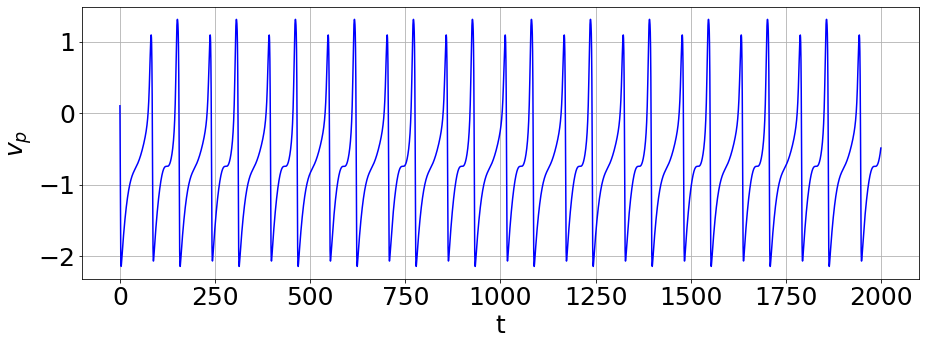

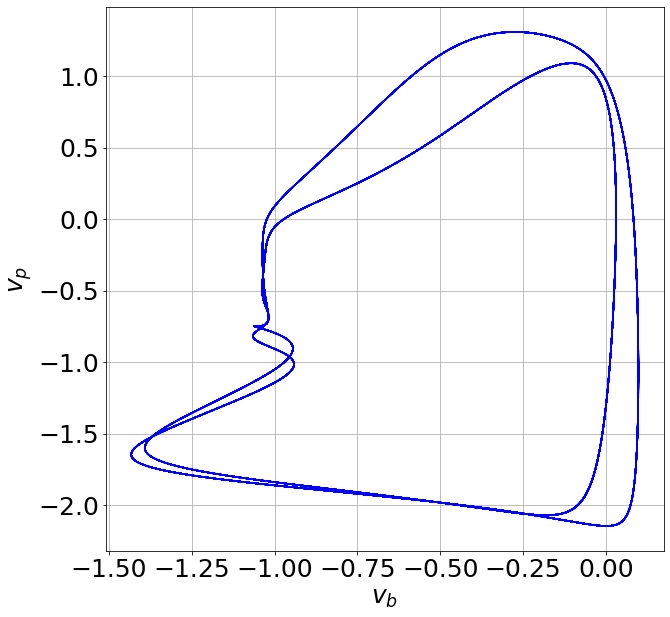

T = 19.439160221044435
Bbp = 0.08500000000000006


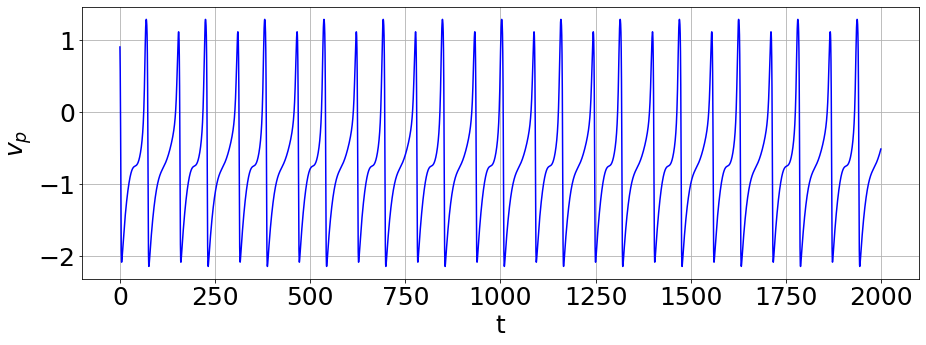

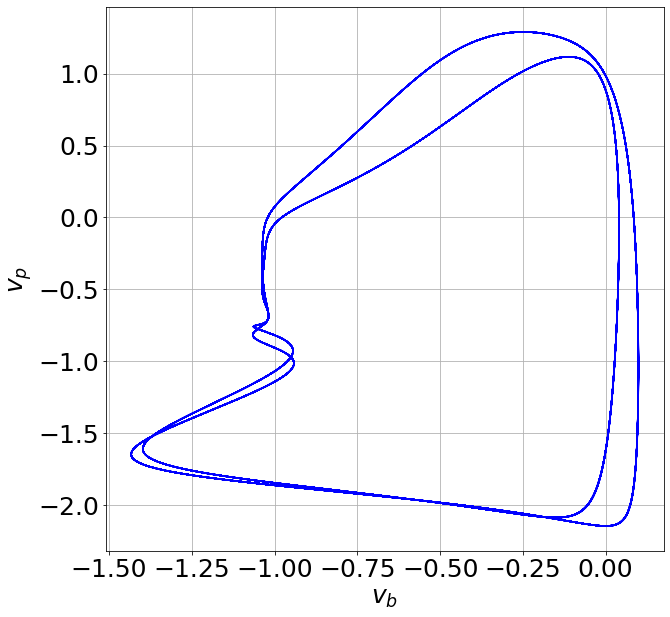

T = 9.030704394942806
Bbp = 0.08520000000000007


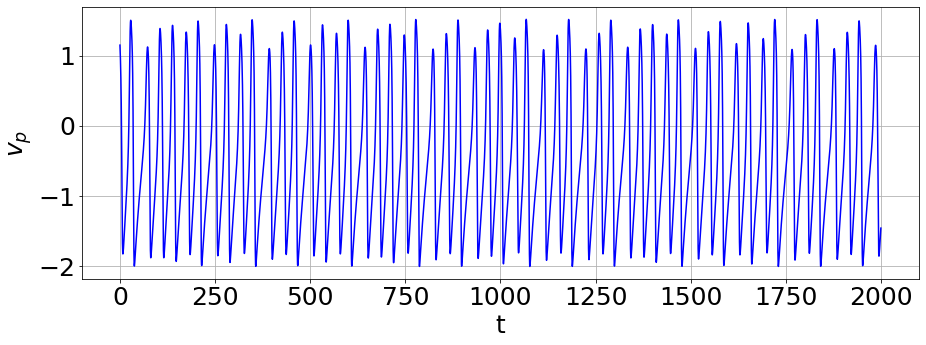

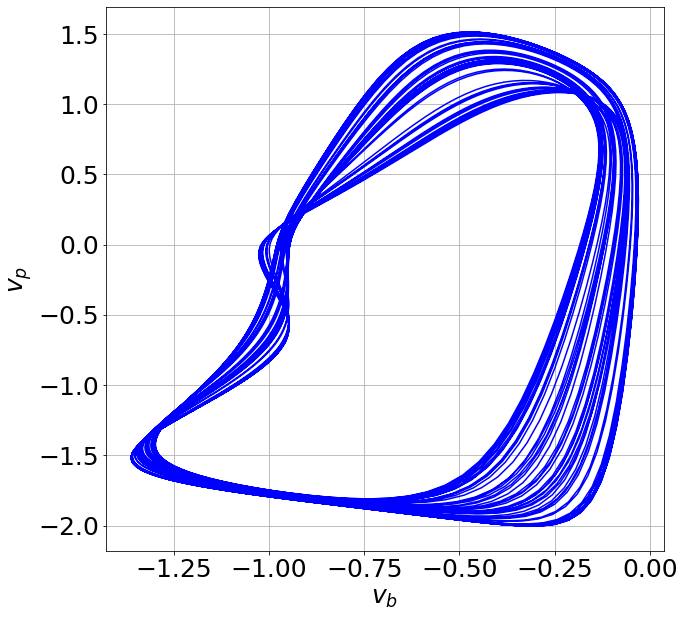

T = 8.948781368484255
Bbp = 0.08540000000000007


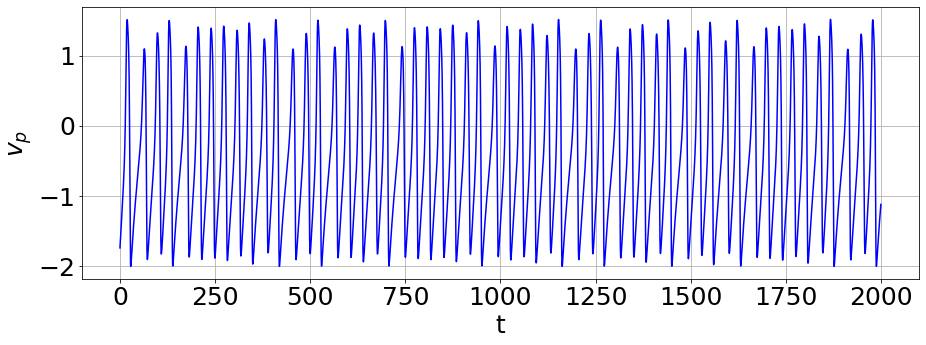

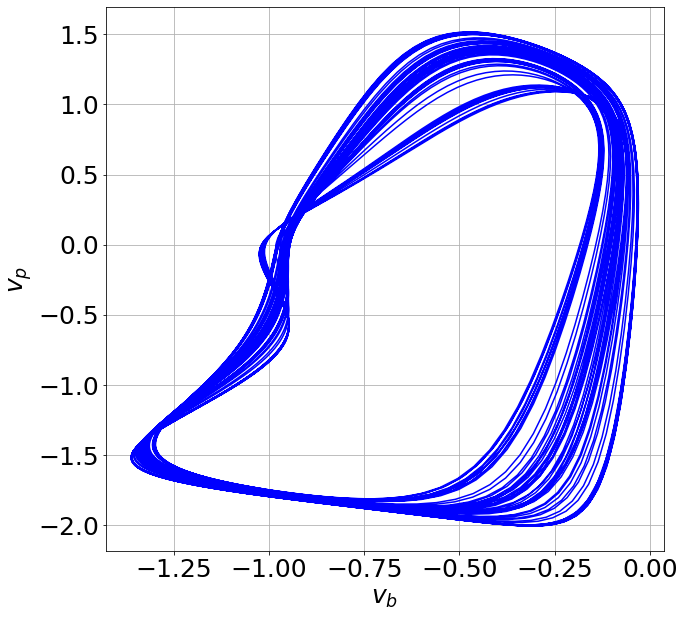

T = 8.938837135059492
Bbp = 0.08560000000000008


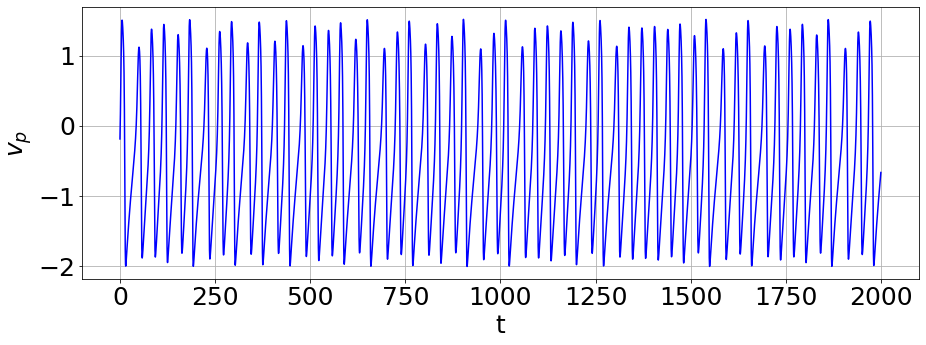

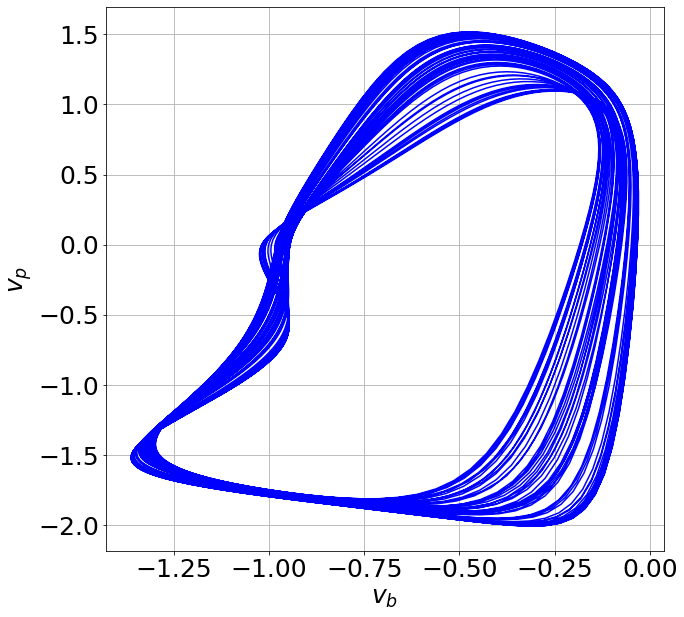

T = 8.949682219554296
Bbp = 0.08580000000000008


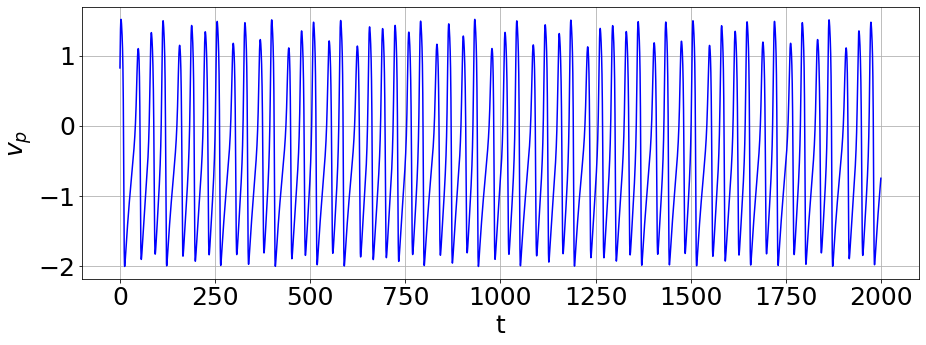

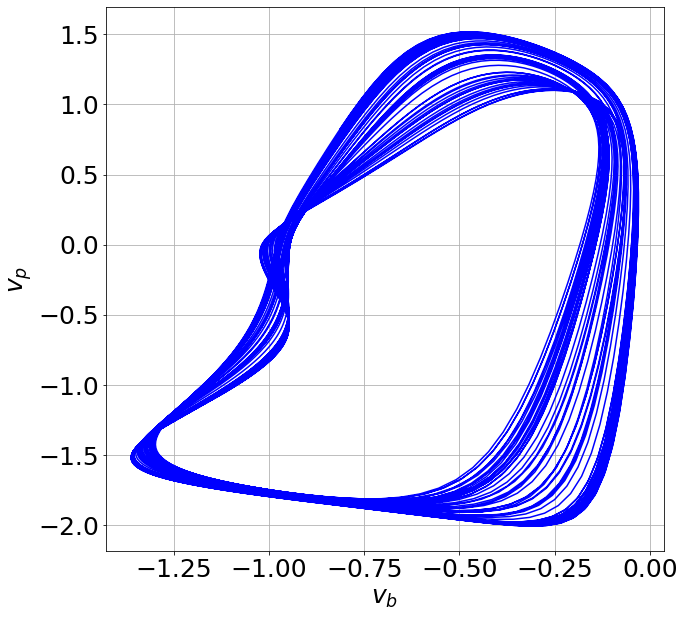

In [392]:
Bpb = 0.19
Bbpmin = 0.083
Bbpmax = 0.086

ts = 4000
nt = 2 ** 15
vp0 = -0.5
vb0 = -0.5
up0 = 0
ub0 = 0
sbp0 = 0.5
spb0 = 0.4
T = []
for Bbp in np.arange(Bbpmin, Bbpmax, 0.0002):
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    sol, t = calcODE(args, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)
    T_one = mean_T_vp(sol[:, 0], t) / 2
    print(f'T = {T_one}')
    print(f'Bbp = {Bbp}')
    plt.figure(figsize=(15, 5))
    plt.plot(np.linspace(0, ts//2, nt//4), sol[-nt//4:, 0], 'b')
    plt.xlabel('t')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()
    T.append(T_one)
    vp = sol[-nt//4:, 0]
    vb = sol[-nt//4:, 1]
    plt.figure(figsize=(10, 10))
    plt.plot(vb, vp, 'b')
    plt.xlabel('$v_b$')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()


T = 19.211029538195405
Bbp = 0.088


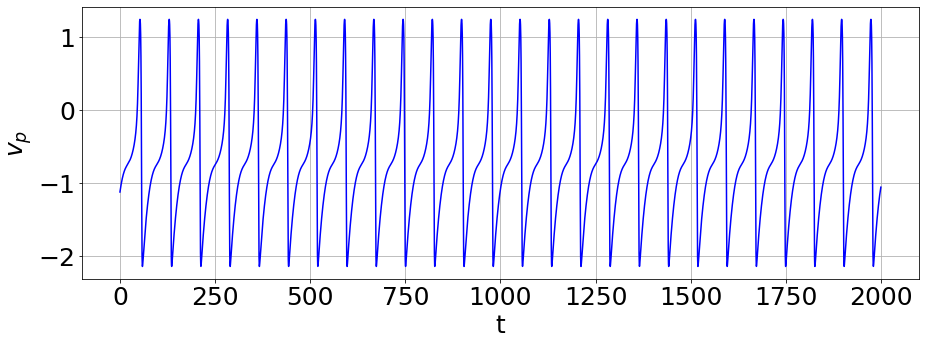

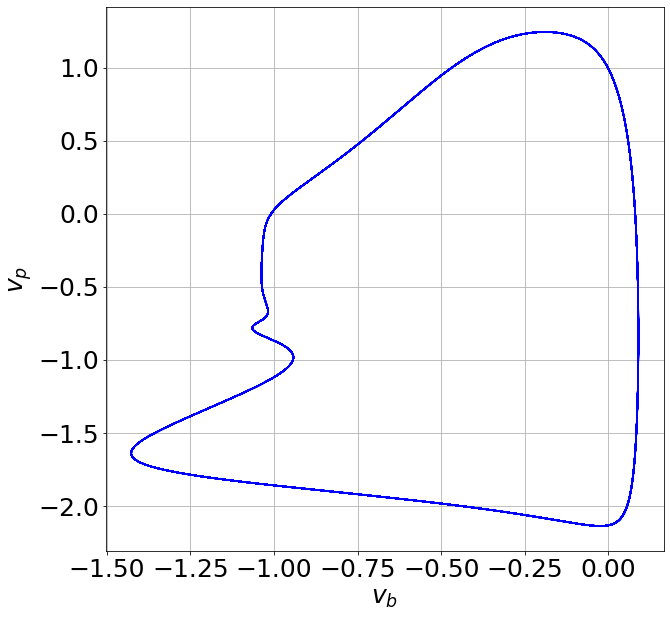

In [456]:
Bpb = 0.19
Bbpmin = 0.083
Bbpmax = 0.086

ts = 4000
nt = 2 ** 15
vp0 = -1.5
vb0 = -1.5
up0 = 0
ub0 = 0
sbp0 = 0.5
spb0 = 0.5
T = []
for Bbp in np.arange(0.088, 0.089, 0.01):
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
    sol, t = calcODE(args, vp0, vb0, up0, ub0, sbp0, spb0, ts, nt)
    T_one = mean_T_vp(sol[:, 0], t) / 2
    print(f'T = {T_one}')
    print(f'Bbp = {Bbp}')
    plt.figure(figsize=(15, 5))
    plt.plot(np.linspace(0, ts//2, nt//4), sol[-nt//4:, 0], 'b')
    plt.xlabel('t')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()
    T.append(T_one)
    vp = sol[-nt//4:, 0]
    vb = sol[-nt//4:, 1]
    plt.figure(figsize=(10, 10))
    plt.plot(vb, vp, 'b')
    plt.xlabel('$v_b$')
    plt.ylabel('$v_p$')
    plt.grid()
    plt.show()


In [26]:
Bpb = 0.19 
Bbp = 0.086

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

lyapunov_first_statistics(args, 10)

(0.027015312613890057, 0.014122131084545112)

In [ ]:
Bpb = 0.19 
Bbp = 0.081

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)
parameters_for_Tvv(args)

T = 8.895288250751047
s_pb = 0.0


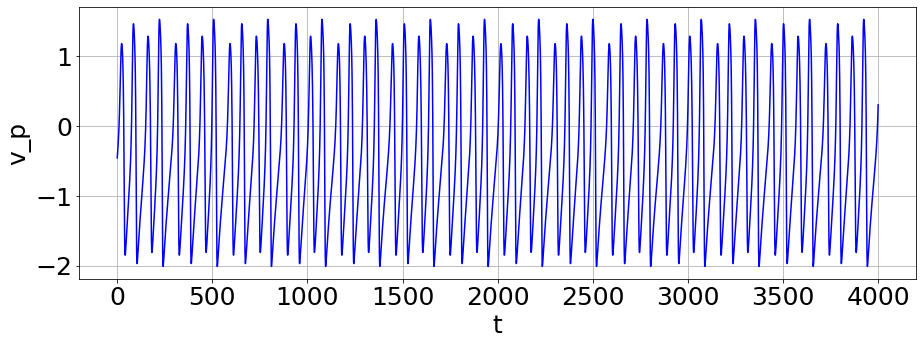

T = 8.895288250751047
s_pb = 0.01


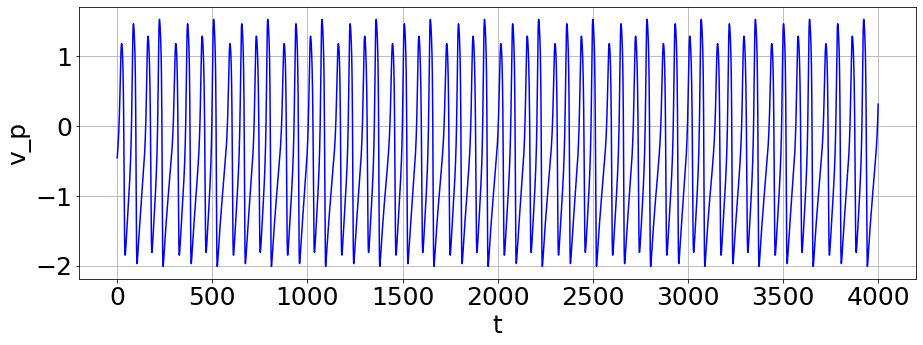

T = 8.895288250751047
s_pb = 0.02


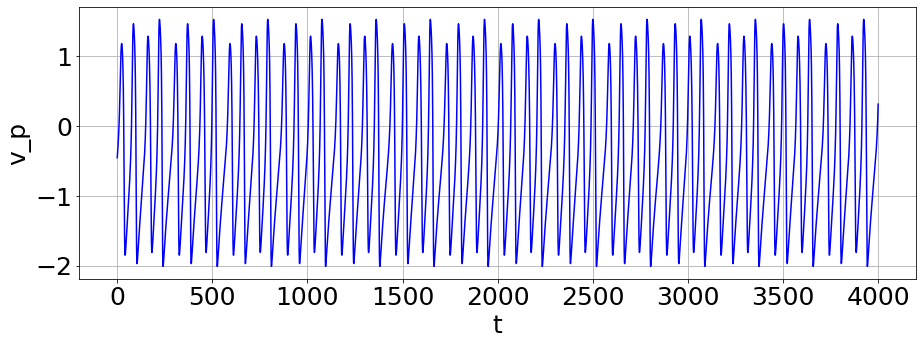

T = 8.895288250751047
s_pb = 0.03


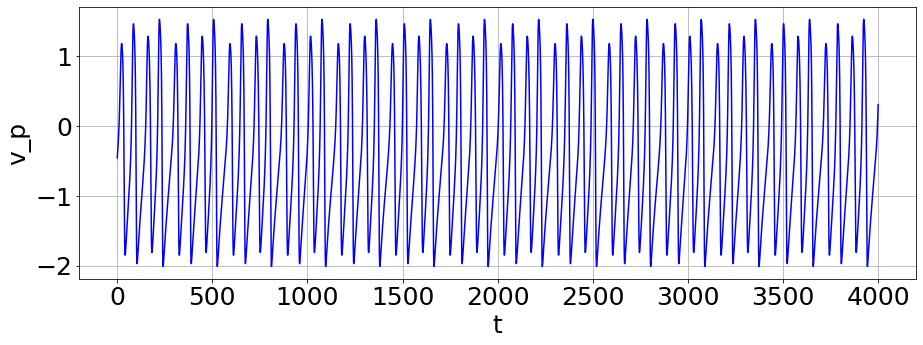

T = 8.894945346150193
s_pb = 0.04


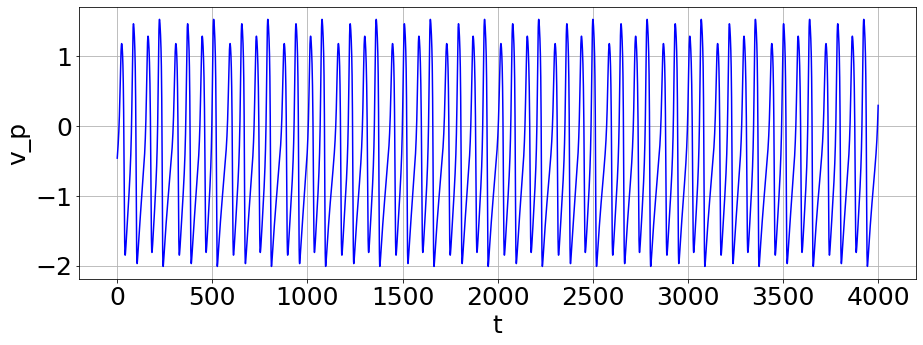

T = 8.894945346150193
s_pb = 0.05


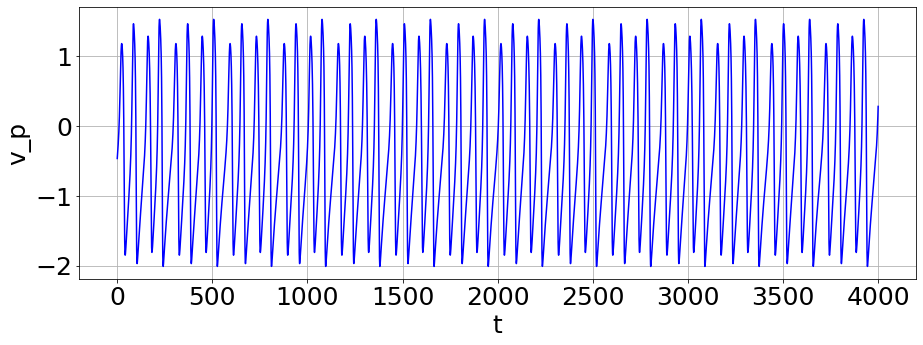

T = 8.895288250751047
s_pb = 0.06


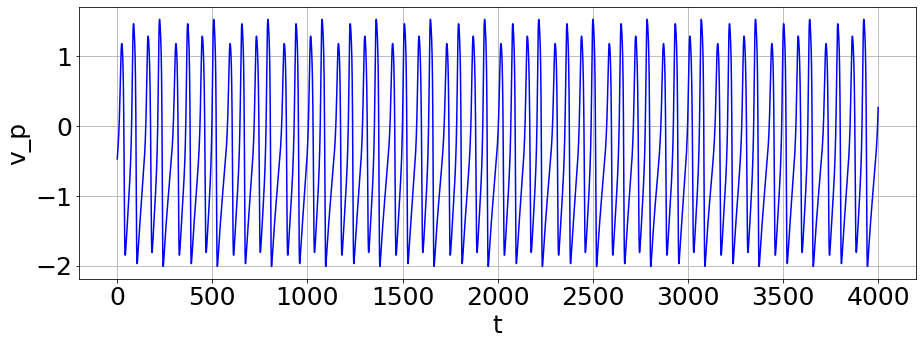

T = 8.894945346150193
s_pb = 0.07


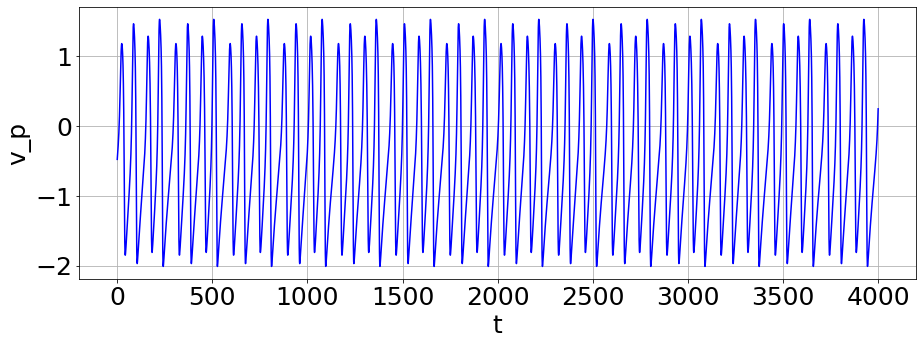

T = 8.895288250751047
s_pb = 0.08


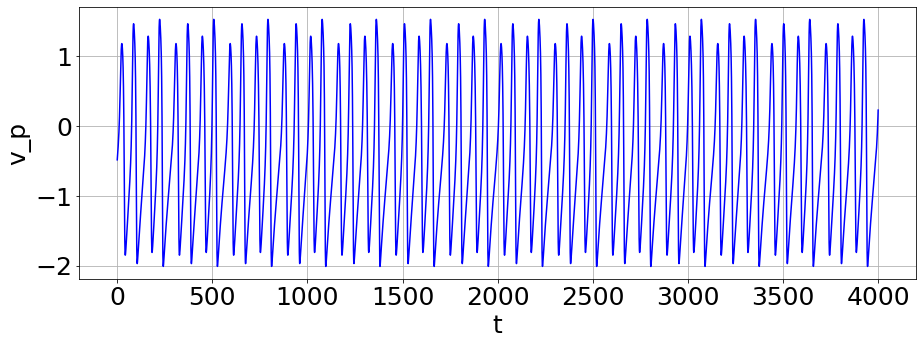

T = 8.895288250751047
s_pb = 0.09


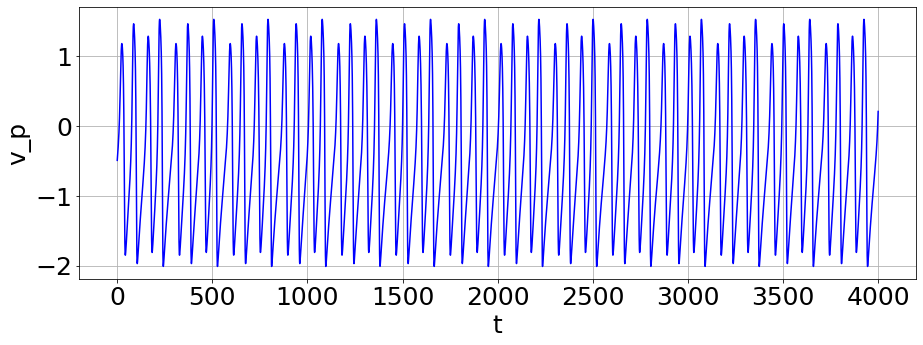

T = 8.894945346150193
s_pb = 0.1


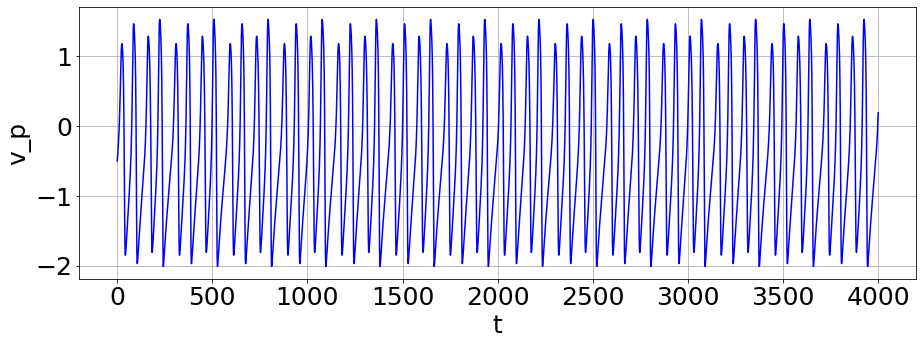

T = 8.895288250751047
s_pb = 0.11


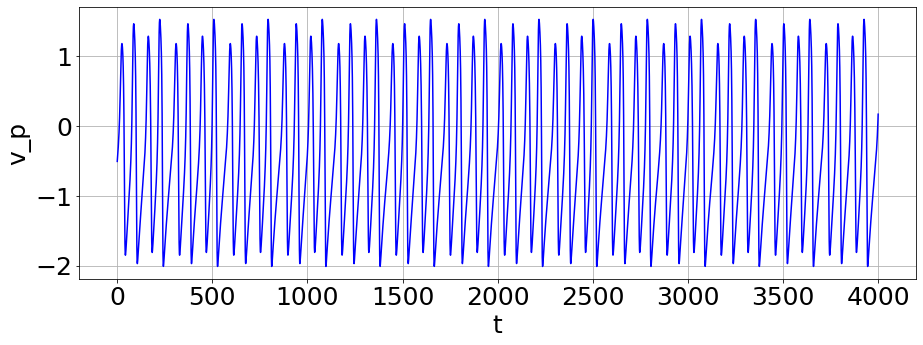

T = 8.894945346150193
s_pb = 0.12


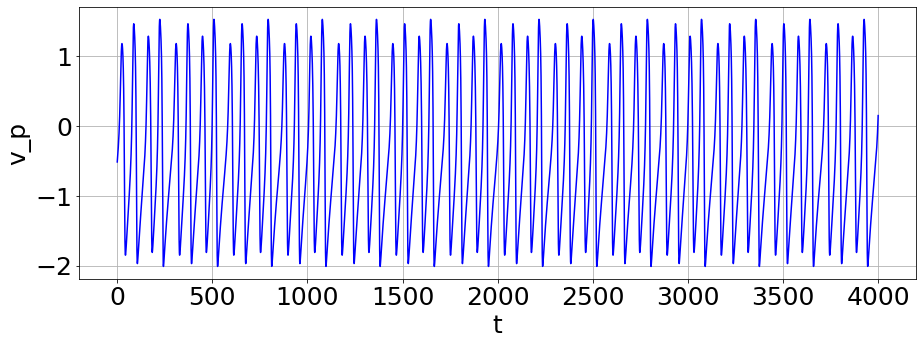

T = 8.895288250751047
s_pb = 0.13


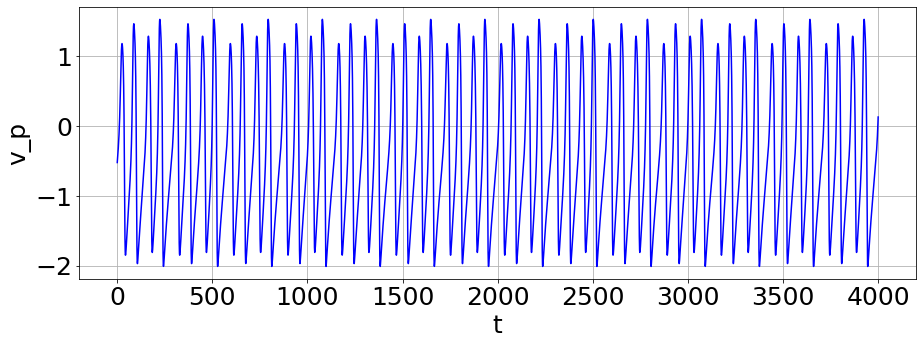

T = 8.894945346150193
s_pb = 0.14


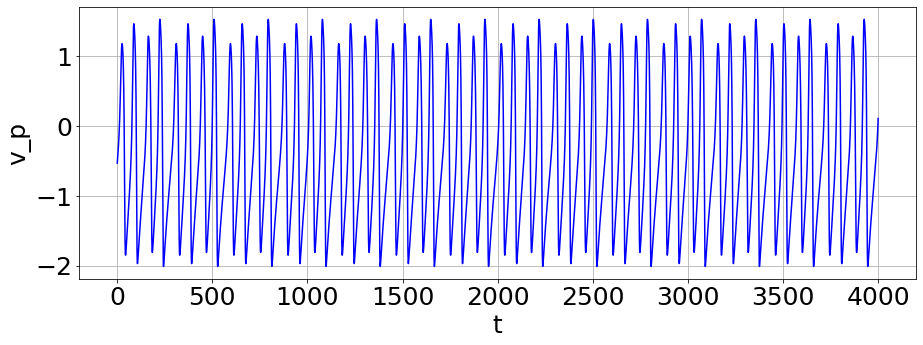

T = 8.895288250751047
s_pb = 0.15


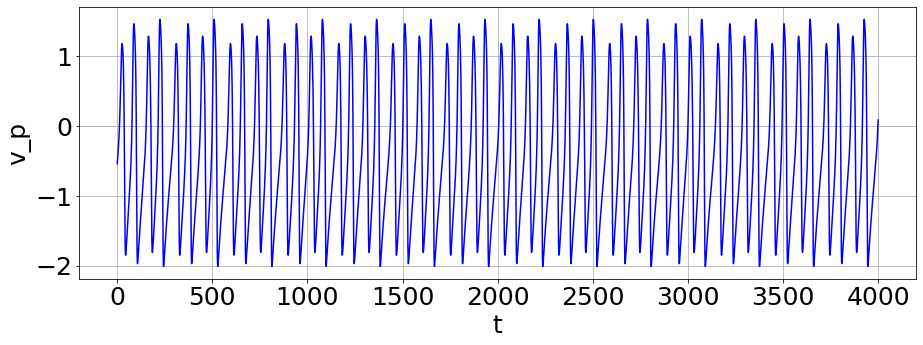

T = 8.894945346150193
s_pb = 0.16


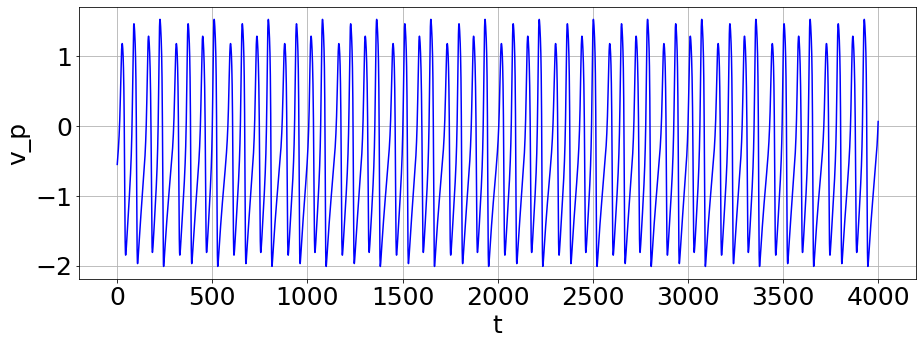

T = 8.894945346150193
s_pb = 0.17


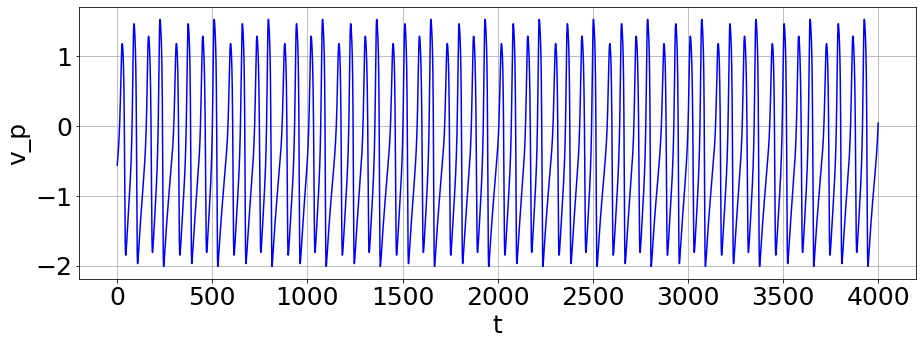

T = 8.895288250751047
s_pb = 0.18


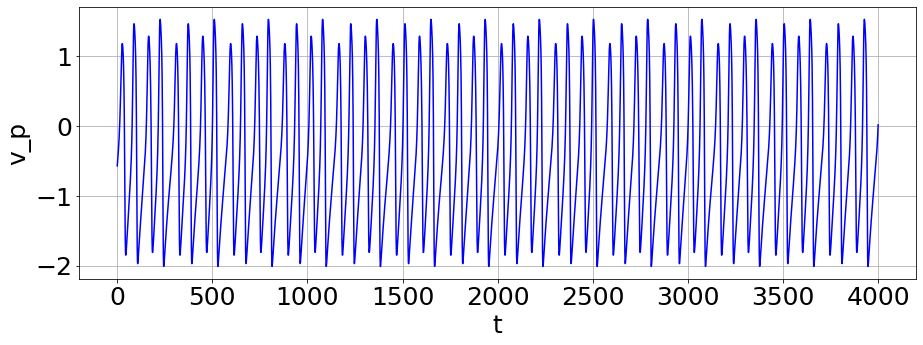

T = 8.894945346150193
s_pb = 0.19


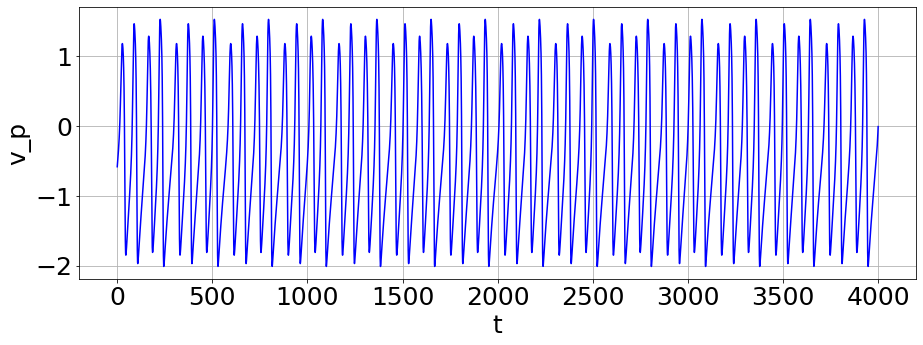

T = 8.894945346150193
s_pb = 0.2


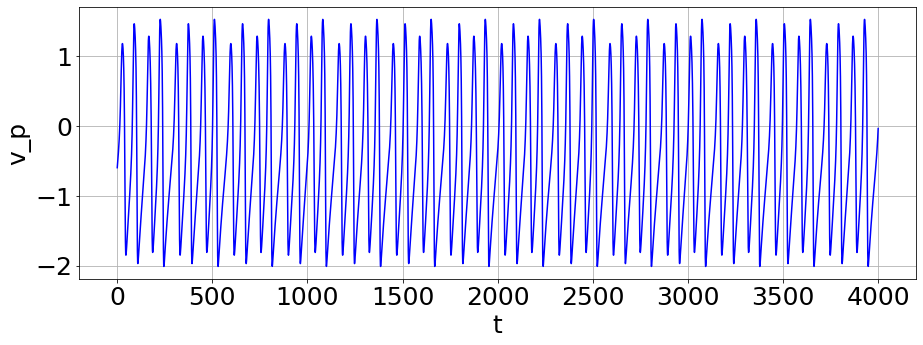

T = 8.888558508500768
s_pb = 0.21


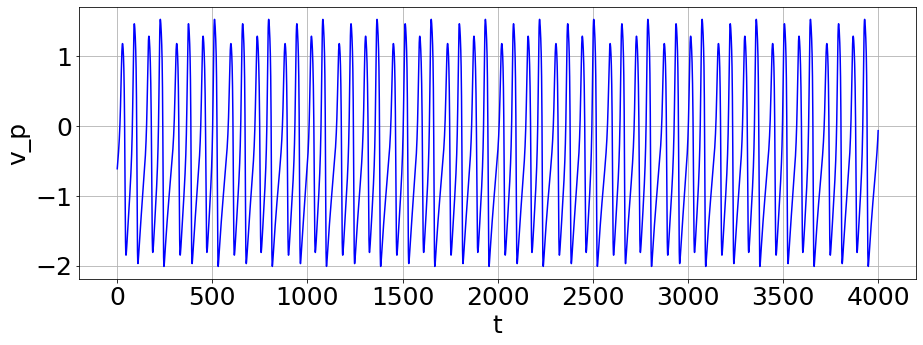

T = 8.888558508500768
s_pb = 0.22


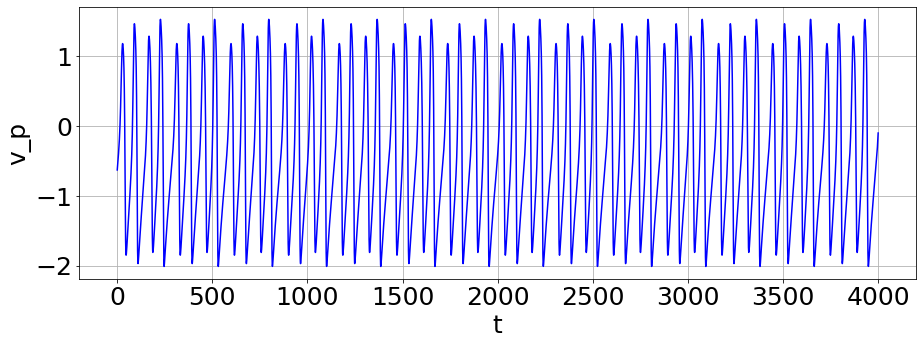

T = 8.888899497433462
s_pb = 0.23


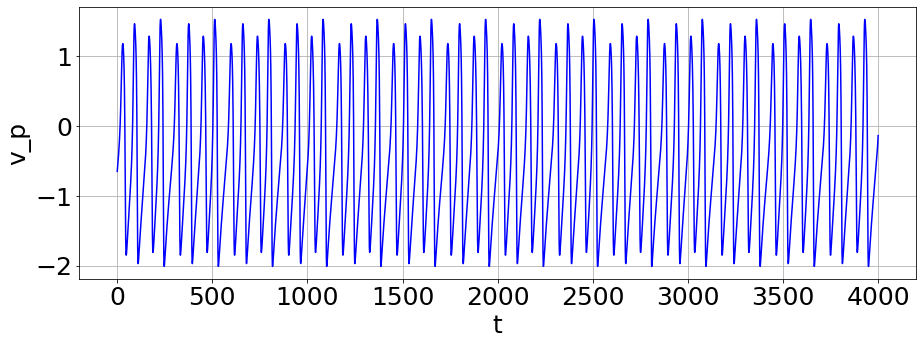

T = 8.888558508500768
s_pb = 0.24


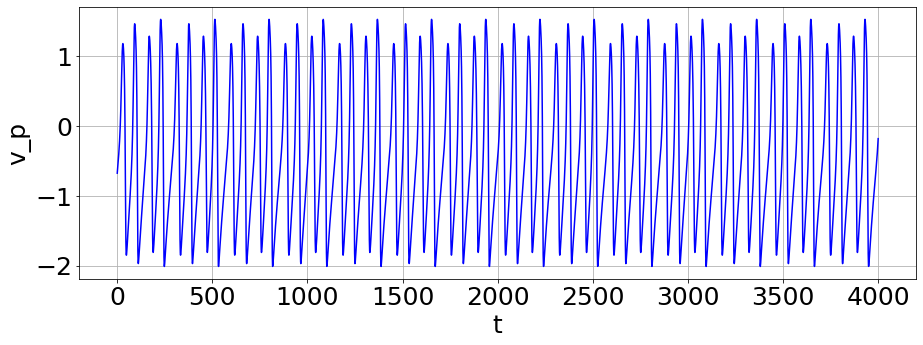

T = 8.888558508500768
s_pb = 0.25


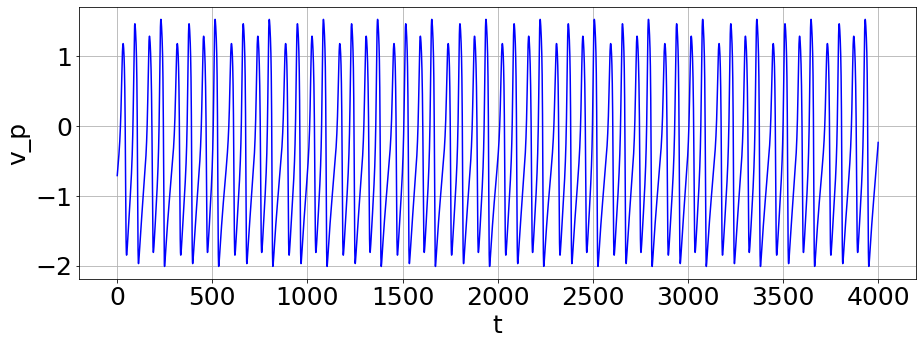

T = 8.888558508500768
s_pb = 0.26


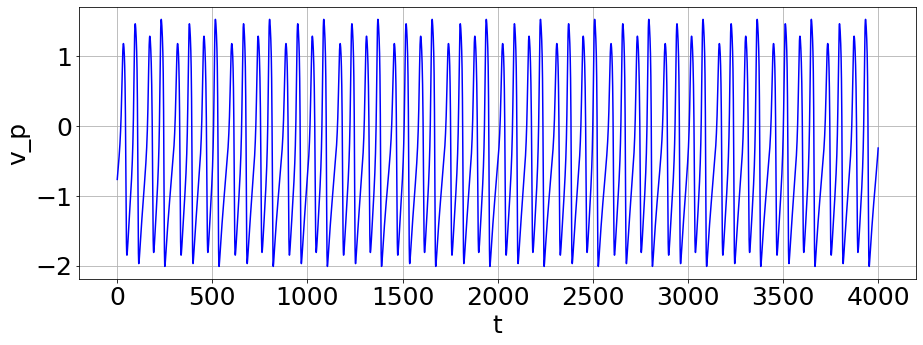

T = 8.888899497433462
s_pb = 0.27


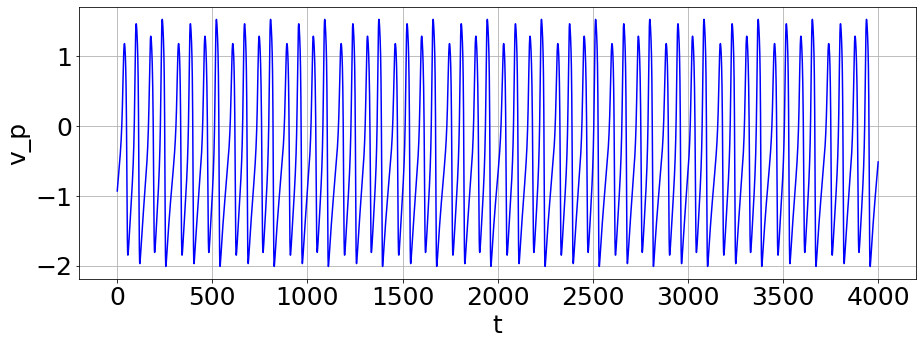

T = 8.895378287154623
s_pb = 0.28


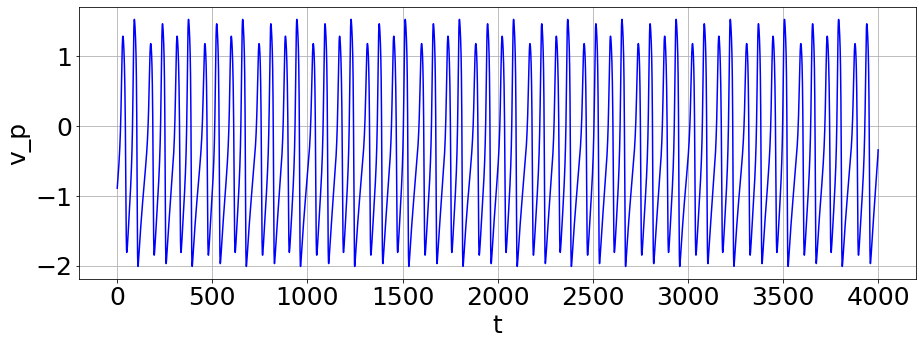

T = 8.895037298221931
s_pb = 0.29


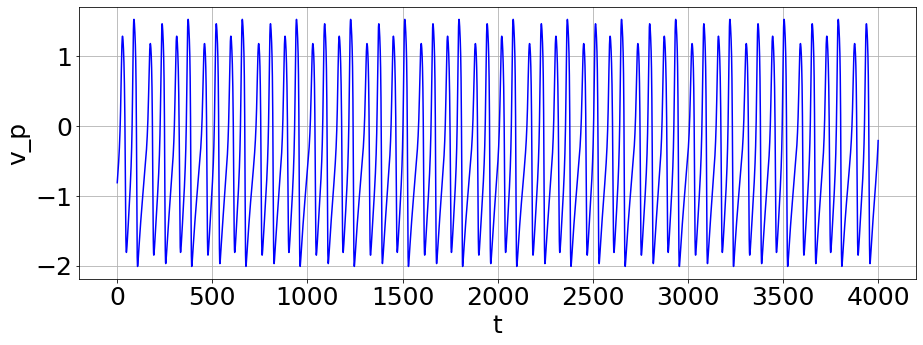

T = 8.902832151969832
s_pb = 0.3


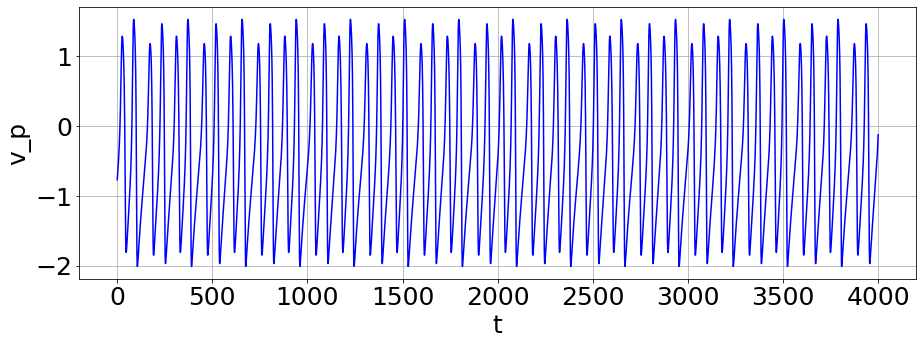

T = 8.902832151969832
s_pb = 0.31


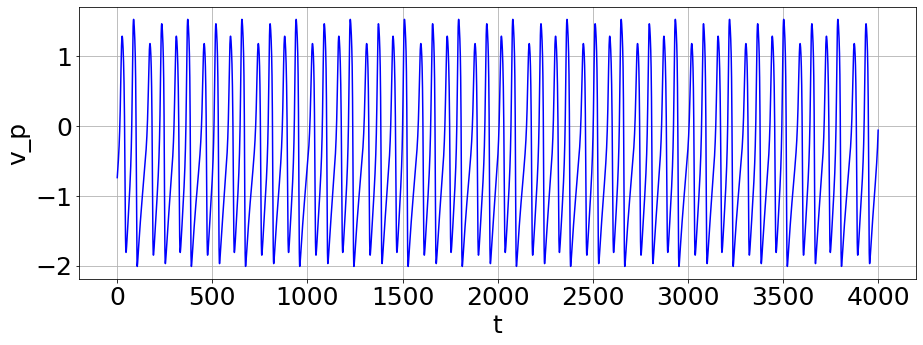

T = 8.902832151969832
s_pb = 0.32


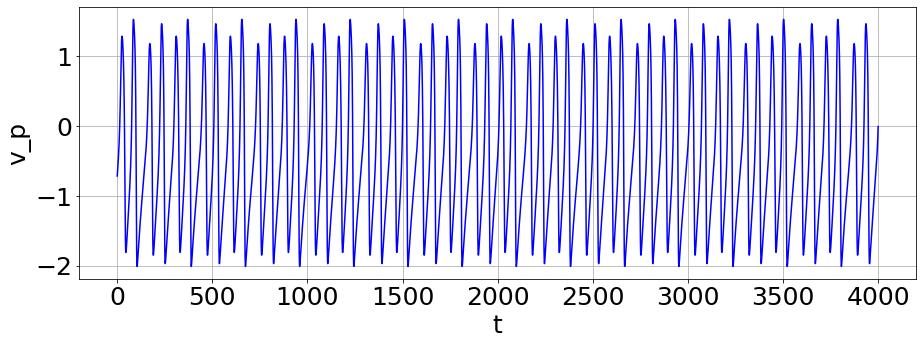

T = 8.902832151969832
s_pb = 0.33


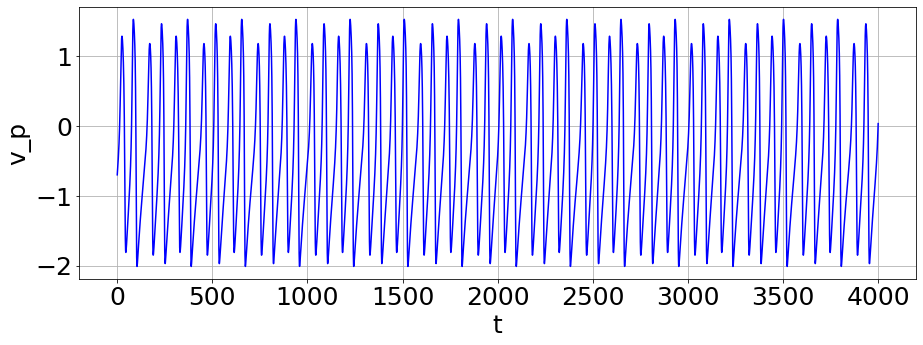

T = 8.903175056570687
s_pb = 0.34


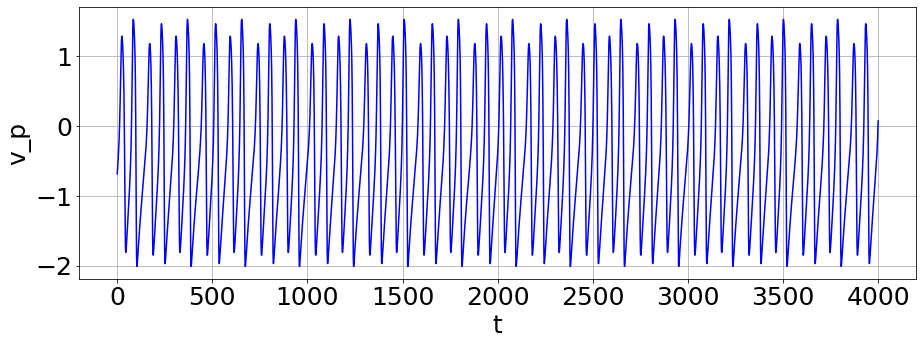

T = 8.903175056570687
s_pb = 0.35000000000000003


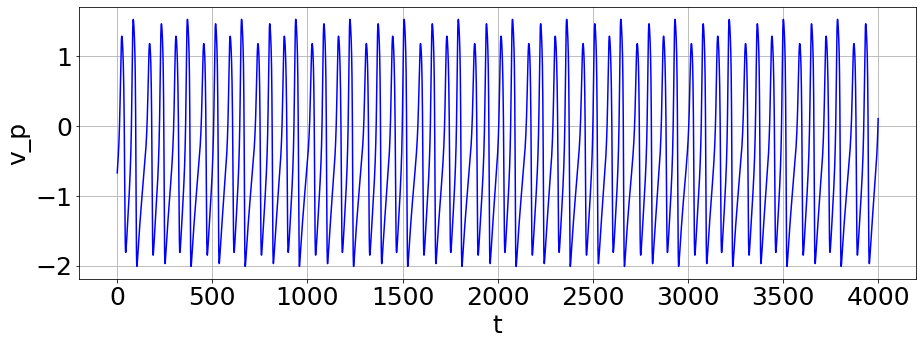

T = 8.902832151969832
s_pb = 0.36


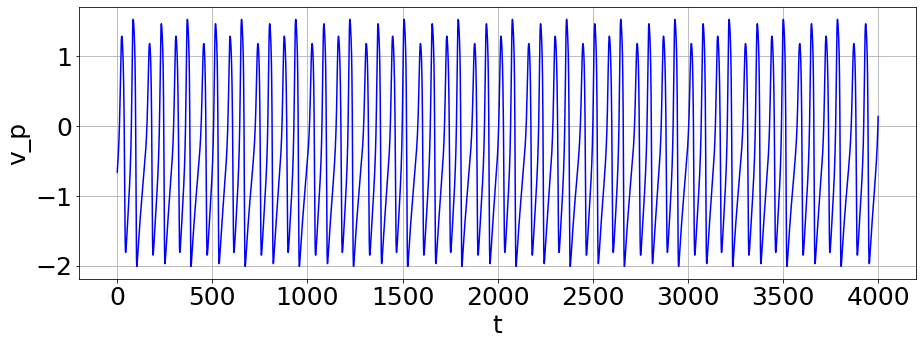

T = 8.903175056570687
s_pb = 0.37


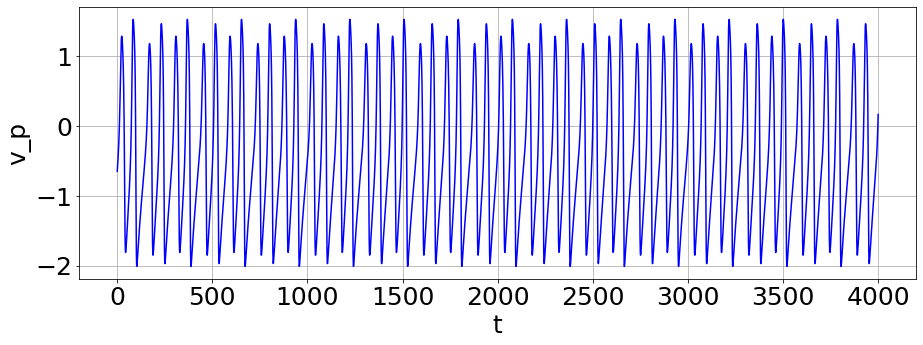

T = 8.902832151969832
s_pb = 0.38


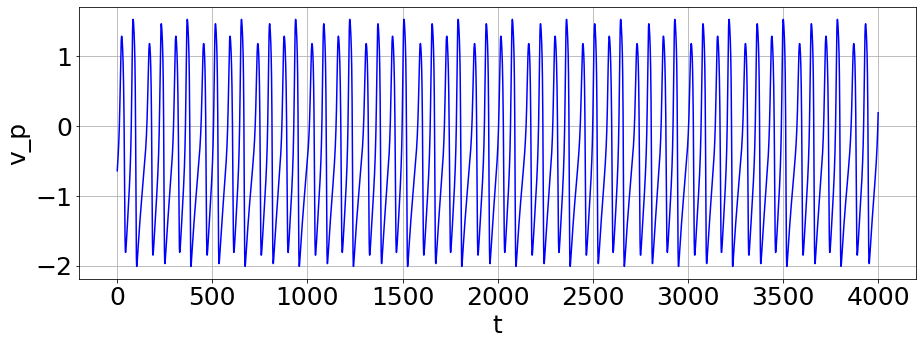

T = 8.903175056570687
s_pb = 0.39


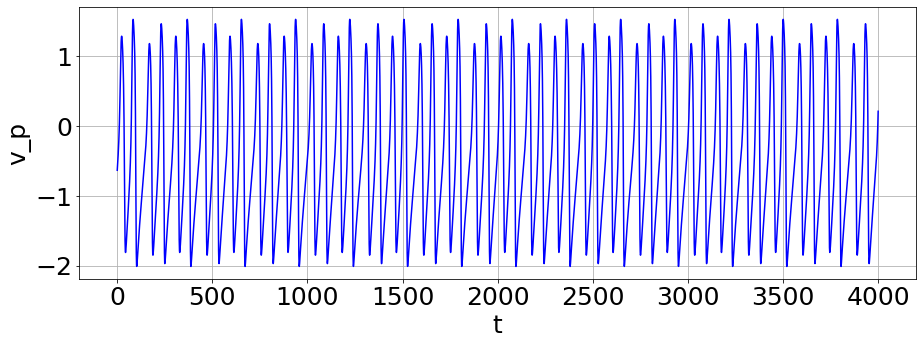

T = 8.903175056570687
s_pb = 0.4


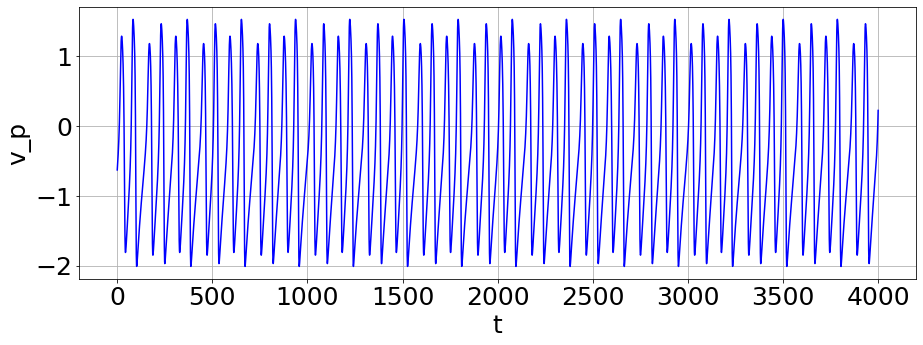

T = 8.903175056570687
s_pb = 0.41000000000000003


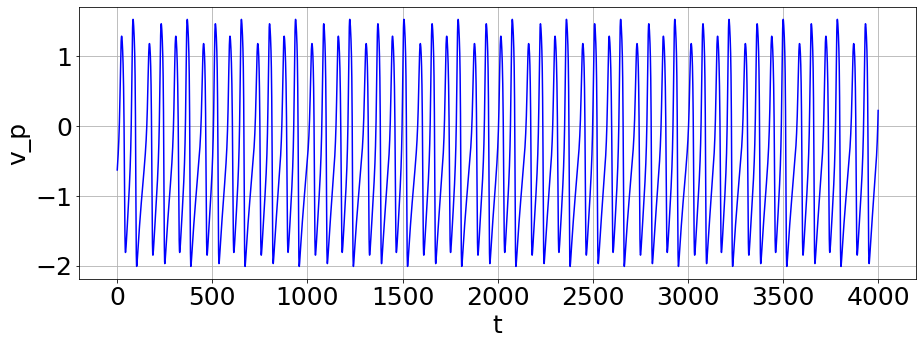

T = 8.902832151969832
s_pb = 0.42


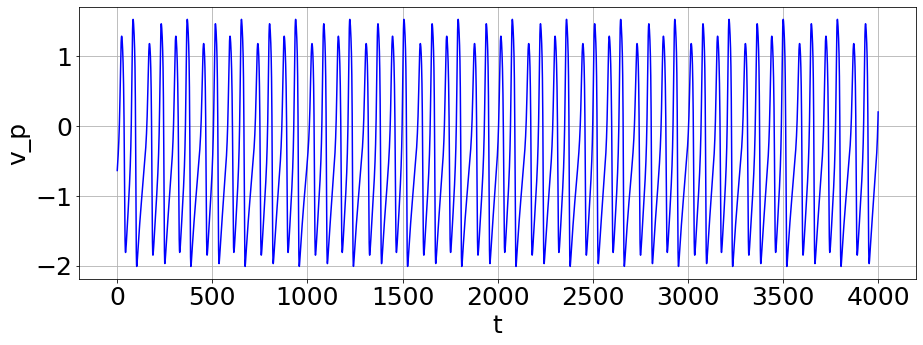

T = 8.902832151969832
s_pb = 0.43


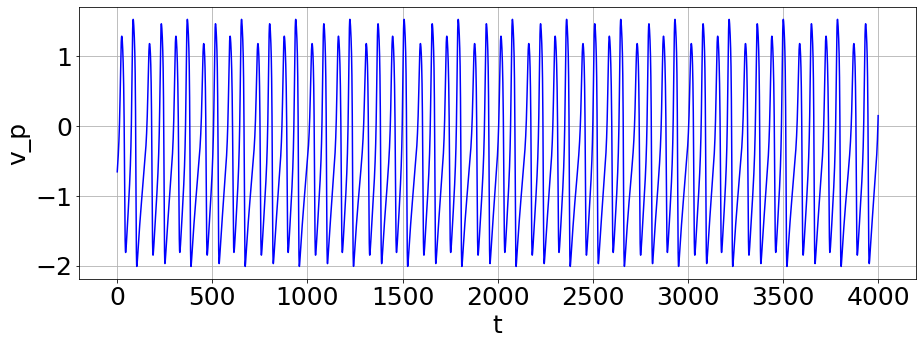

T = 8.902832151969832
s_pb = 0.44


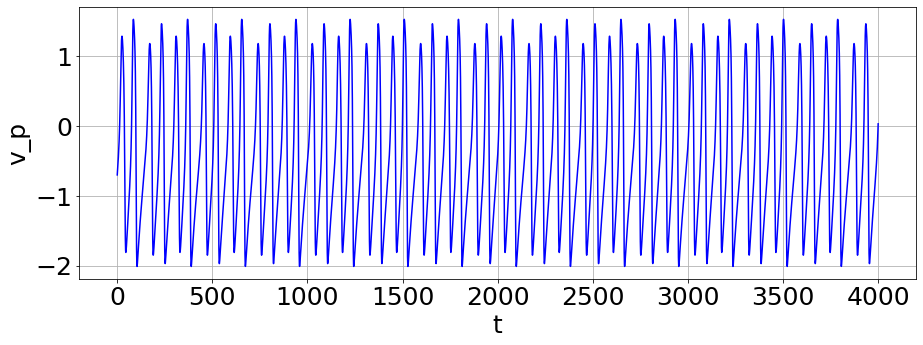

T = 8.895037298221931
s_pb = 0.45


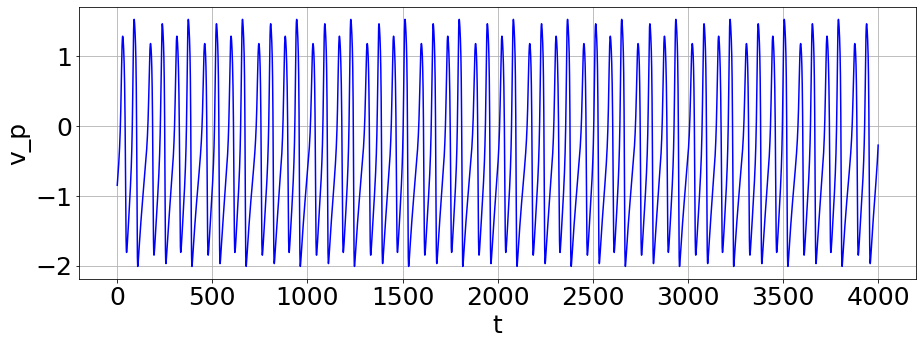

T = 8.888558508500768
s_pb = 0.46


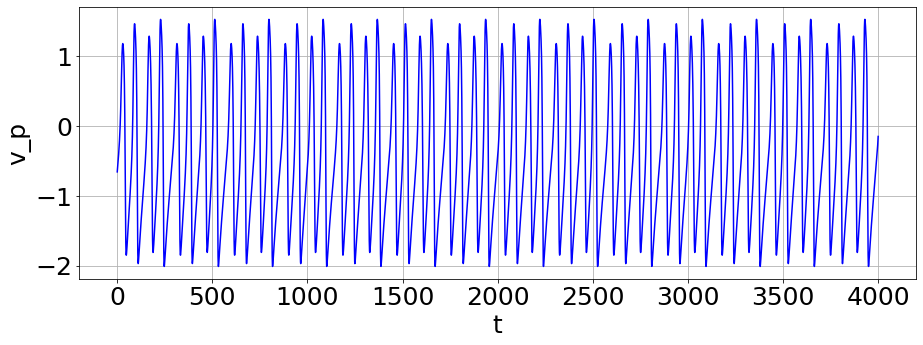

T = 8.895288250751047
s_pb = 0.47000000000000003


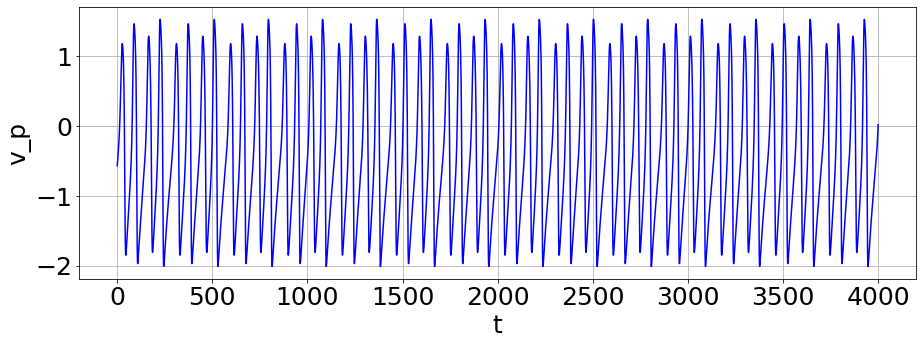

T = 8.895288250751047
s_pb = 0.48


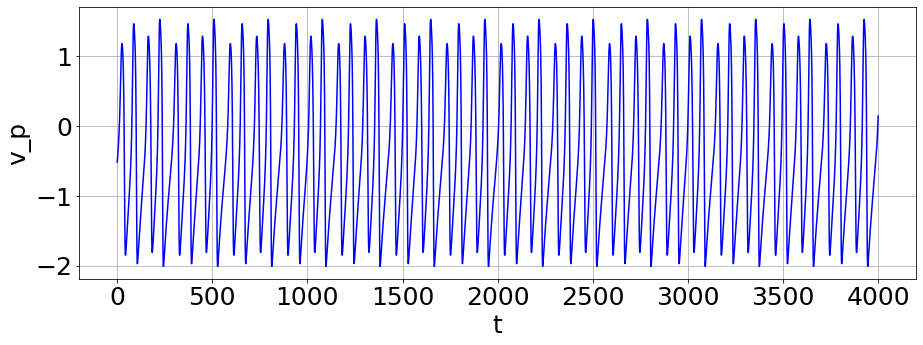

T = 8.894945346150193
s_pb = 0.49


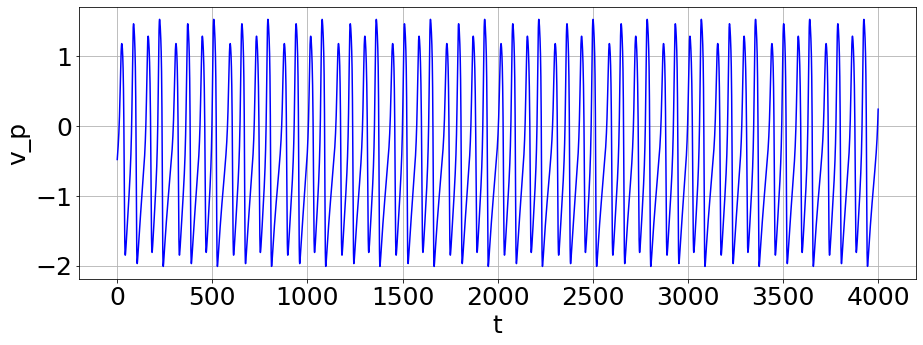

T = 8.895288250751047
s_pb = 0.5


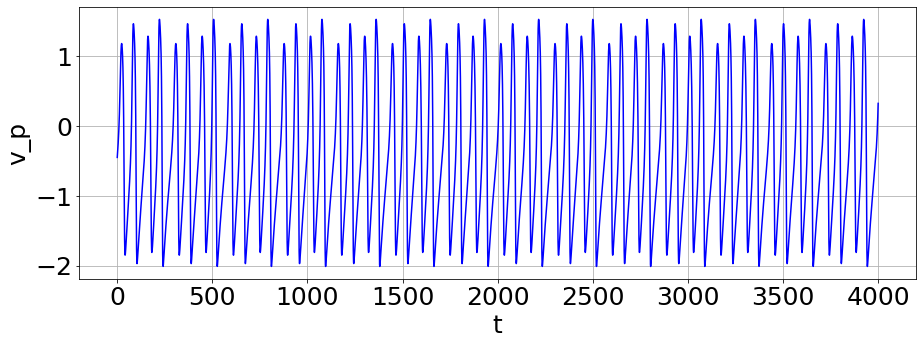

T = 8.894945346150193
s_pb = 0.51


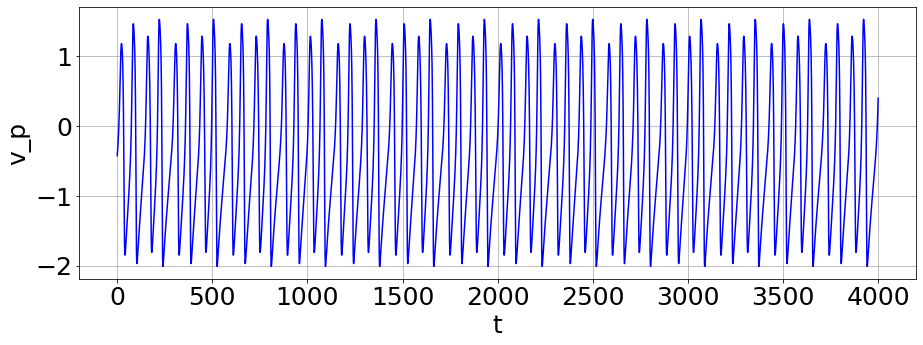

T = 8.894945346150193
s_pb = 0.52


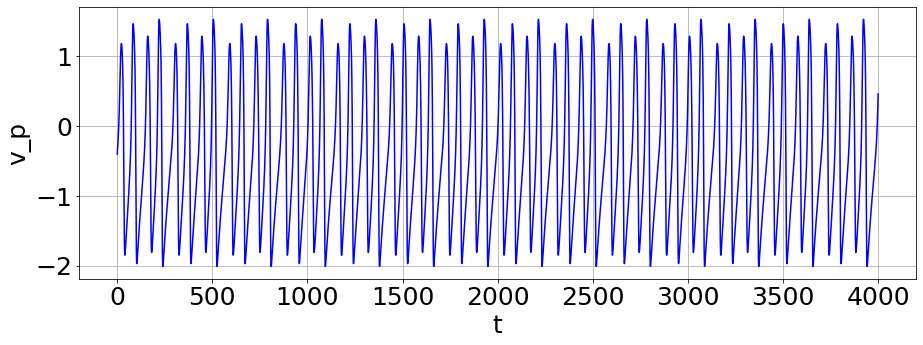

T = 8.894945346150193
s_pb = 0.53


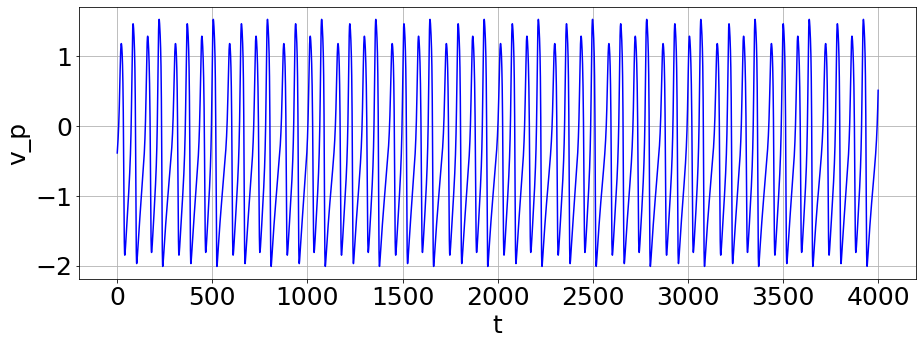

T = 8.894945346150193
s_pb = 0.54


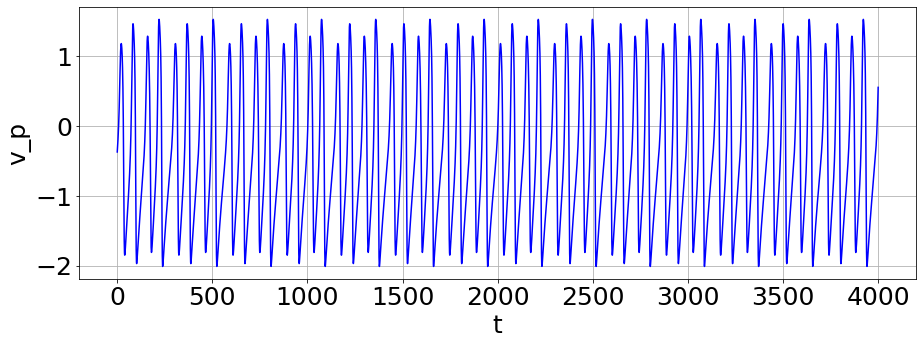

T = 8.895288250751047
s_pb = 0.55


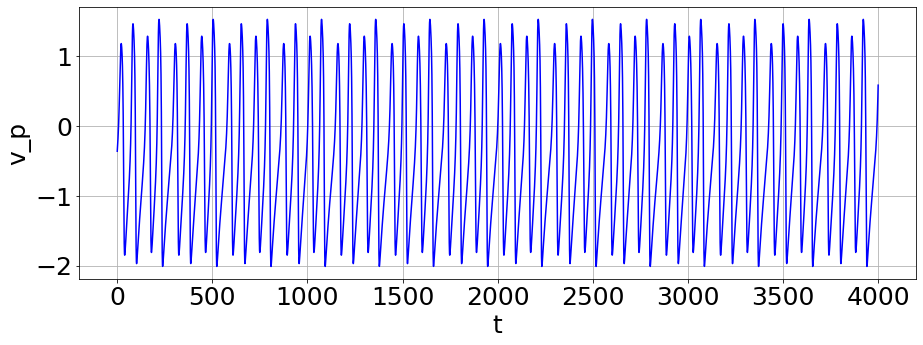

T = 8.895288250751047
s_pb = 0.56


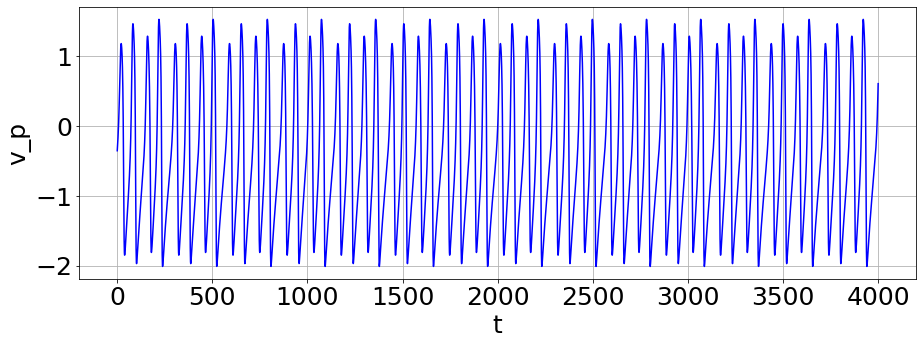

T = 8.894945346150193
s_pb = 0.5700000000000001


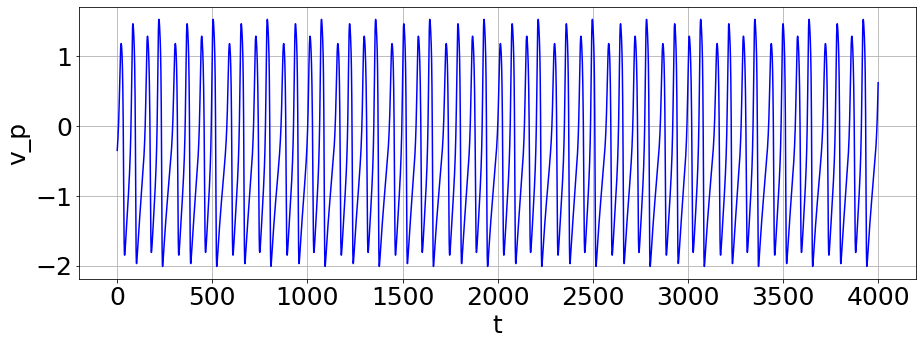

T = 8.894945346150193
s_pb = 0.58


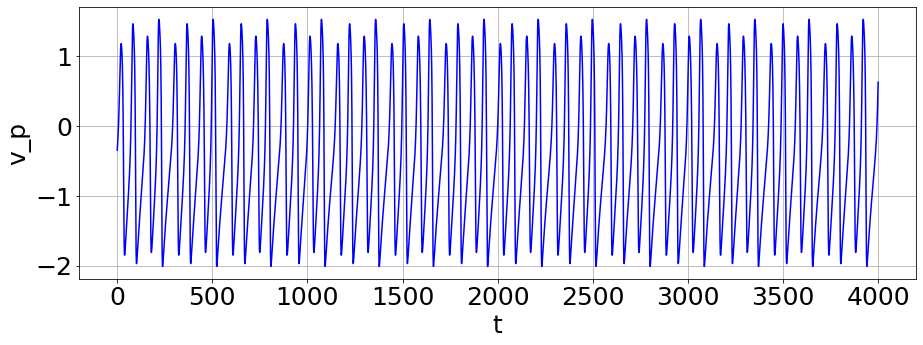

T = 8.894945346150193
s_pb = 0.59


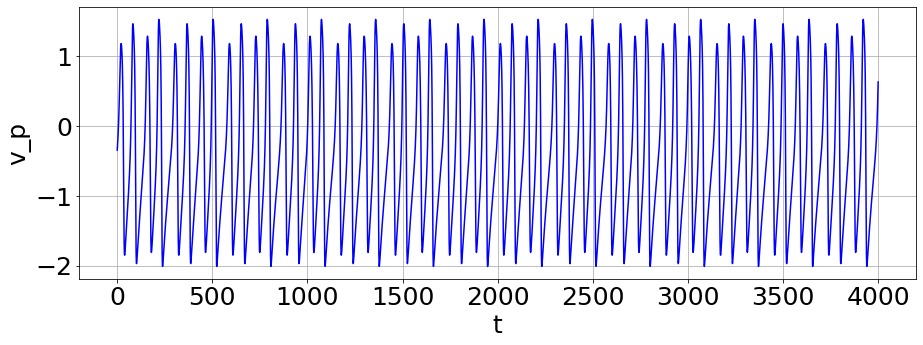

T = 8.894945346150193
s_pb = 0.6


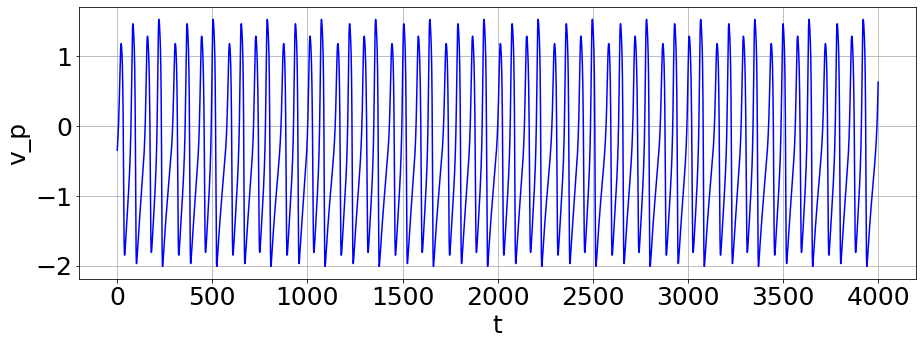

T = 8.894945346150193
s_pb = 0.61


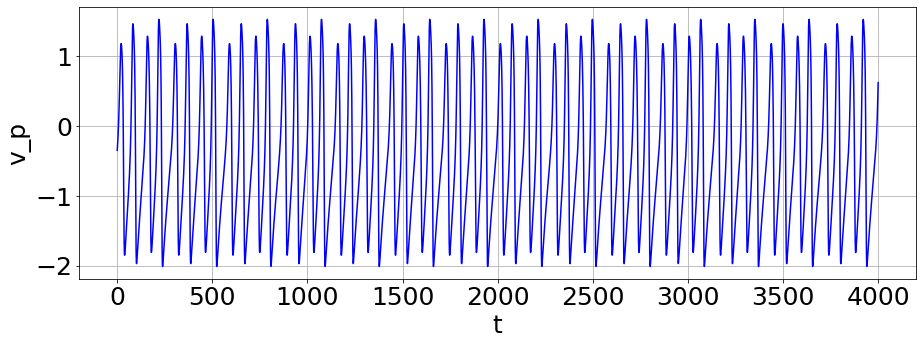

T = 8.895288250751047
s_pb = 0.62


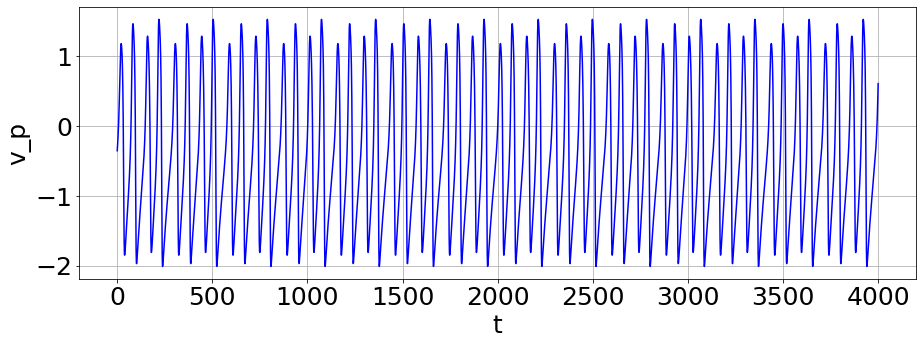

T = 8.895288250751047
s_pb = 0.63


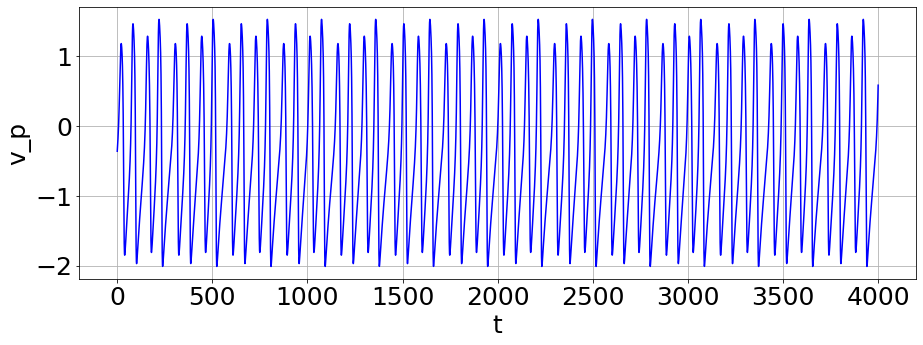

T = 8.894945346150193
s_pb = 0.64


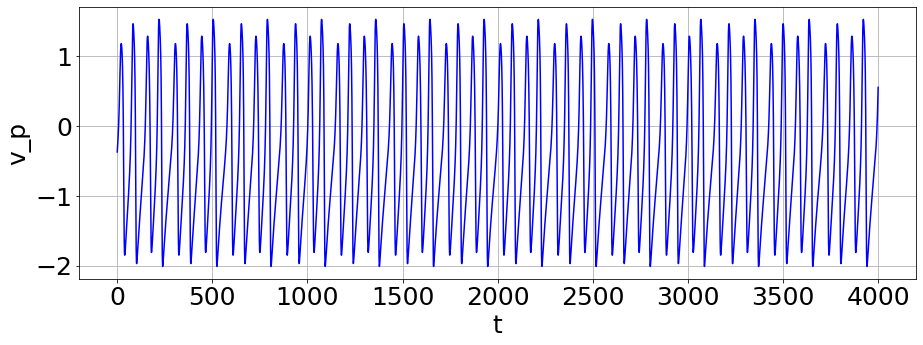

T = 8.894945346150193
s_pb = 0.65


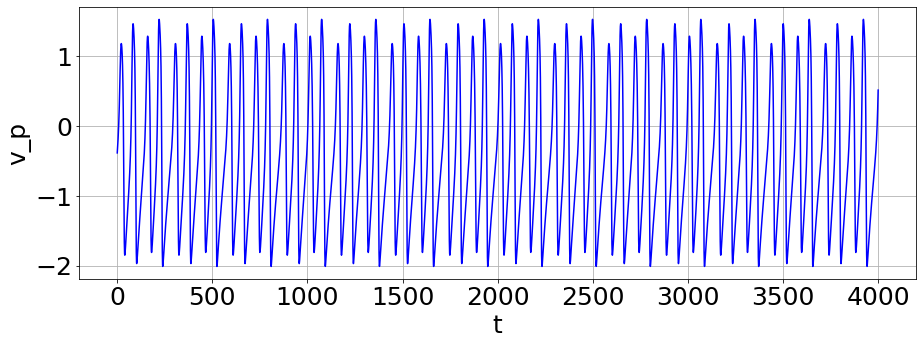

T = 8.895288250751047
s_pb = 0.66


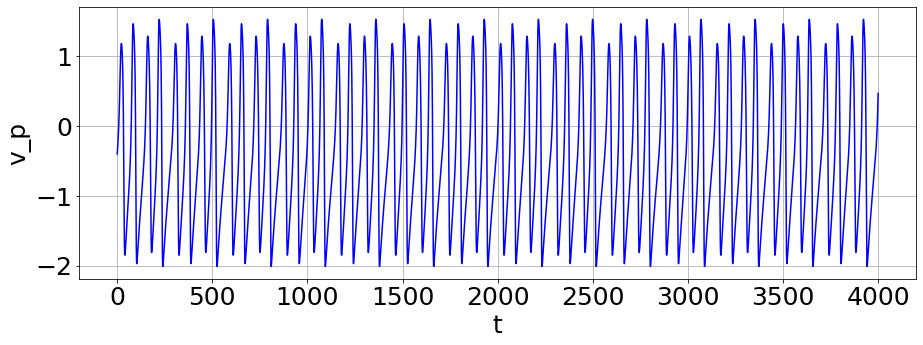

T = 8.895288250751047
s_pb = 0.67


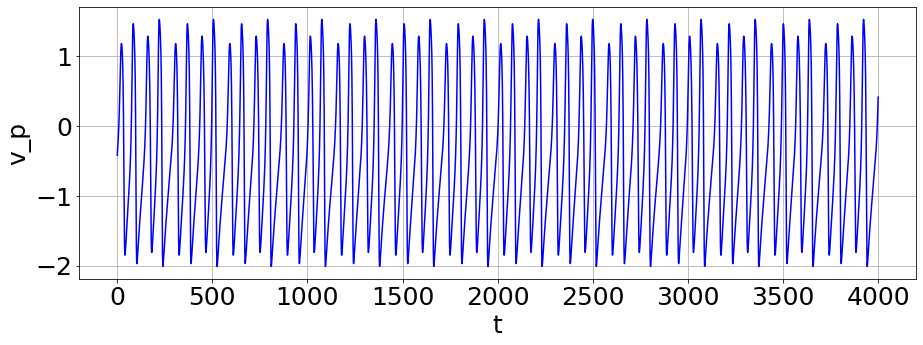

T = 8.895288250751047
s_pb = 0.68


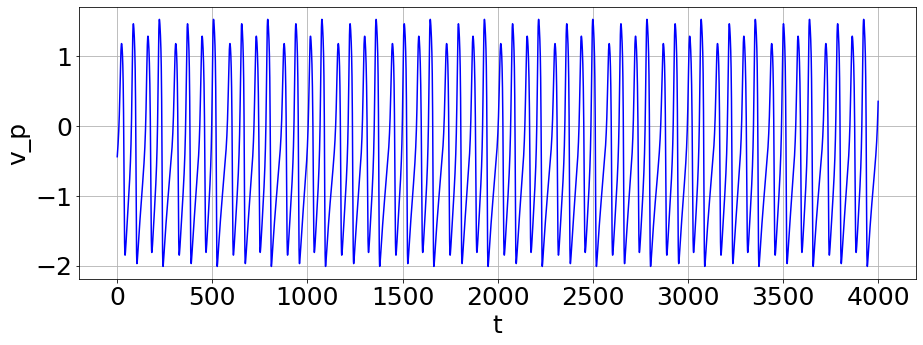

T = 8.894945346150193
s_pb = 0.6900000000000001


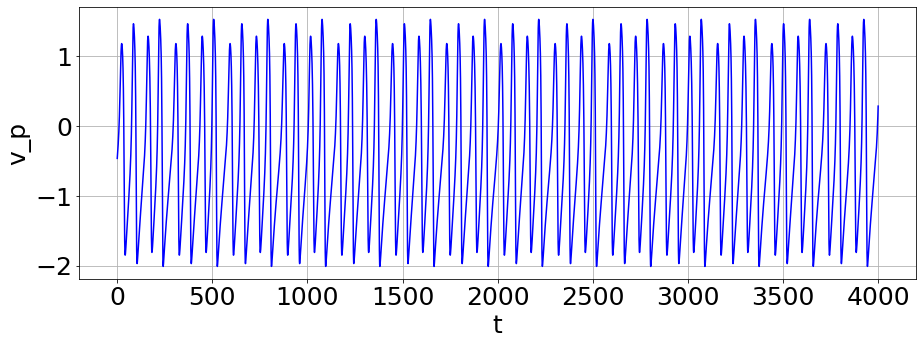

T = 8.894945346150193
s_pb = 0.7000000000000001


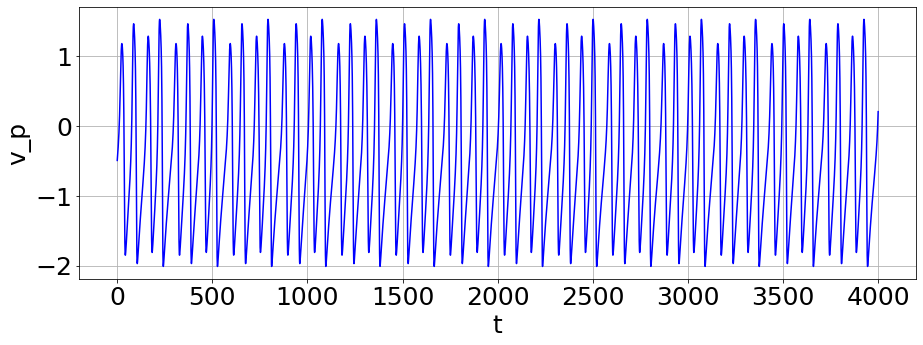

T = 8.894945346150193
s_pb = 0.71


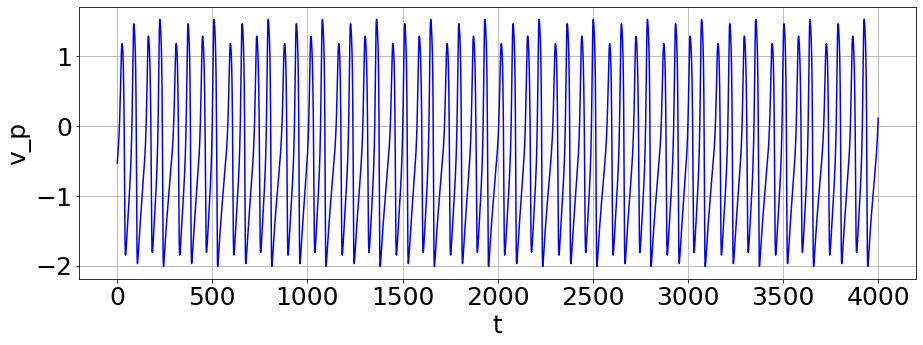

T = 8.894945346150193
s_pb = 0.72


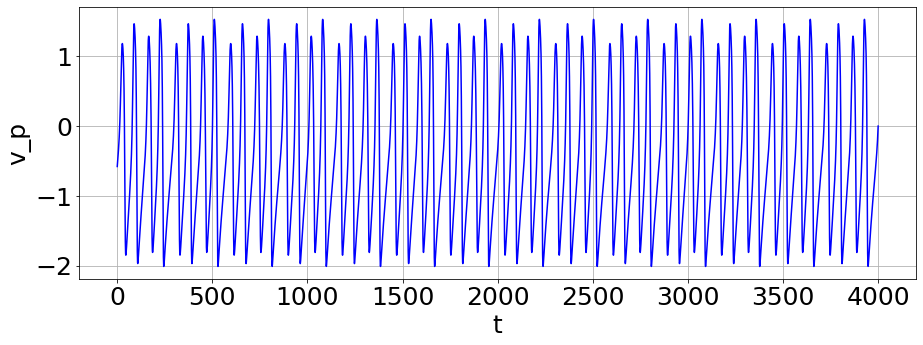

T = 8.888899497433462
s_pb = 0.73


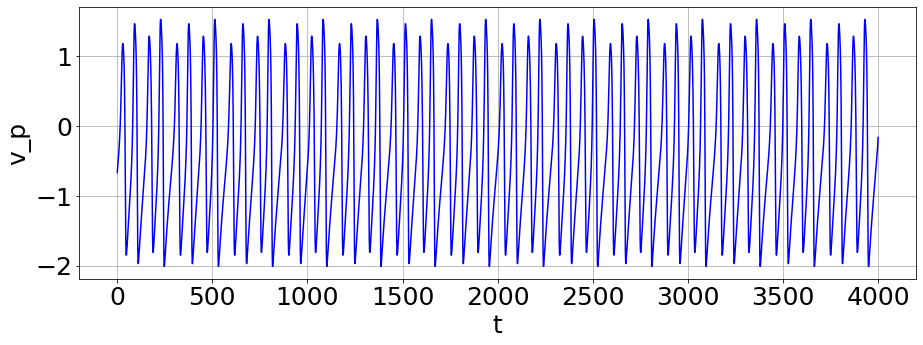

T = 8.895378287154623
s_pb = 0.74


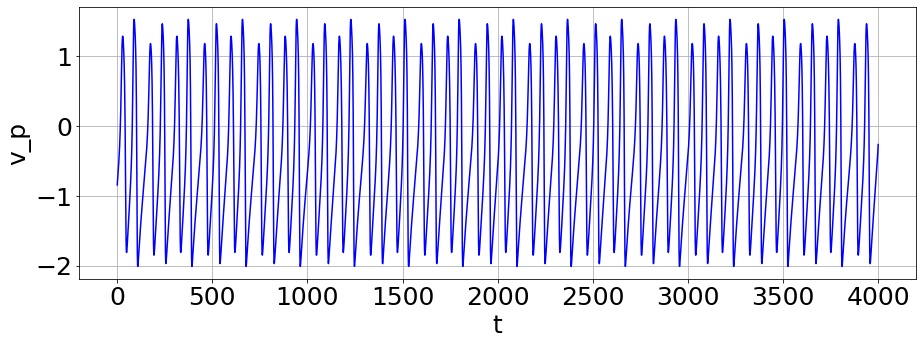

T = 8.902832151969832
s_pb = 0.75


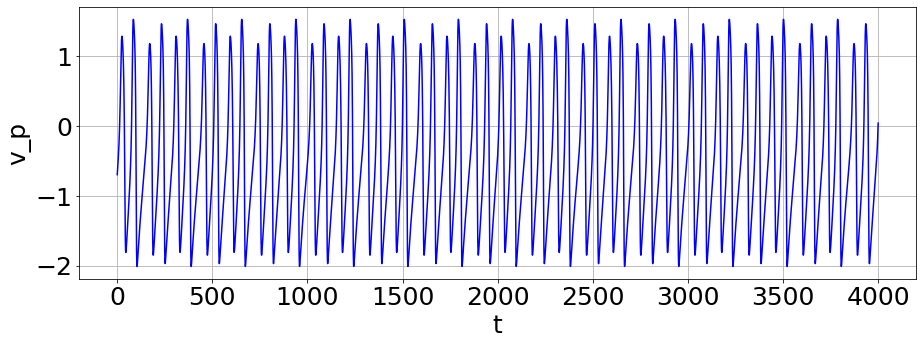

T = 8.903175056570687
s_pb = 0.76


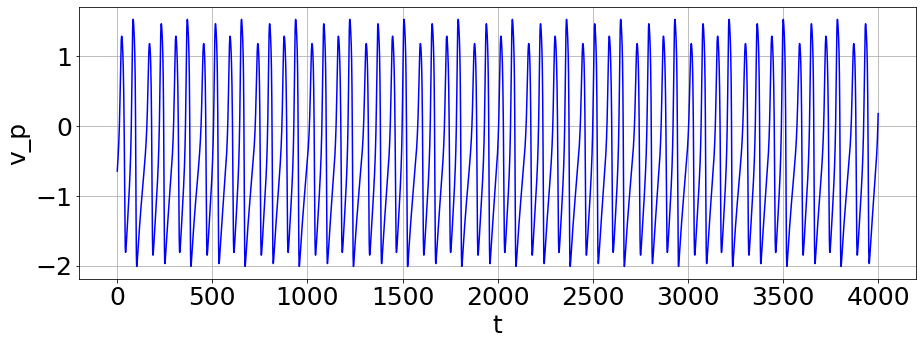

T = 8.902832151969832
s_pb = 0.77


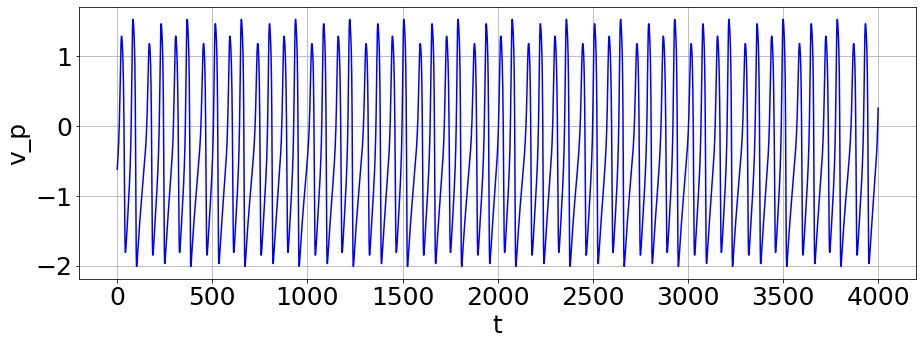

T = 8.902832151969832
s_pb = 0.78


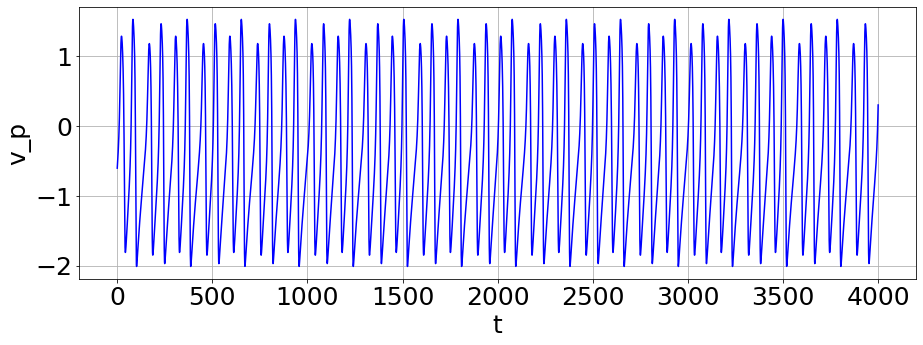

T = 8.902832151969832
s_pb = 0.79


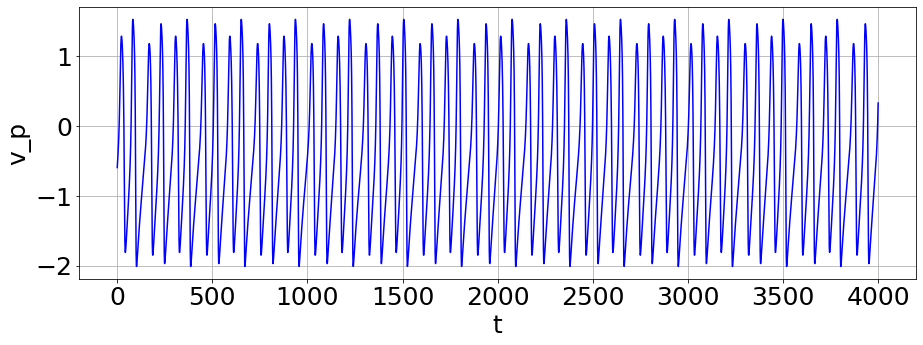

T = 8.903175056570687
s_pb = 0.8


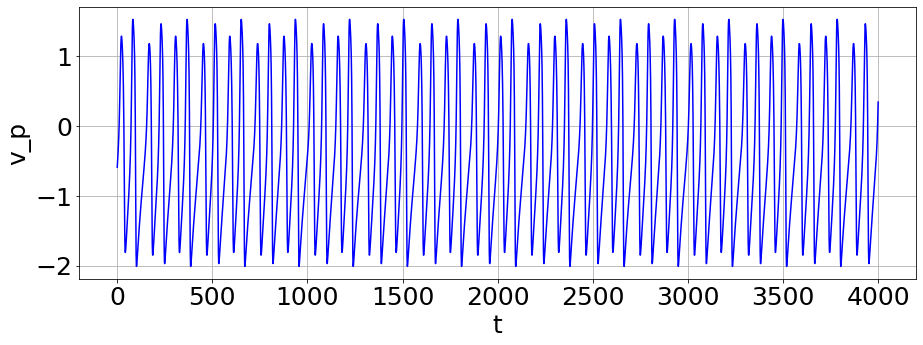

T = 8.903175056570687
s_pb = 0.81


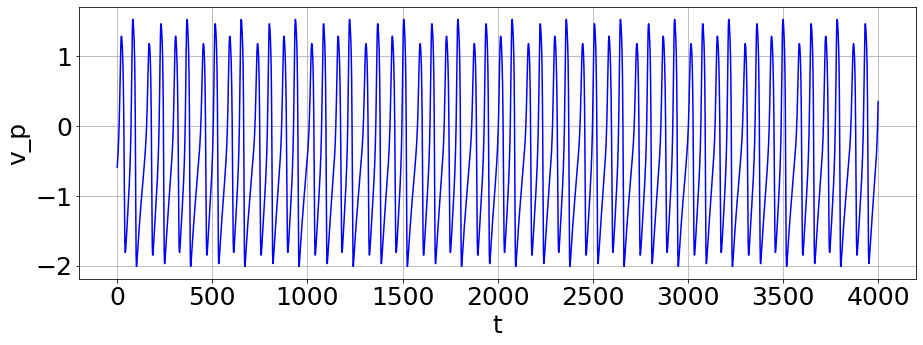

T = 8.903175056570687
s_pb = 0.8200000000000001


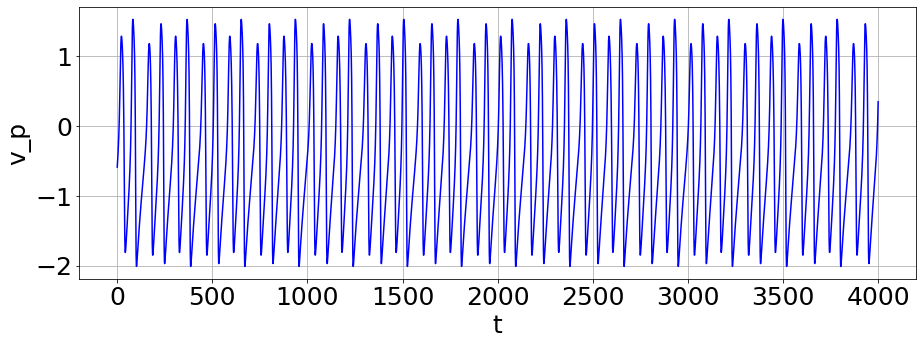

T = 8.903175056570687
s_pb = 0.8300000000000001


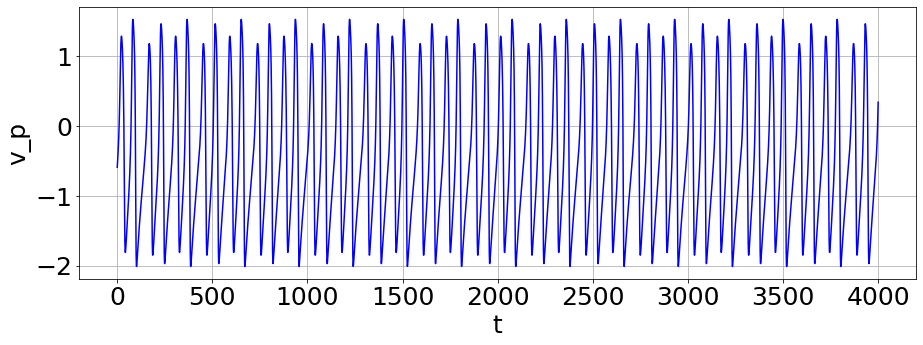

T = 8.902832151969832
s_pb = 0.84


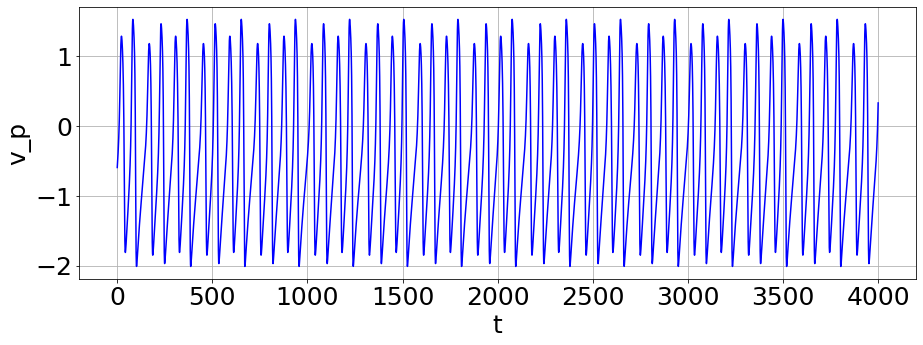

T = 8.902832151969832
s_pb = 0.85


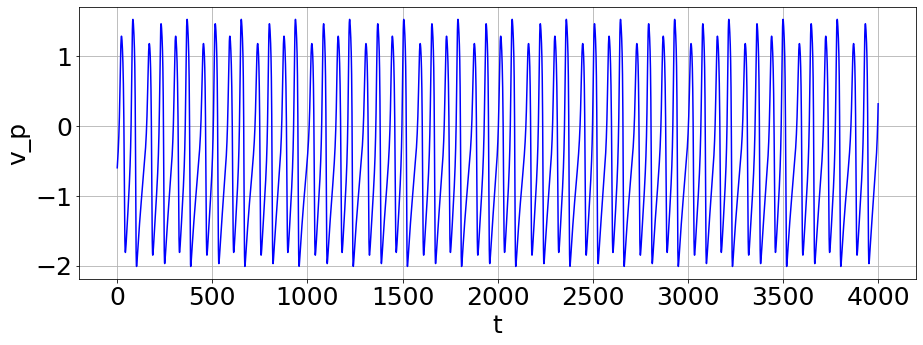

T = 8.902832151969832
s_pb = 0.86


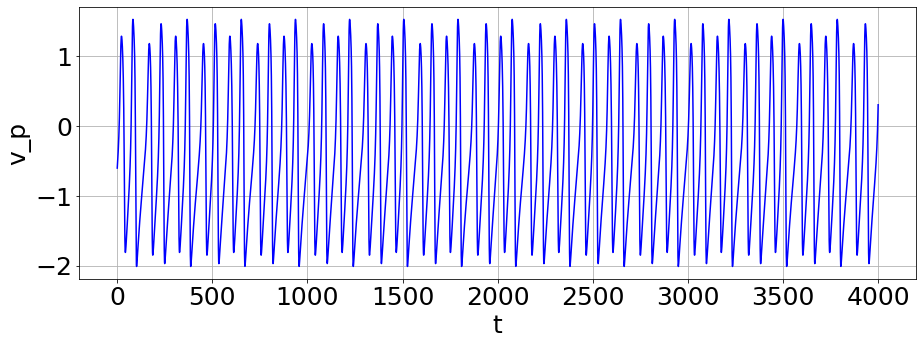

T = 8.903175056570687
s_pb = 0.87


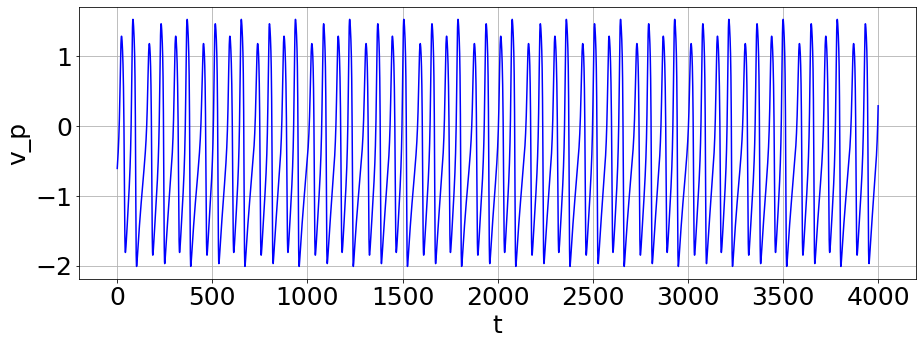

T = 8.903175056570687
s_pb = 0.88


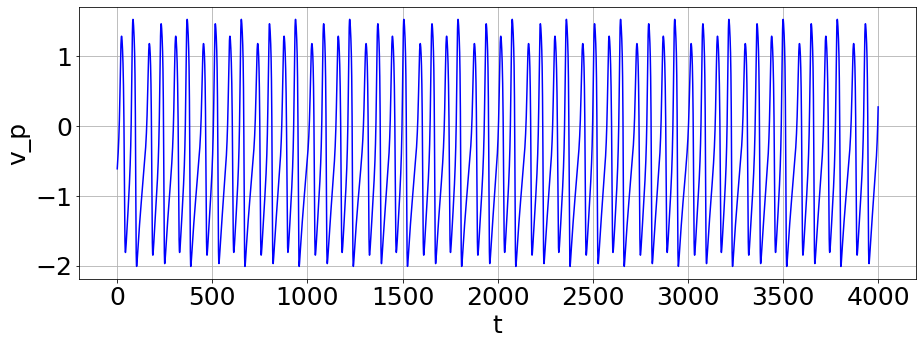

T = 8.902832151969832
s_pb = 0.89


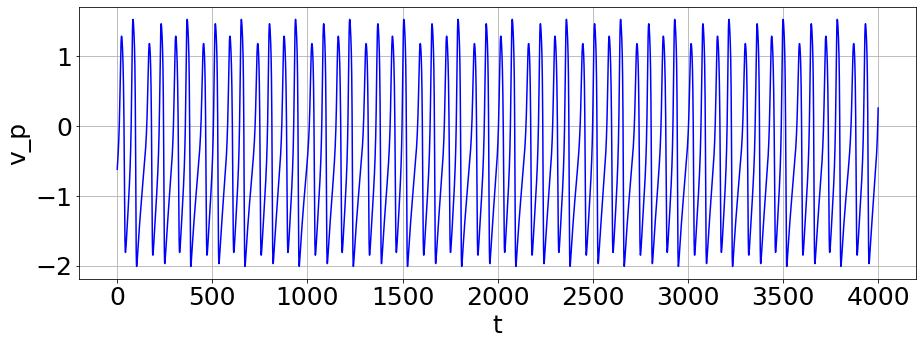

T = 8.903175056570687
s_pb = 0.9


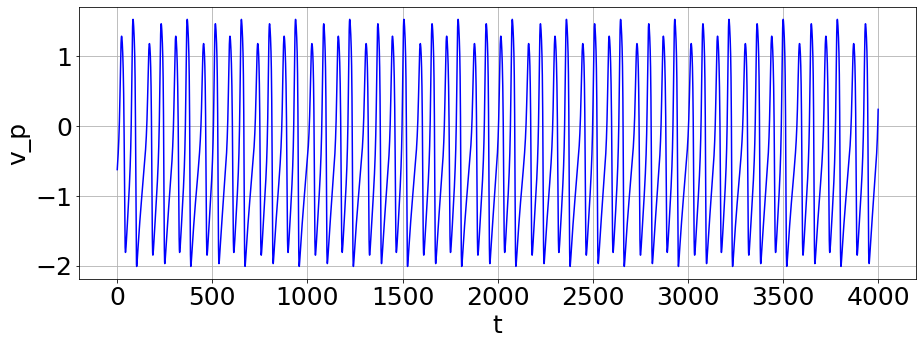

T = 8.903175056570687
s_pb = 0.91


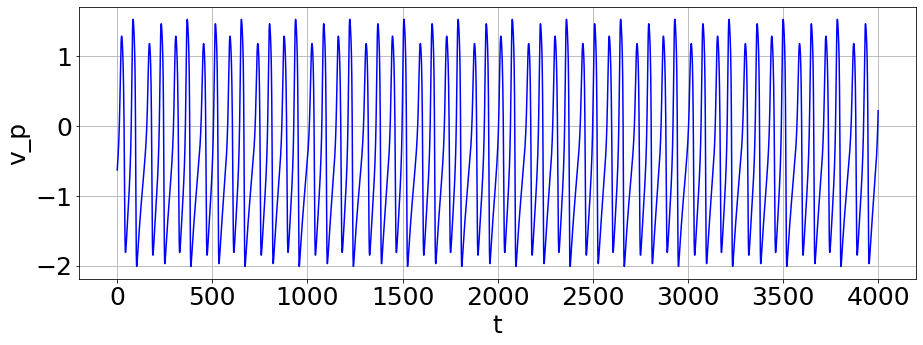

T = 8.902832151969832
s_pb = 0.92


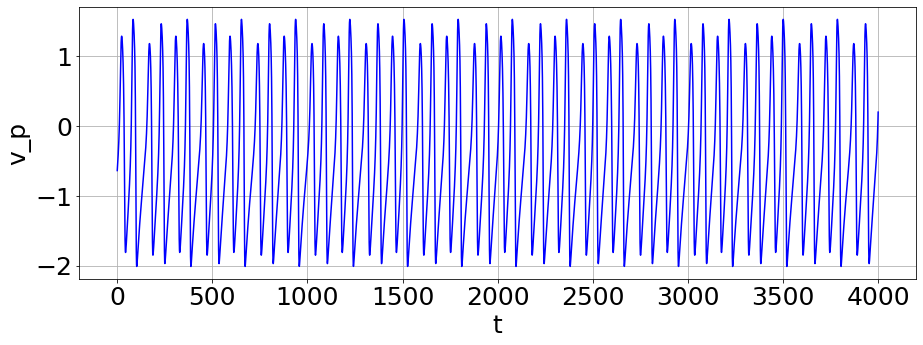

T = 8.903175056570687
s_pb = 0.93


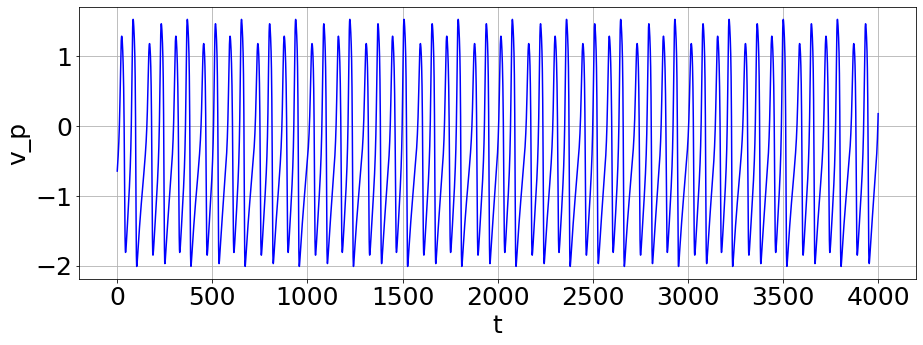

T = 8.903175056570687
s_pb = 0.9400000000000001


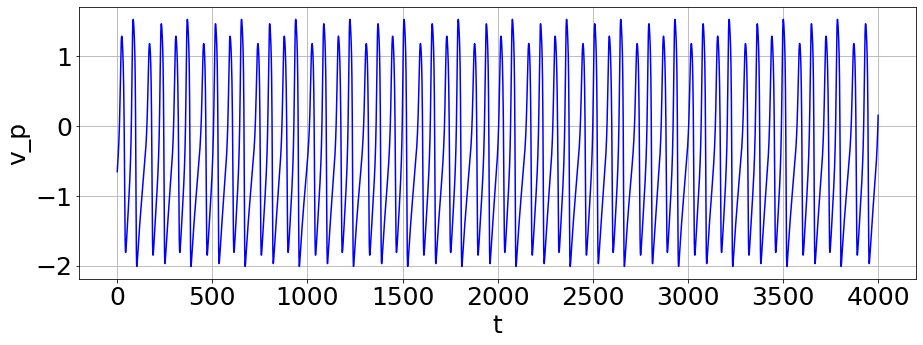

T = 8.903175056570687
s_pb = 0.9500000000000001


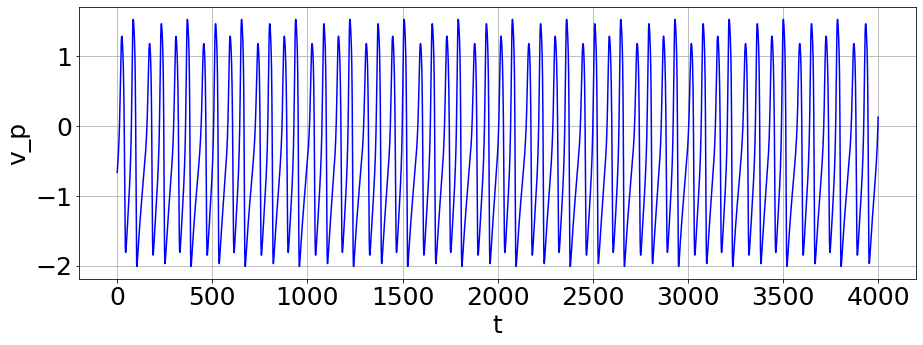

T = 8.902832151969832
s_pb = 0.96


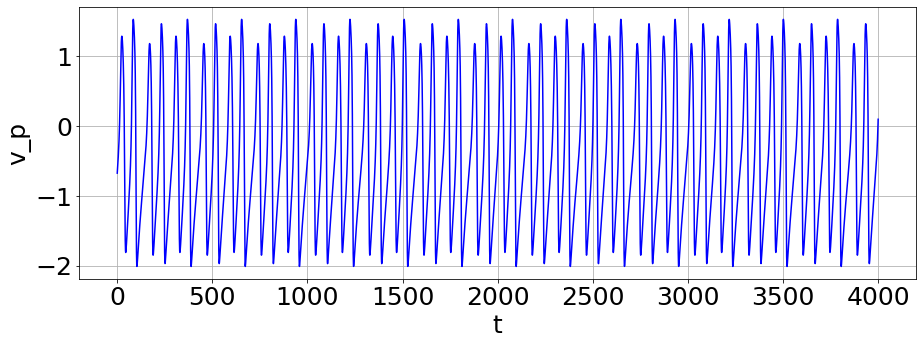

T = 8.903175056570687
s_pb = 0.97


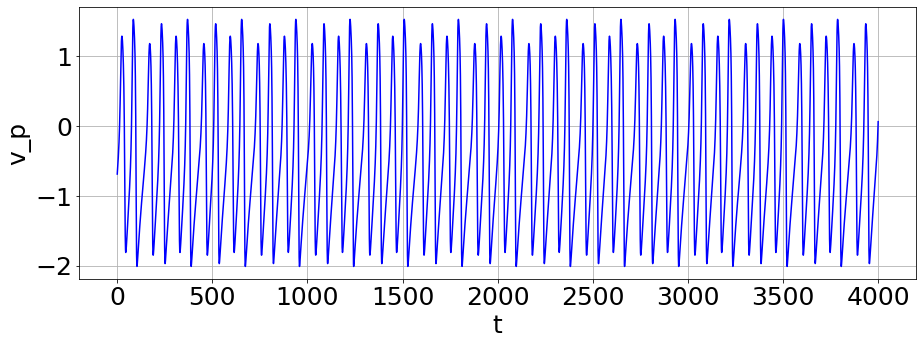

T = 8.903175056570687
s_pb = 0.98


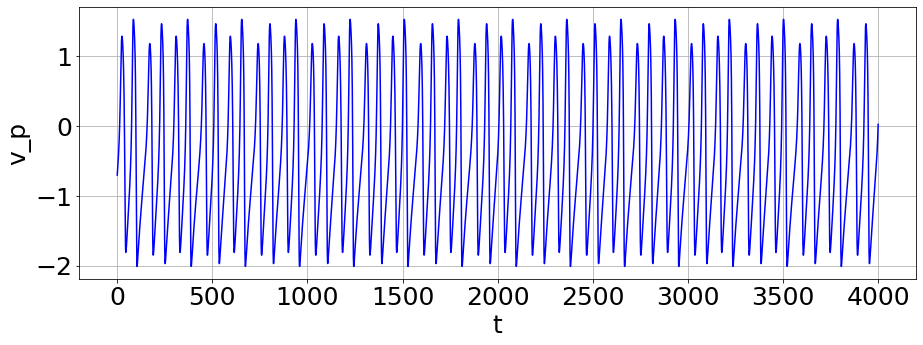

T = 8.902832151969832
s_pb = 0.99


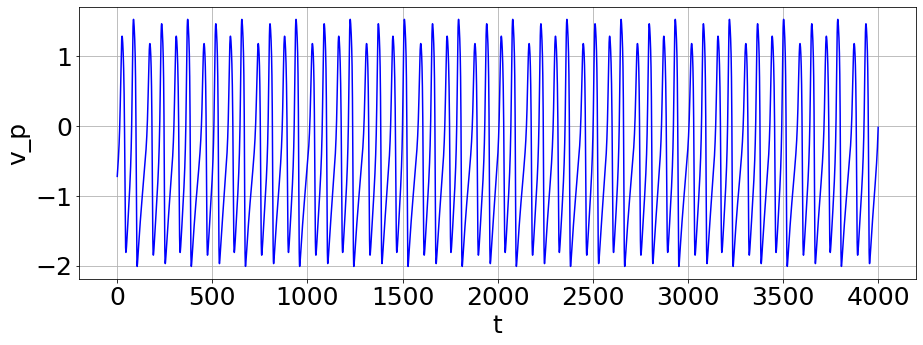

[8.895288250751047,
 8.895288250751047,
 8.895288250751047,
 8.895288250751047,
 8.894945346150193,
 8.894945346150193,
 8.895288250751047,
 8.894945346150193,
 8.895288250751047,
 8.895288250751047,
 8.894945346150193,
 8.895288250751047,
 8.894945346150193,
 8.895288250751047,
 8.894945346150193,
 8.895288250751047,
 8.894945346150193,
 8.894945346150193,
 8.895288250751047,
 8.894945346150193,
 8.894945346150193,
 8.888558508500768,
 8.888558508500768,
 8.888899497433462,
 8.888558508500768,
 8.888558508500768,
 8.888558508500768,
 8.888899497433462,
 8.895378287154623,
 8.895037298221931,
 8.902832151969832,
 8.902832151969832,
 8.902832151969832,
 8.902832151969832,
 8.903175056570687,
 8.903175056570687,
 8.902832151969832,
 8.903175056570687,
 8.902832151969832,
 8.903175056570687,
 8.903175056570687,
 8.903175056570687,
 8.902832151969832,
 8.902832151969832,
 8.902832151969832,
 8.895037298221931,
 8.888558508500768,
 8.895288250751047,
 8.895288250751047,
 8.894945346150193,


In [97]:
Bpb = 0.19 
Bbpmin = 0.09
Bbpmax = 0.09
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

parameters_for_Tvv(args1)

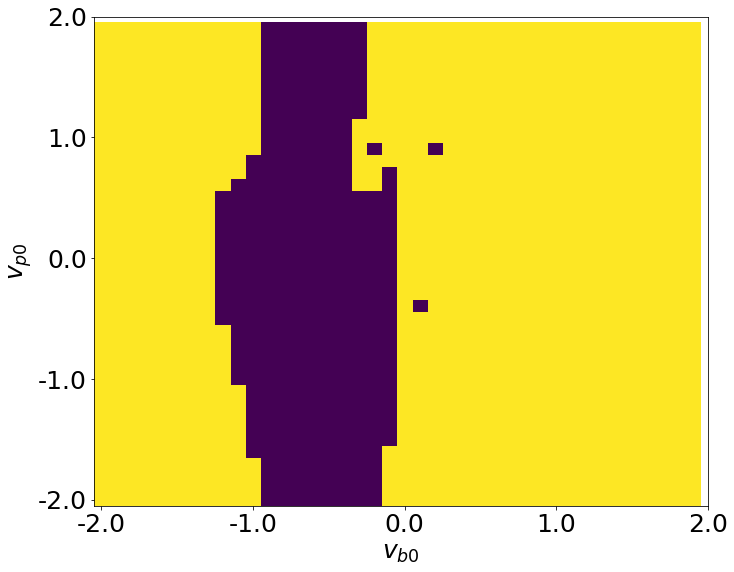

In [146]:
# Когда u = 0
# s = 0.4 и 0.5

fig, ax = plt.subplots(figsize=(11, 9))
# sb.heatmap(T)
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,40,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$v_{p0}$')

xticks = np.linspace(0,40,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$v_{b0}$')

# fig.colorbar(np.arange(0, 20, 1))
plt.show()

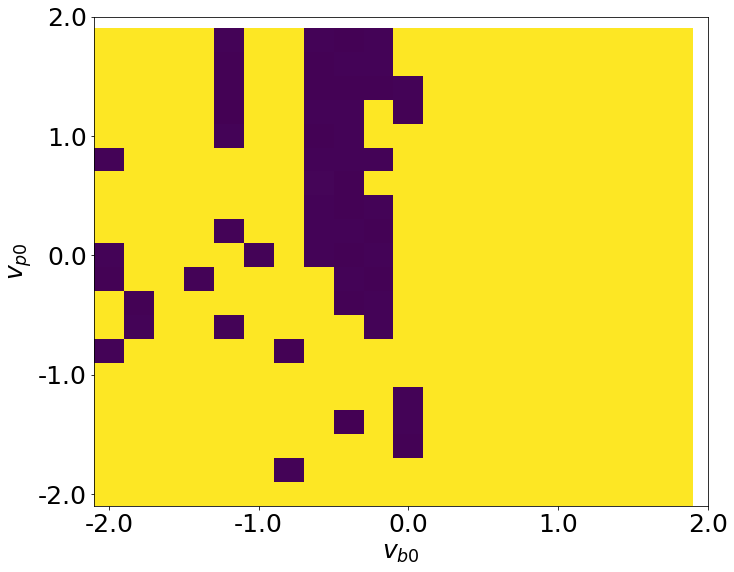

[ 9.02723638  9.09067921  9.1011427   9.10854732  9.11021106  9.11509402
  9.11927941  9.12381359  9.12819142  9.12959457  9.13218438  9.13836426
  9.13941662  9.14011819  9.14081977  9.14187213  9.14994024  9.15204497
  9.15239576  9.15414158  9.16116544  9.16472604  9.16537489  9.16649011
  9.16754856  9.17203985  9.17566331  9.17870482  9.17883864  9.18130835
  9.18377805  9.18448368  9.18589494  9.18607135  9.18730621  9.18765902
  9.18871747  9.19224562  9.19789066  9.20000755  9.20318289  9.20494696
  9.20600541  9.20988637  9.21020227  9.21588423  9.21658986  9.21800112
  9.22226772  9.22333232  9.22652612  9.23717211 26.1370688  26.1370688
 26.1370688  26.13785261 26.13785261 26.13808608 26.13808608 26.13808608
 26.13885321]


In [266]:
# Когда u = 0
# s = 0.4 и 0.5
# Bpb = 0.84

fig, ax = plt.subplots(figsize=(11, 9))
# sb.heatmap(T)
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,20,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$v_{p0}$')

xticks = np.linspace(0,20,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$v_{b0}$')

# fig.colorbar(np.arange(0, 20, 1))
plt.show()
print(np.unique(T))

In [391]:
Bpb = 0.19 
Bbpmin = 0.0821
Bbpmax = 0.082

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

signal_draw1_inverse(args)

TypeError: ode1() missing 1 required positional argument: 'Tmax'

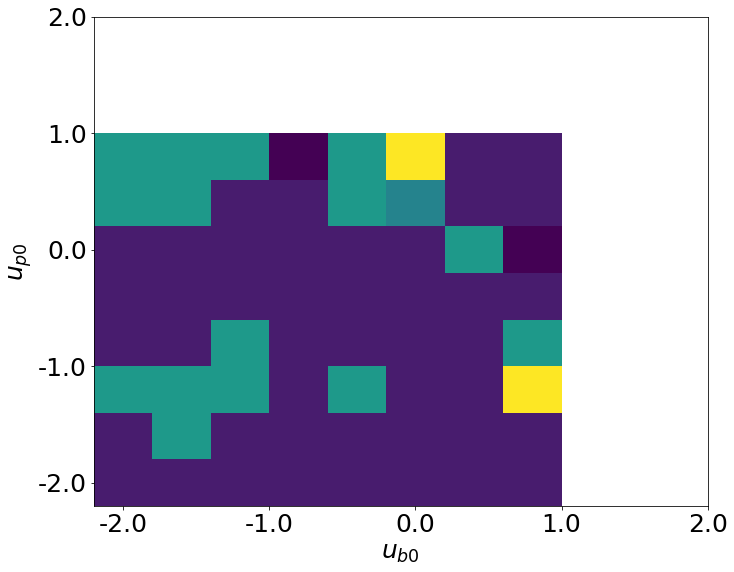

[25.67098881 25.67115289 25.67115289 25.67197328 25.67217017 25.67217017
 25.67318745 25.67318745]


In [302]:
# Когда u = 0
# s = 0.1 и 0.1
# Bpb = 0.82

fig, ax = plt.subplots(figsize=(11, 9))
# sb.heatmap(T)
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,10,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$u_{p0}$')

xticks = np.linspace(0,10,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$u_{b0}$')

# fig.colorbar(np.arange(0, 20, 1))
plt.show()
print(np.unique(T))

/home/xomaiya/.conda/envs/ml/lib/python3.7/site-packages/scipy/integrate/odepack.py:248: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


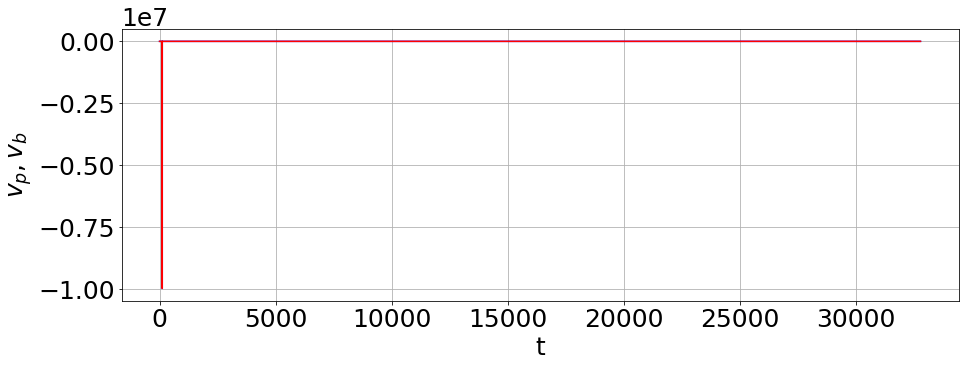

In [340]:
Bpb = 0.19 
Bbpmin = 0.09
Bbpmax = 0.09
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)

signal_draw1_inverse(args1)


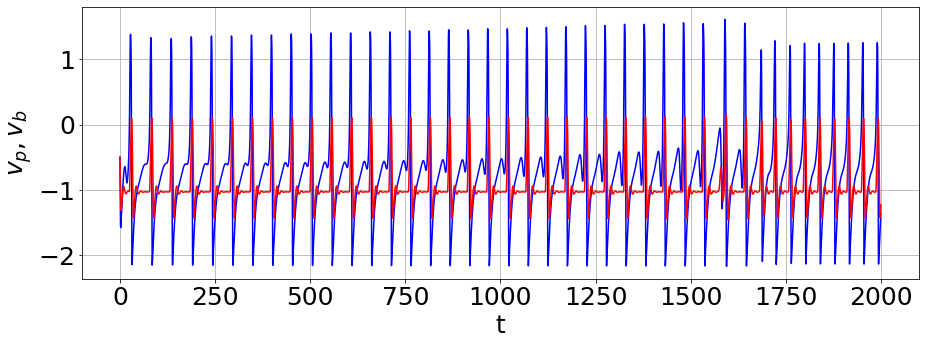

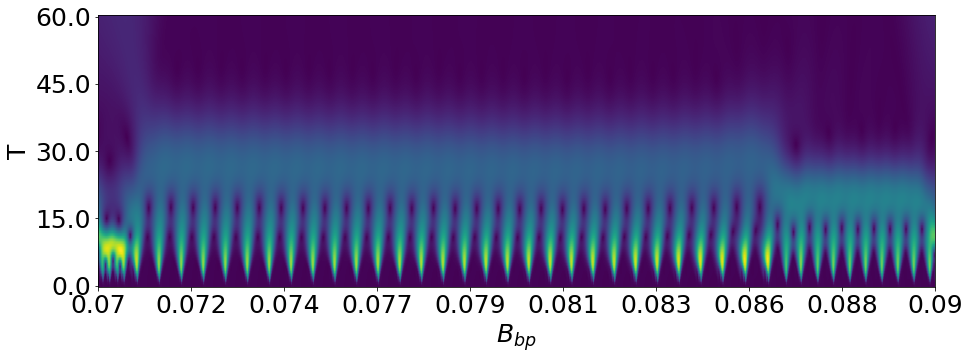

In [354]:
Bpb = 0.19 # синаптический параметр
Bbpmin = 0.07 # синаптический параметр
Bbpmax = 0.09 # синаптический параметр

scale = np.linspace(0, 60, 101)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)


signal_draw1(args1, vp0=-1.5, vb0=-1.5, up0=0.5, ub0=0.5, sbp0=0.5, spb0=0.5, ts=2000, nt=2**15)
                 
wavelet_draw(args1, scale, *sol[-1], ts=2000, nt=2**15, Bmin=Bbpmin, Bmax=Bbpmax)

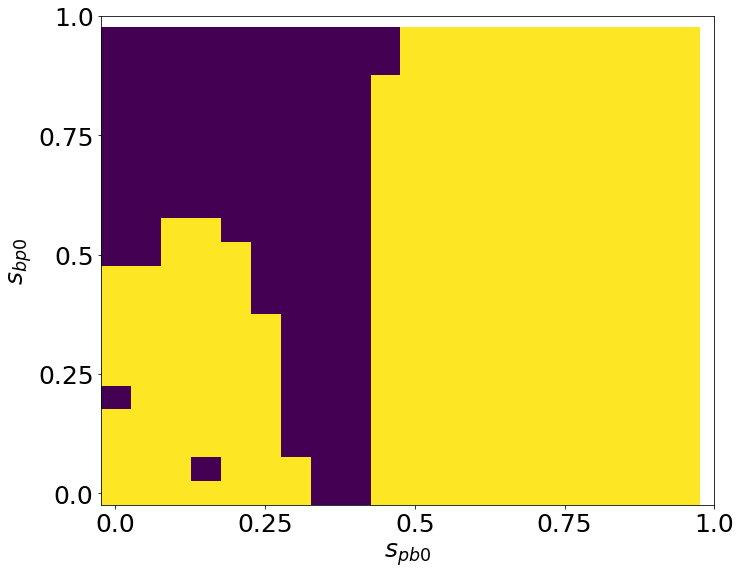

In [213]:
# Когда оба u = 0
# оба v = -0.5
fig, ax = plt.subplots(figsize=(11, 9))
# sb.heatmap(T)
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,20,5)
ylabels = np.linspace(0,1,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$s_{bp0}$')

xticks = np.linspace(0,20,5)
xlabels = np.linspace(0,1,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$s_{pb0}$')

# fig.colorbar(T)
plt.show()

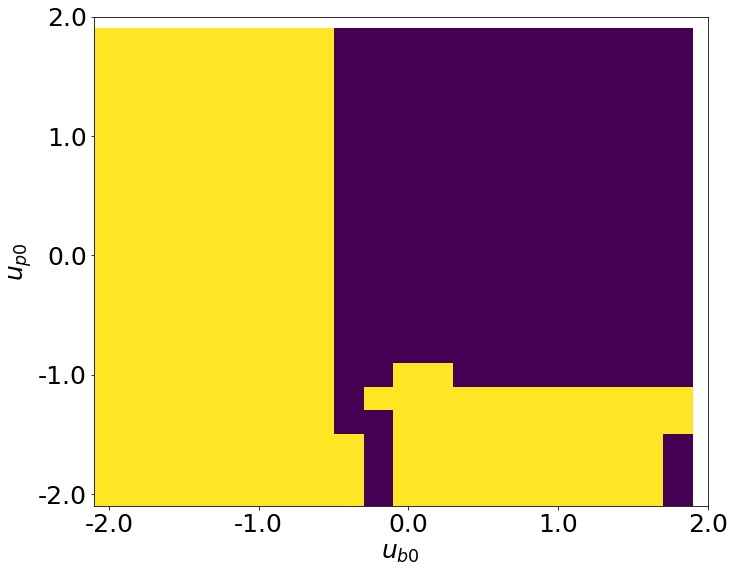

In [203]:
# Когда оба v = -0.5
# sbp = 0.5
# spb = 0.4
fig, ax = plt.subplots(figsize=(11, 9))
# sb.heatmap(T)
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,20,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$u_{p0}$')

xticks = np.linspace(0,20,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$u_{b0}$')

# fig.colorbar(T)
plt.show()

In [214]:
np.unique(np.array(T))

array([ 8.88855851,  8.8888995 ,  8.8888995 ,  8.89494535,  8.8950373 ,
        8.89528825,  8.89537829,  8.89631696,  8.90180344,  8.90283215,
        8.90317506,  8.90526697,  8.90560796,  8.90560796,  8.90663092,
        8.90663092,  8.90697191,  8.90697191, 18.97295288, 18.97295288,
       18.97306669, 18.97368826, 18.97368826, 18.97379332, 18.97379332])

In [358]:
a1 = 0.06
a2 = 0.09

all_a = [a1]
for i in range(20):
    all_a.append(all_a[-1] + i / 20 * (a2 - a1))
    print(i, all_a[-1])

0 0.06
1 0.0615
2 0.0645
3 0.069
4 0.07500000000000001
5 0.08250000000000002
6 0.09150000000000001
7 0.10200000000000001
8 0.114
9 0.1275
10 0.14250000000000002
11 0.15900000000000003
12 0.17700000000000002
13 0.1965
14 0.2175
15 0.24
16 0.264
17 0.28950000000000004
18 0.31650000000000006
19 0.3450000000000001


In [361]:
delta_t = 100
a1 = 0.06
a2 = 0.09

for t in range(2 ** 12):
    factor = int(t / delta_t) / (2000 / delta_t)
    delta_B = factor * (a2 - a1)
    ans = a1 + delta_B
    if ans >= 0.080:
        print(t)
        break
    

1400


In [379]:
Bpb = 0.19 
Bbpmin = 0.06 
Bbpmax = 0.09

scale = np.linspace(0, 60, 100)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse, init_Bpb008 = max_wavelet_bootstrap(args, scale)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
directly, init_Bpb008_d = max_wavelet_bootstrap(args, scale)


In [ ]:
Bpb = 0.19 
Bbpmin = 0.06 
Bbpmax = 0.1 

scale = np.linspace(0, 60, 100)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
directly, initB_d = max_wavelet_bootstrap(args, scale)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
inverse, init_B_inv = max_wavelet_bootstrap(args, scale)

(0.5, 0.5, -5, 0, 0.3, 0.5, 0.8, 1, 0.19, 0.06, 0.1, 0.1)


TypeError: Invalid shape (100, 4096, 50) for image data

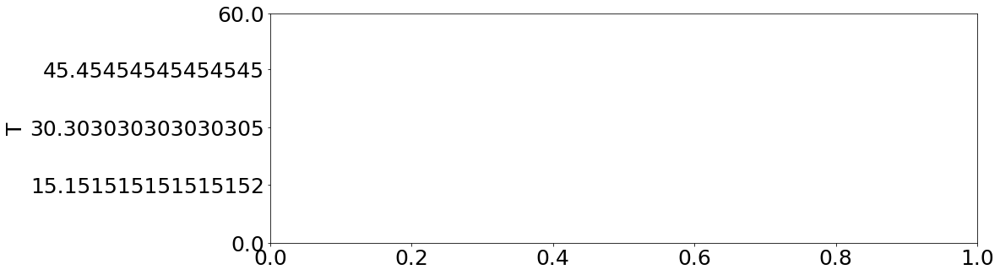

In [14]:
Bpb = 0.19 
Bbpmin = 0.06 
Bbpmax = 0.1 

scale = np.linspace(0, 60, 100)

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

wavelet_draw_smooth(args)

In [388]:
Bpb = 0.19
Bbpmin = 0.082
Bbpmax = 0.083

ts = 4000
nt = 2 ** 15
T = []
for i in range(100):
    args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, vsl)
    sol, t = calcODE(args, *init_B_inv[i], ts, nt)  
    T_one = mean_T_vp(sol[:, 0], t) / 2
    print(f'T = {T_one}')
    print(f'i = {i}')
#     plt.figure(figsize=(15, 5))
#     plt.plot(np.linspace(0, ts//2, nt//4), sol[-nt//4:, 0], 'b')
#     plt.xlabel('t')
#     plt.ylabel('$v_p$')
#     plt.grid()
#     plt.show()
    T.append(T_one)
#     vp = sol[-nt//4:, 0]
#     vb = sol[-nt//4:, 1]
#     plt.figure(figsize=(10, 10))
#     plt.plot(vb, vp, 'b')
#     plt.xlabel('$v_b$')
#     plt.ylabel('$v_p$')
#     plt.grid()
#     plt.show()


T = 25.66756737961574
i = 0
T = 25.66756737961574
i = 1
T = 25.66756737961574
i = 2
T = 25.667567379615733
i = 3
T = 25.668035405408865
i = 4
T = 25.66756737961574
i = 5
T = 25.66756737961574
i = 6
T = 25.667050937361253
i = 7
T = 25.66756737961574
i = 8
T = 25.667050937361253
i = 9
T = 25.668035405408865
i = 10
T = 25.66756737961574
i = 11
T = 25.668035405408865
i = 12
T = 25.66756737961574
i = 13
T = 25.66803540540886
i = 14
T = 25.66803540540886
i = 15
T = 25.66756737961574
i = 16
T = 25.66756737961574
i = 17
T = 25.66756737961574
i = 18
T = 25.668035405408865
i = 19
T = 25.66756737961574
i = 20
T = 25.66803540540887
i = 21
T = 25.668035405408865
i = 22
T = 25.667050937361253
i = 23
T = 25.668035405408865
i = 24
T = 25.66756737961574
i = 25
T = 25.66756737961574
i = 26
T = 25.66756737961574
i = 27
T = 25.66756737961574
i = 28
T = 25.66756737961574
i = 29
T = 25.668035405408865
i = 30
T = 25.668035405408865
i = 31
T = 25.66756737961574
i = 32
T = 25.66756737961574
i = 33
T = 25.66705

Text(0, 0.5, 'T')

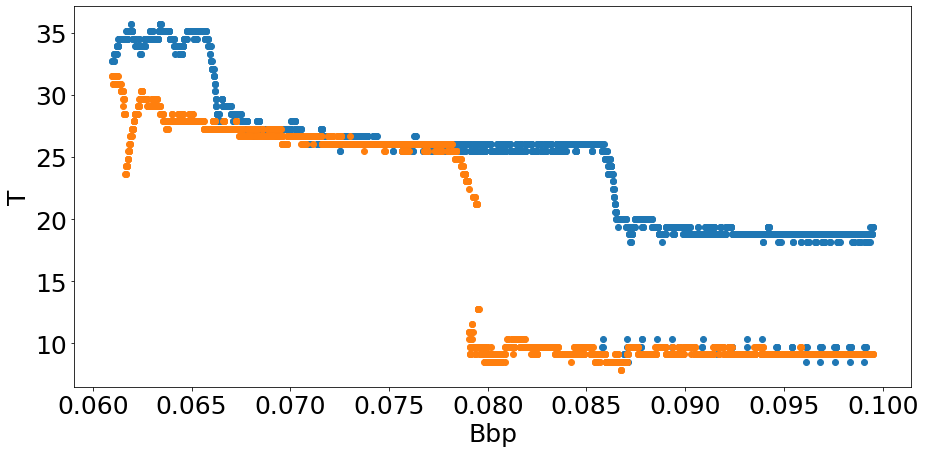

In [385]:
plt.figure(figsize=(15, 7))
plt.scatter(np.linspace(0.06, 0.1, len(directly))[100:-50], directly[100:-50])
plt.scatter(np.linspace(0.06, 0.1, len(directly))[100:-50], inverse[::-1][100:-50])
plt.xlabel('Bbp')
plt.ylabel('T')

In [421]:
Bpb = 0.19 
Bbpmin = 0.084694
Bbpmax = 0.084694
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

T = parameters_for_T(args1)

T = 26.776308796802496
vp0 = -2.0
vb0 = -2.0
T = 9.376085405322138
vp0 = -2.0
vb0 = -1.5
T = 19.353312784203617
vp0 = -2.0
vb0 = -1.0
T = 19.35483870967742
vp0 = -2.0
vb0 = -0.5
T = 19.353312784203617
vp0 = -2.0
vb0 = 0.0
T = 9.354820757613021
vp0 = -2.0
vb0 = 0.5
T = 9.376085405322138
vp0 = -2.0
vb0 = 1.0
T = 9.376448720911137
vp0 = -2.0
vb0 = 1.5
T = 26.776308796802503
vp0 = -1.5
vb0 = -2.0
T = 26.776308796802503
vp0 = -1.5
vb0 = -1.5
T = 19.354075746940516
vp0 = -1.5
vb0 = -1.0
T = 19.35331278420362
vp0 = -1.5
vb0 = -0.5
T = 19.35483870967742
vp0 = -1.5
vb0 = 0.0
T = 9.376448720911137
vp0 = -1.5
vb0 = 0.5
T = 9.373490904586571
vp0 = -1.5
vb0 = 1.0
T = 9.376448720911137
vp0 = -1.5
vb0 = 1.5
T = 26.776308796802503
vp0 = -1.0
vb0 = -2.0
T = 26.776308796802503
vp0 = -1.0
vb0 = -1.5
T = 19.35407574694052
vp0 = -1.0
vb0 = -1.0
T = 19.35407574694052
vp0 = -1.0
vb0 = -0.5
T = 19.35483870967742
vp0 = -1.0
vb0 = 0.0
T = 9.354820757613021
vp0 = -1.0
vb0 = 0.5
T = 9.354461716325067
vp0 = -1.0
v

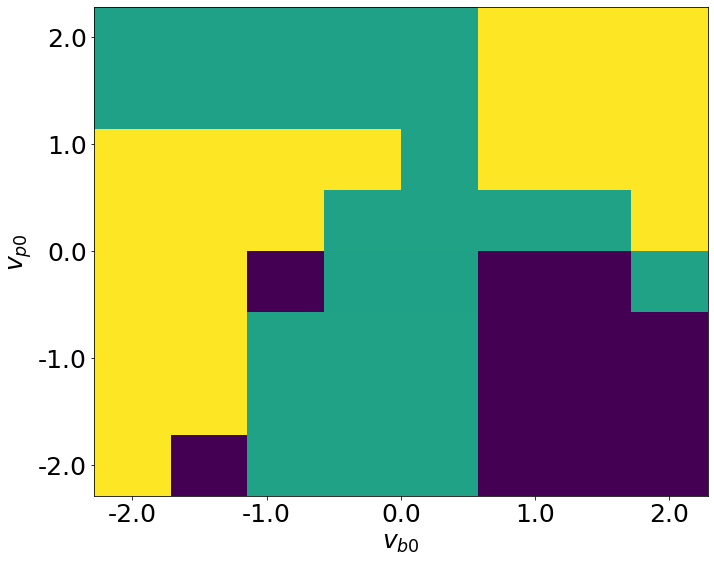

In [427]:
# Когда u = 0
# s = 0.5 и 0.5
# Bpb = 0.19 
# Bbpmin = 0.084694
# Bbpmax = 0.084694

fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,7,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$v_{p0}$')

xticks = np.linspace(0,7,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$v_{b0}$')

# fig.colorbar(np.arange(0, 20, 1))
plt.show()

In [428]:
Bpb = 0.19 
Bbpmin = 0.084694
Bbpmax = 0.084694
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

T = parameters_for_Tu(args1)

T = 9.376085405322137
vp0 = -2.0
vb0 = -2.0
T = 9.330764991320176
vp0 = -2.0
vb0 = -1.5
T = 19.35483870967742
vp0 = -2.0
vb0 = -1.0
T = 19.35407574694052
vp0 = -2.0
vb0 = -0.5
T = 19.292164112168177
vp0 = -2.0
vb0 = 0.0
T = 19.301840712733735
vp0 = -2.0
vb0 = 0.5
T = 19.30630683607169
vp0 = -2.0
vb0 = 1.0
T = 19.292164112168177
vp0 = -2.0
vb0 = 1.5
T = 19.35483870967742
vp0 = -1.5
vb0 = -2.0
T = 9.376448720911137
vp0 = -1.5
vb0 = -1.5
T = 9.355538840188927
vp0 = -1.5
vb0 = -1.0
T = 19.35483870967742
vp0 = -1.5
vb0 = -0.5
T = 19.292164112168177
vp0 = -1.5
vb0 = 0.0
T = 19.292164112168177
vp0 = -1.5
vb0 = 0.5
T = 19.306306836071688
vp0 = -1.5
vb0 = 1.0
T = 19.292164112168177
vp0 = -1.5
vb0 = 1.5
T = 26.775632278119534
vp0 = -1.0
vb0 = -2.0
T = 19.35483870967742
vp0 = -1.0
vb0 = -1.5
T = 9.373490904586573
vp0 = -1.0
vb0 = -1.0
T = 9.375722089733138
vp0 = -1.0
vb0 = -0.5
T = 19.292164112168177
vp0 = -1.0
vb0 = 0.0
T = 19.292164112168177
vp0 = -1.0
vb0 = 0.5
T = 26.775632278119534
vp0 = -1.

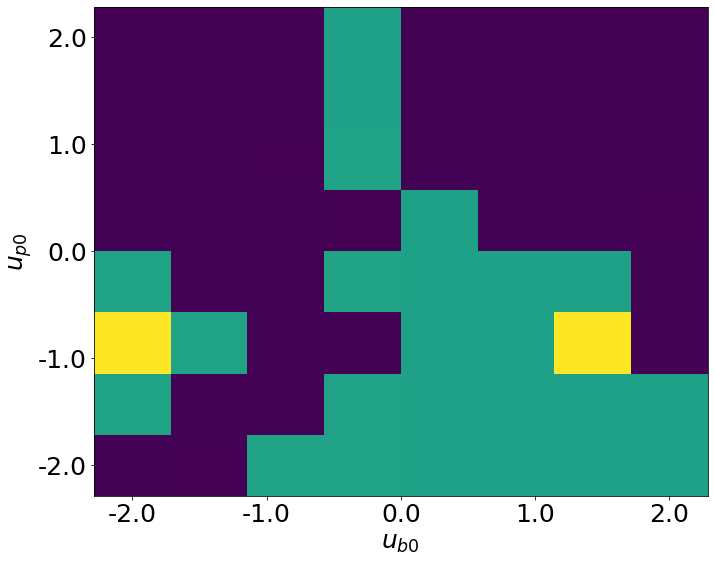

In [430]:
# Когда оба v = -0.5
# sbp = 0.5
# spb = 0.4
fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,7,5)
ylabels = np.linspace(-2,2,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$u_{p0}$')

xticks = np.linspace(0,7,5)
xlabels = np.linspace(-2,2,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$u_{b0}$')

plt.show()

In [432]:
Bpb = 0.19 
Bbpmin = 0.084694
Bbpmax = 0.084694
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

T = parameters_for_T3(args1)

T = 9.377799400042008
sbp0 = 0.0
spb0 = 0.0
T = 9.363796789811845
sbp0 = 0.0
spb0 = 0.05
T = 9.365390168308677
sbp0 = 0.0
spb0 = 0.1
T = 9.364155831099797
sbp0 = 0.0
spb0 = 0.15000000000000002
T = 9.37815844132996
sbp0 = 0.0
spb0 = 0.2
T = 9.365390168308677
sbp0 = 0.0
spb0 = 0.25
T = 9.349435138293728
sbp0 = 0.0
spb0 = 0.30000000000000004
T = 9.387134473528784
sbp0 = 0.0
spb0 = 0.35000000000000003
T = 9.374780478916676
sbp0 = 0.0
spb0 = 0.4
T = 19.381137375867844
sbp0 = 0.0
spb0 = 0.45
T = 19.3833980061994
sbp0 = 0.0
spb0 = 0.5
T = 26.776629856516454
sbp0 = 0.0
spb0 = 0.55
T = 26.776629856516454
sbp0 = 0.0
spb0 = 0.6000000000000001
T = 26.775595330771505
sbp0 = 0.0
spb0 = 0.65
T = 9.377799400042008
sbp0 = 0.0
spb0 = 0.7000000000000001
T = 19.35468983889949
sbp0 = 0.0
spb0 = 0.75
T = 19.356922900568463
sbp0 = 0.0
spb0 = 0.8
T = 19.35915596223744
sbp0 = 0.0
spb0 = 0.8500000000000001
T = 26.776308796802503
sbp0 = 0.0
spb0 = 0.9
T = 26.775256434406778
sbp0 = 0.0
spb0 = 0.9500000000000001
T

T = 9.364155831099797
sbp0 = 0.35000000000000003
spb0 = 0.4
T = 19.384151549643256
sbp0 = 0.35000000000000003
spb0 = 0.45
T = 19.381137375867848
sbp0 = 0.35000000000000003
spb0 = 0.5
T = 26.776629856516454
sbp0 = 0.35000000000000003
spb0 = 0.55
T = 9.364155831099797
sbp0 = 0.35000000000000003
spb0 = 0.6000000000000001
T = 9.364155831099795
sbp0 = 0.35000000000000003
spb0 = 0.65
T = 19.351712423340857
sbp0 = 0.35000000000000003
spb0 = 0.7000000000000001
T = 19.356922900568463
sbp0 = 0.35000000000000003
spb0 = 0.75
T = 19.354689838899485
sbp0 = 0.35000000000000003
spb0 = 0.8
T = 19.35915596223744
sbp0 = 0.35000000000000003
spb0 = 0.8500000000000001
T = 26.776308796802503
sbp0 = 0.35000000000000003
spb0 = 0.9
T = 26.775256434406778
sbp0 = 0.35000000000000003
spb0 = 0.9500000000000001
T = 19.32989642168593
sbp0 = 0.4
spb0 = 0.0
T = 9.363796789811845
sbp0 = 0.4
spb0 = 0.05
T = 9.374780478916676
sbp0 = 0.4
spb0 = 0.1
T = 9.374780478916676
sbp0 = 0.4
spb0 = 0.15000000000000002
T = 9.374780478

T = 19.351712423340857
sbp0 = 0.7000000000000001
spb0 = 0.8
T = 19.35915596223744
sbp0 = 0.7000000000000001
spb0 = 0.8500000000000001
T = 26.776308796802503
sbp0 = 0.7000000000000001
spb0 = 0.9
T = 26.776308796802503
sbp0 = 0.7000000000000001
spb0 = 0.9500000000000001
T = 19.34947936167188
sbp0 = 0.75
spb0 = 0.0
T = 19.34873500778222
sbp0 = 0.75
spb0 = 0.05
T = 19.35915596223744
sbp0 = 0.75
spb0 = 0.1
T = 26.776629856516454
sbp0 = 0.75
spb0 = 0.15000000000000002
T = 26.775595330771505
sbp0 = 0.75
spb0 = 0.2
T = 9.364155831099797
sbp0 = 0.75
spb0 = 0.25
T = 9.363796789811845
sbp0 = 0.75
spb0 = 0.30000000000000004
T = 9.374780478916676
sbp0 = 0.75
spb0 = 0.35000000000000003
T = 9.365390168308677
sbp0 = 0.75
spb0 = 0.4
T = 9.378158441329962
sbp0 = 0.75
spb0 = 0.45
T = 19.380383832424
sbp0 = 0.75
spb0 = 0.5
T = 9.364155831099797
sbp0 = 0.75
spb0 = 0.55
T = 19.356178546678805
sbp0 = 0.75
spb0 = 0.6000000000000001
T = 19.356922900568463
sbp0 = 0.75
spb0 = 0.65
T = 19.352456777230515
sbp0 = 0

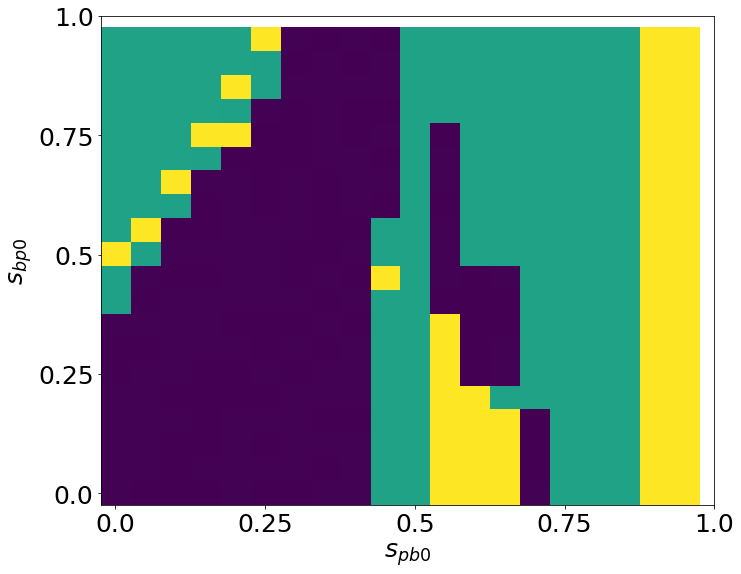

In [433]:
# Когда оба u = 0
# оба v = -0.5
fig, ax = plt.subplots(figsize=(11, 9))
plt.imshow(T, aspect='auto', origin='lower')
yticks = np.linspace(0,20,5)
ylabels = np.linspace(0,1,5)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabels)
ax.set_ylabel('$s_{bp0}$')

xticks = np.linspace(0,20,5)
xlabels = np.linspace(0,1,5)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabels)
ax.set_xlabel('$s_{pb0}$')

plt.show()

In [434]:
np.unique(T)

array([ 9.30383689,  9.32896978,  9.34943514,  9.36379679,  9.36379679,
        9.36415583,  9.36415583,  9.36415583,  9.36539017,  9.36575133,
        9.36774624,  9.37405815,  9.37478048,  9.3777994 ,  9.37815844,
        9.37815844,  9.38713447,  9.38713447,  9.38850478,  9.38886594,
       19.32236099, 19.32311453, 19.32914288, 19.32989642, 19.32989642,
       19.34873501, 19.34947936, 19.35022372, 19.35022372, 19.35171242,
       19.35245678, 19.35394549, 19.35468984, 19.35468984, 19.35543419,
       19.35543419, 19.35617855, 19.3569229 , 19.35841161, 19.35915596,
       19.37887675, 19.37963029, 19.38038383, 19.38113738, 19.38113738,
       19.38189092, 19.38189092, 19.38264446, 19.38339801, 19.38339801,
       19.38415155, 26.77525643, 26.77559533, 26.7763088 , 26.7763088 ,
       26.77662986, 26.77662986])

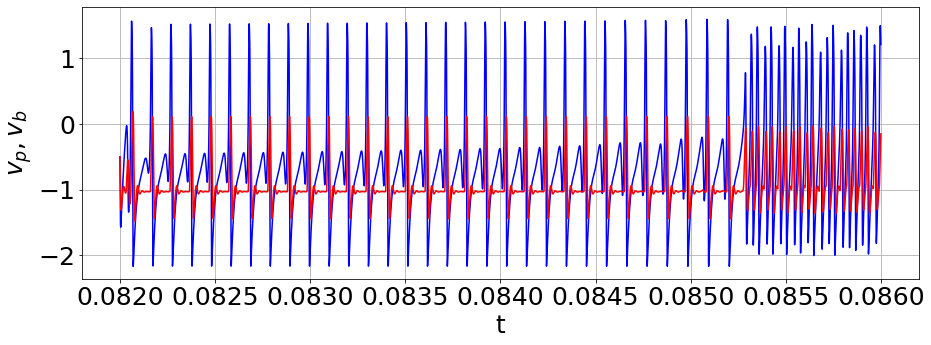

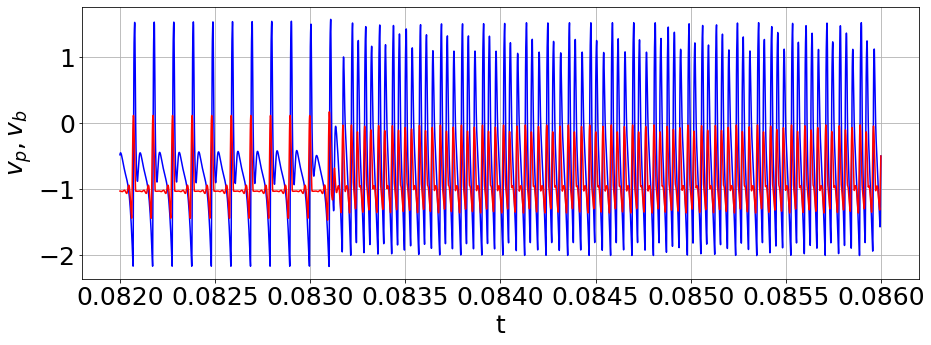

In [477]:
Bpb = 0.19 
Bbpmin = 0.082
Bbpmax = 0.086

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
signal_draw1(args1, vp0=-0.5, vb0=-0.5, up0=0, ub0=0, sbp0=0.5, spb0=0.4, ts=2000, nt=2**20)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
signal_draw1(args1, vp0=-0.5, vb0=-0.5, up0=0, ub0=0, sbp0=0.5, spb0=0.4, ts=2000, nt=2**20)


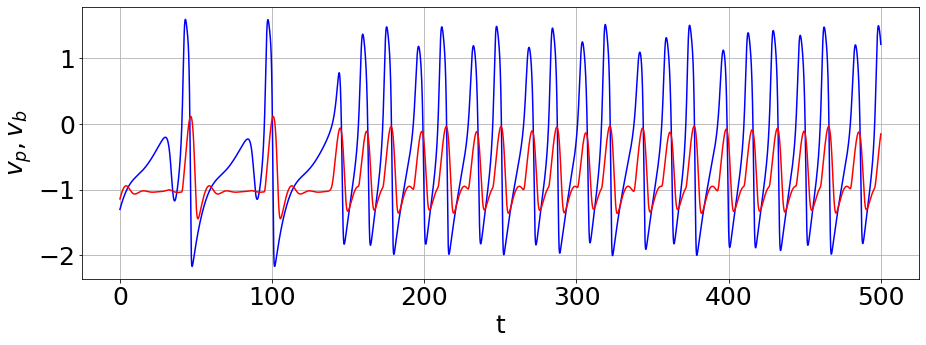

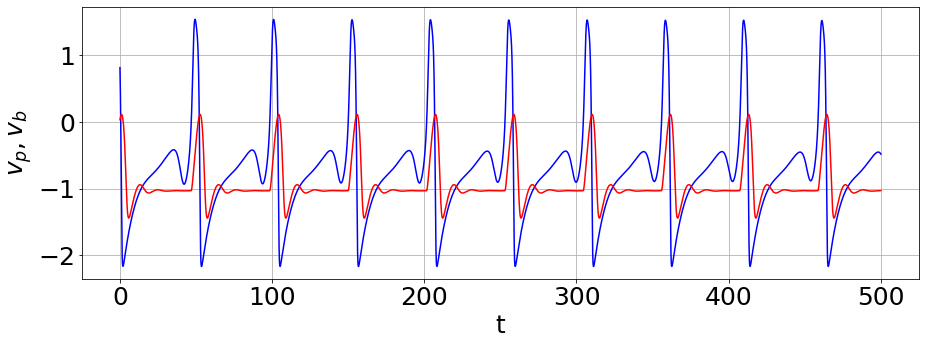

In [10]:
Bpb = 0.19 
Bbpmin = 0.082
Bbpmax = 0.086

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
signal_draw1(args1, vp0=-0.5, vb0=-0.5, up0=0, ub0=0, sbp0=0.5, spb0=0.4, ts=2000, nt=2**20)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
signal_draw1(args1, vp0=-0.5, vb0=-0.5, up0=0, ub0=0, sbp0=0.5, spb0=0.4, ts=2000, nt=2**20)


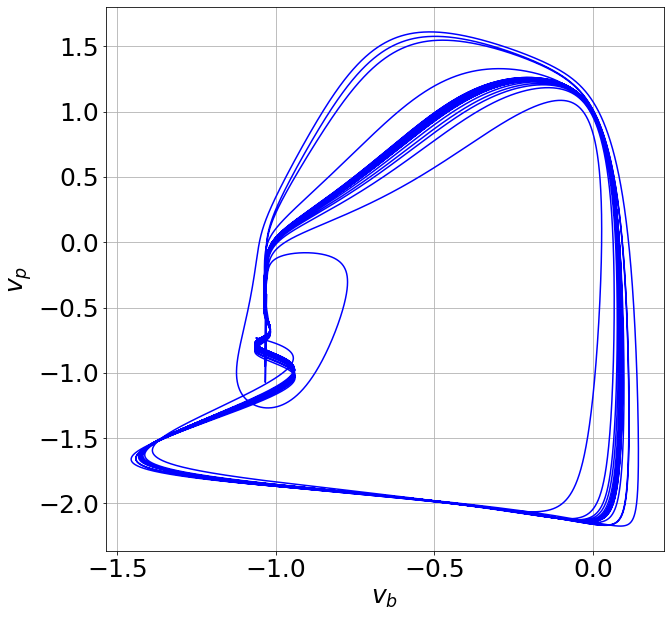

In [470]:
Bpb = 0.19 
Bbpmin = 0.08
Bbpmax = 0.09
args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)

phase_portrait(args1, vp0=-0.5, vb0=-0.5, up0=0, ub0=0, sbp0=0.5, spb0=0.4, ts=2000, nt=2**20)

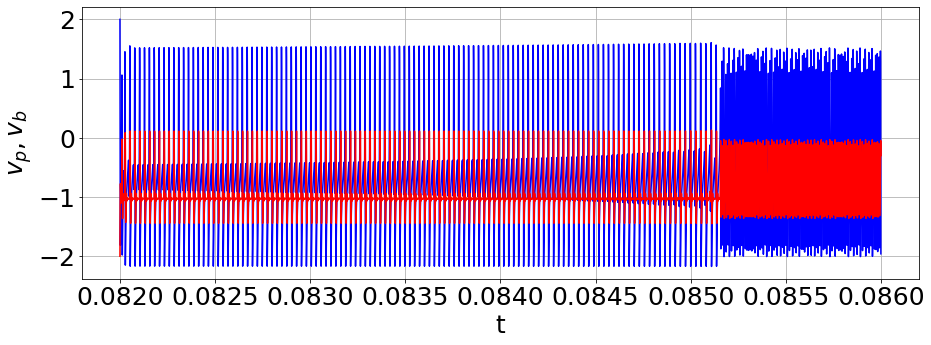

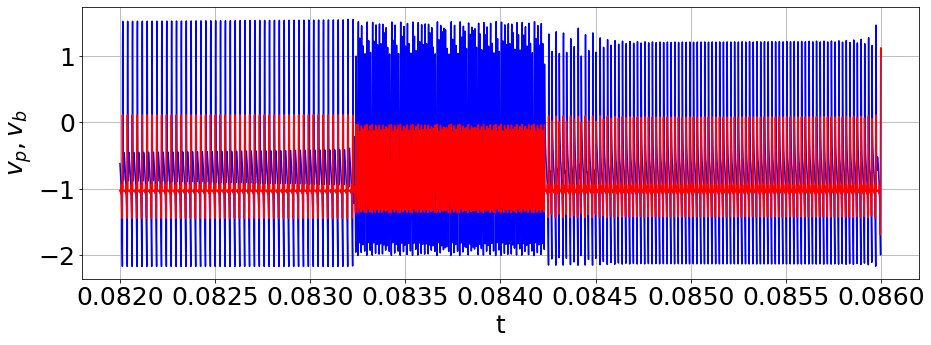

In [478]:
Bpb = 0.19 
Bbpmin = 0.082
Bbpmax = 0.086

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmin, Bbpmax, vsl)
signal_draw1(args1, vp0=2, vb0=-2, up0=0, ub0=0, sbp0=0.5, spb0=0.5, ts=8000, nt=2**20)

args1 = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbpmax, Bbpmin, vsl)
signal_draw1(args1, vp0=1, vb0=1, up0=0, ub0=0, sbp0=0.5, spb0=0.5, ts=8000, nt=2**20)


In [479]:
Bpb = 0.19 
Bbp = 0.0835

args = (Iext, G, Ein, Eex, eps, a, b, A, Bpb, Bbp, vsl)

lyapunov_first(args, vp0=1, vb0=1, up0=0, ub0=0, sbp0=0.5, spb0=0.5)

-0.0007662291022471764

# Параметры для нижнего цикла при  Bpb = 0.19 и Bbp = 0.09
## s_pb0 = 0.27 .. 0.47
## s_bp0 = 0 .. 1
## vb0 = -0.5 для любого vp0
## vb0 = -1 для vp0 = -1.5 .. 0.5

## ub0 = up0 = 0
